<a href="https://colab.research.google.com/github/SCaceres10/Programacion_aplicada_publico/blob/main/Cuaderno_Campos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> Cuaderno Campos Electromagneticos
## <center>POR:
### <center>Joel Eduardo Reyes Barrios COD.20212005011
### <center>Yofre Nicolas Fajardo Gómez COD.20212005136

#<center> Primer Corte
#1. Fuerza Electrica:


> La fuerza electrica se entiende desde la ley de coulomb,que resumidamente se expresa como dos cargas electricas estacionarias se repelen o atraen entre si con una fuerza proporcional al valor de las cargas y inversamente proporconal a su distancia mutua,


$$\overrightarrow{F}=K\frac{q_{1}q_{2}}{r^{2}}\overrightarrow{r}$$



> donde K:


$$k=\frac{1}{4\Pi\varepsilon_{0}}$$

In [ ]:
import numpy as np
from numpy import ndarray
import scipy.constants as sc
from scipy import constants  as cte
from scipy.special import *
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import *
import mpl_toolkits.mplot3d.art3d as art3d
import matplotlib.patches as patches

θ = np.linspace(0,2*np.pi,60)

def Rotar(r,Z):
  fig=plt.figure()
  ax=fig.add_subplot(111,projection='3d')
  R, P = np.meshgrid(r, θ)
  Z_axis = Z(R)
  X_axis, Y_axis = R*np.cos(P), R*np.sin(P)
  ax.plot_surface(X_axis, Y_axis, Z_axis, cmap=plt.cm.inferno)

def Polares(φ,R):
  Φ=φ[np.sin(φ)!=0]
  X= R(Φ)*np.sin(Φ)
  Z=lambda X: X*np.cos(Φ)/np.sin(Φ)
  Rotar(X,Z)

def mean_vectors_arrays(arr_array):
  return np.mean( np.array(arr_array), axis=0 )

def calc_potencial(x, y, p):
  x1=(x-p[0])
  y1=(y-p[1])
  x1=x1[x1!=0]
  y1=y1[y1!=0]
  phi1=np.arctan2(y1, x1)
  r=p[2]/((x1**2+y1**2)**(1/2)*4*np.pi*cte.epsilon_0)
  u=r*np.cos(phi1)
  v=r*np.sin(phi1)
  return u,v

def calc_dielectric_potencial(x, y, p, dieletric_x):
  x1=(x-p[0])
  y1=(y-p[1])
  x1=x1[x1!=0]
  y1=y1[y1!=0]
  u,v=np.select([x1+p[0]<dieletric_x,x1+p[0]>=dieletric_x],[
      [
        (p[2]/((x1**2+y1**2)**(1/2)*4*np.pi*cte.epsilon_0))*np.cos(np.arctan2(y1, x1)),
        (p[2]/((x1**2+y1**2)**(1/2)*4*np.pi*cte.epsilon_0))*np.sin(np.arctan2(y1, x1))
      ],(x1*0,y1*0)])
  return u,v

def calc_field(x, y, p):
  x1=(x-p[0])
  y1=(y-p[1])
  x1=x1[x1!=0]
  y1=y1[y1!=0]
  phi1=np.arctan2(y1, x1)
  r=p[2]/((x1**2+y1**2)*4*np.pi*cte.epsilon_0)
  u=r*np.cos(phi1)
  v=r*np.sin(phi1)
  return u,v

def calc_dielectric_field(x, y, p, dieletric_x):
  x1=(x-p[0])
  y1=(y-p[1])
  x1=x1[x1!=0]
  y1=y1[y1!=0]
  u,v=np.select([x1+p[0]<dieletric_x,x1+p[0]>=dieletric_x],[
      [
        (p[2]/((x1**2+y1**2)*4*np.pi*cte.epsilon_0))*np.cos(np.arctan2(y1, x1)),
        (p[2]/((x1**2+y1**2)*4*np.pi*cte.epsilon_0))*np.sin(np.arctan2(y1, x1))
      ],(x1*0,y1*0)])
  return u,v

def normalice(x,y):
  r=(x**2+y**2)**(1/2)
  u=x/(r)
  v=y/(r)
  return u,v

def calc_potencial_3D(x, y, z, p):
  x1=(x-p[0])
  y1=(y-p[1])
  z1=(z-p[2])
  d=(x1**2+y1**2+z1**2)**(1/2)
  phi1=np.arctan2(y1, x1)
  theta1=np.arccos(z1/d)
  r=p[3]/(d*4*np.pi*cte.epsilon_0)
  u=r*np.sin(theta1)*np.cos(phi1)
  v=r*np.sin(theta1)*np.sin(phi1)
  w=r*np.cos(theta1)
  return u,v,w

def calc_dielectric_potencial_3D(x, y, z,p, dieletric_x):
  x1=(x-p[0])
  y1=(y-p[1])
  z1=(z-p[2])
  u,v,w =np.select([x1+p[0]<dieletric_x,x1+p[0]>=dieletric_x],[
      calc_potencial_3D(x,y,z,p)
      ,(x1*0,y1*0,z1*0)])

  return u,v,w

def calc_field_3D(x, y, z, p):
  x1=(x-p[0])
  y1=(y-p[1])
  z1=(z-p[2])
  x1=x1
  y1=y1
  z1=z1
  d=(x1**2+y1**2+z1**2)**(1/2)
  phi1=np.arctan2(y1, x1)
  theta1=np.arccos(z1/d)
  r=p[3]/(d**2*4*np.pi*cte.epsilon_0)
  u=r*np.sin(theta1)*np.cos(phi1)
  v=r*np.sin(theta1)*np.sin(phi1)
  w=r*np.cos(theta1)
  return u,v,w
def calc_dielectric_field_3D(x, y,z, p, dieletric_x):
  x1=(x-p[0])
  y1=(y-p[1])
  z1=(z-p[2])
  x1=x1
  y1=y1
  z1=z1
  u,v,w =np.select([x1+p[0]<dieletric_x,x1+p[0]>=dieletric_x],[
      calc_field_3D(x,y,z,p)
      ,(x1*0,y1*0,z1*0)])
  return u,v,w

def normalice_3D(x,y,z,factor=1):
  r=(x**2+y**2+z**2)**(1/2)+0.001
  u=(x*factor)/(r)
  v=(y*factor)/(r)
  w=(z*factor)/(r)
  return u,v,w

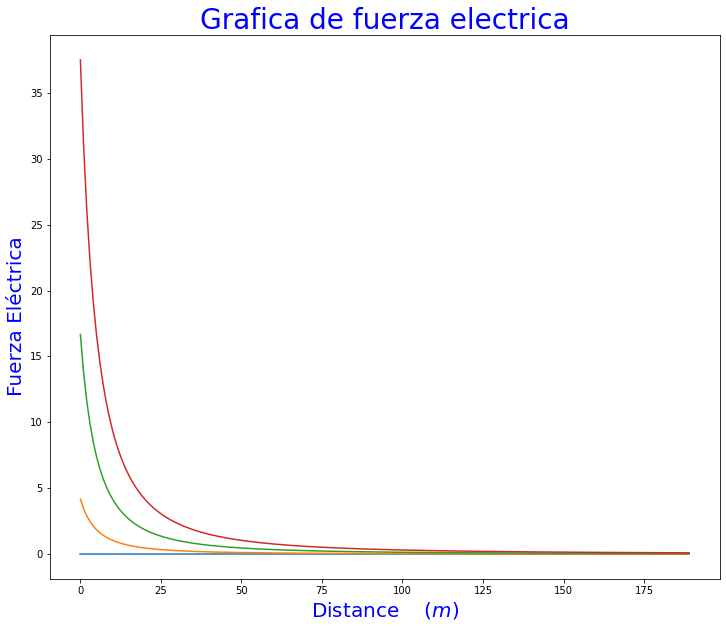

In [ ]:
r=np.arange(0.1,2,0.01)
Eo= sc.epsilon_0
plt.figure(figsize=(12,10))
for q1 in range (4):
  q2=q1/6
  Fe=((q1*q2)/(4*(np.pi)**Eo*(r**2)))
  plt.plot(Fe)
  plt.title("Grafica de fuerza electrica",fontsize=28, color="blue")
  plt.xlabel("Distance    $(m)$", fontsize=20, color="blue")
  plt.ylabel("Fuerza Eléctrica   ", fontsize=20, color="blue")
  plt.grid()



##2. Fuerza Gravitacional


> Es la fuerza que experimenta todo cuerpo en virtud de su masa, Newton la describio como una fuerza atractiva la cual dependía de la interacción entre las masas y la distancia de separación entre ellas.

>Matemáticamente la fuerza gravitacional se expresa como:

$${F}=G\frac{m_{1}m_{2}}{r^{2}}$$




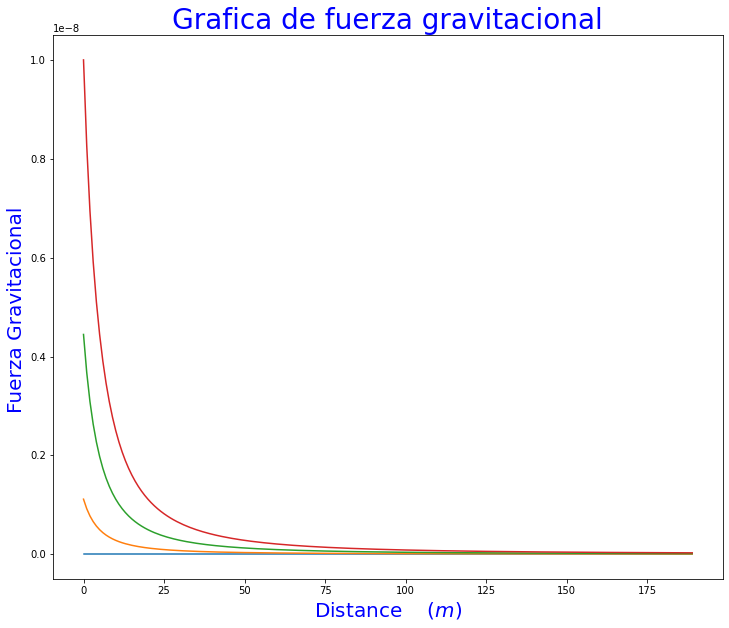

In [ ]:
r=np.arange(0.1,2,0.01)
plt.figure(figsize=(12,10))
G= sc.G
for m1 in range (4):
  m2=m1/6
  Fg=((m1*m2)/(r**2))*G
  plt.plot(Fg)
  plt.title("Grafica de fuerza gravitacional",fontsize=28, color="blue")
  plt.xlabel("Distance    $(m)$", fontsize=20, color="blue")
  plt.ylabel("Fuerza Gravitacional ", fontsize=20, color="blue")
  plt.grid()

##3. Comparación entre Fe y Fg
> Al momento de comparar las dos fuerzas, se puede observar que la fuerza electrica tiene mayor magnitud que la fuerza de gravitación, esto se puede demostrar al realizar la division de ambas, obteniendo que:

$$\frac{Fe}{Fg} > \frac{Fg}{Fe} $$

como se puede observar acontinuacion, donde asumimos tanto el valor de la carga y la masa de misma magnitud, a una misma distancia r.

In [ ]:
q=1
m=1
r2=1
Fe=((q1**2)/(4*(np.pi)**Eo*(r2**2)))
Fg=((m**2)/(r2**2))*G

Mag1=Fe/Fg #Calculo de cual tiene mayor magnitud
Mag2 = Fg/Fe

print (Mag1,">",Mag2)

33711400446.147083 > 2.9663555555856216e-11


##4. Campo Electrico
>

Es un campo de fuerza creado por la atraccion y/o repulsion de distintas cargas eléctricas.En general podemos considerarlo un campo vectorial en el cual una carga determinada sufre bajo los efectos de una fuerza electrica, los cuales pueden ser consecuencia de la presencia de cargas eléctricas o bien campos magneticos variables.
Podemos calcularla gracias a la siguiente ecuacion:
$${E}=\frac{1}{4\Pi\varepsilon_{0}}\frac{Q}{r^{2}}$$



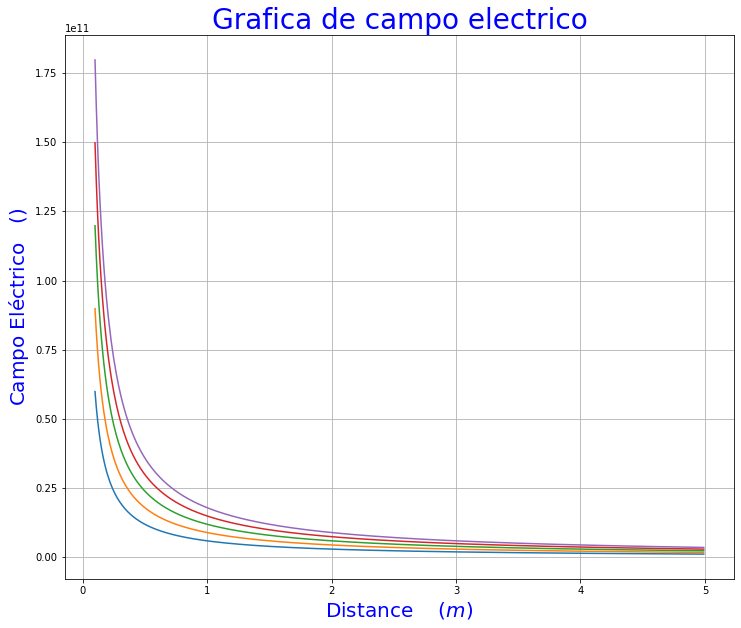

In [ ]:

plt.figure(figsize=(12,10))
p=np.arange(0.1,5,0.01)
for q1 in range (2,7,1):
  E=(q1/(12*np.pi*Eo*p))
  plt.plot(p,E)
  plt.title("Grafica de campo electrico",fontsize=28, color="blue")
  plt.xlabel("Distance    $(m)$", fontsize=20, color="blue")
  plt.ylabel("Campo Eléctrico   $()$", fontsize=20, color="blue")
  plt.grid()

##5. Campo Gravitacional
>

Es el conjunto de fuerzas que representan, comúnmente como fuerza de gravedad, las cual constituye una de las 4 fuerzas fundamentales del universo.
La presencia de un cuerpo de masa (M) genera en el espacio y a su alrededor un campo de fuerza gravitacional que generalmente altera la trayectoria de objetos masivos bajo su influencia. la podemos calcular de la siguiente manera:
$${F_{g}}={m}{E_{g}}$$



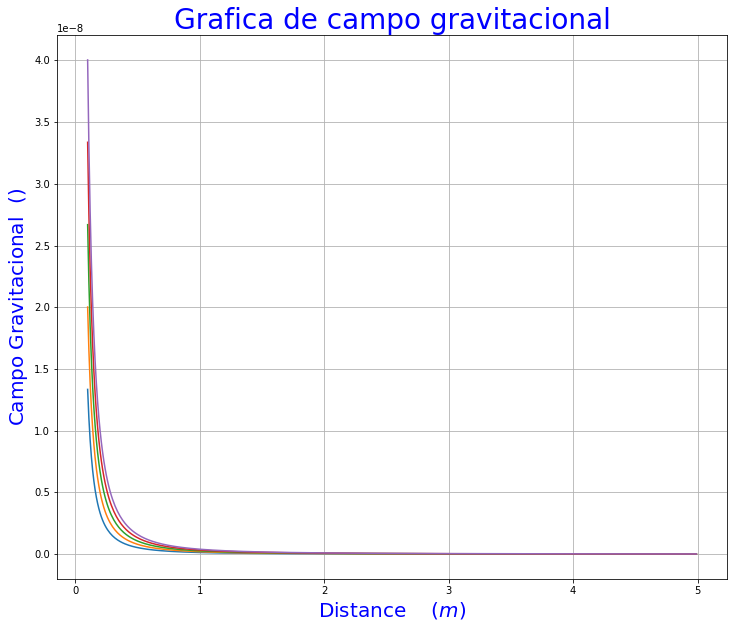

In [ ]:
plt.figure(figsize=(12,10))
p=np.arange(0.1,5,0.01)
for m1 in range (2,7,1):
  Gr=(G*m1/(p**2))
  plt.plot(p,Gr)
  plt.title("Grafica de campo gravitacional",fontsize=28, color="blue")
  plt.xlabel("Distance    $(m)$", fontsize=20, color="blue")
  plt.ylabel("Campo Gravitacional  $()$", fontsize=20, color="blue")
  plt.grid()

##6. Comparación Ee y g


Al momento de la comparación se puede visualizar que la intensidad de campo electrico es mucho mayor con respecto a la del campo gravitacional (G=6,67x10^-11) ya que en este caso las fuerzas dentro del campo electrico pueden ser tanto de atracción como de repulsión, en cambio, el gavitacional solo son de atracción.(K=9x10^9)
$${Fe} >{Fg} $$


In [ ]:
q=1
m=1
r2=1
E=(q/(4*(np.pi)**Eo*(r2**2)))
Gr=((m)/(r2**2))*G

Mag1=Fe/Fg #Calculo de cual tiene mayor magnitud
Mag2 = Fg/Fe

print (Mag1,">",Mag2)

33711400446.147083 > 2.9663555555856216e-11


##7. Determinación de la Permitividad Eléctrica del Vacío

Esta determinada por la tendencia de un material a polarizarse ante la aplicación de un camopo eléctico y de esa forma poder anular parcialmente el campo interno del material.
$${\varepsilon_{o}}=\frac{1}{4\Pi\varepsilon_{0}}\frac{1}{C^{2}U_{0}}$$
donde C es la velocidad de la luz y es Uo la permeabilidad magnética del vacío.

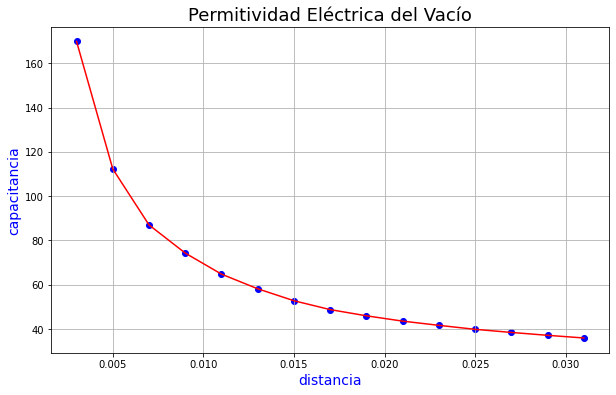

In [ ]:

plt.figure(figsize=(10,6))

x=[0.031,0.029,0.027,0.025,0.023,0.021,0.019,0.017,0.015,0.013,0.011,0.009,0.007,0.005,0.003]
y=[36,37.2,38.5,39.9,41.7,43.6,46,48.8,52.8,58.2,64.8,74.3,87,112.25,169.8]

plt.scatter(x,y,color='blue')
plt.plot(x,y,color='Red')
plt.title('Permitividad Eléctrica del Vacío',color="black",fontsize="18")
plt.ylabel("capacitancia",color="Blue",fontsize="14")
plt.xlabel("distancia",color="Blue",fontsize="14")
plt.grid()
plt.show()



##8. Hilo Infinito Homogeneamente Cargado Electricamente


El ejemplo más simple es el de un hilo rectilíneo infinitamente largo, dotado de una densidad lineal uniforme de carga, λ0. Este modelo sirve para aproximar el campo eléctrico debido a un cable como los de los tendidos de alta tensión
  $$E=\frac{λ}{2πɛ_0p}\overrightarrow{p}$$

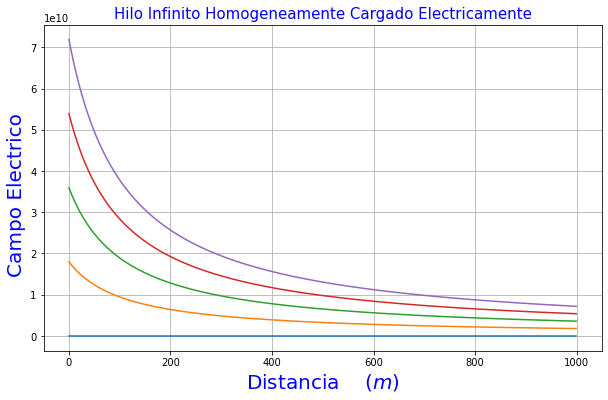

In [ ]:
Po= np.linspace(1,10,1000)
plt.figure(figsize=(10,6))
for λ in range (5):
  E=(λ)/(2*(np.pi)*Eo*Po)
  plt.plot(E)
  plt.title("Hilo Infinito Homogeneamente Cargado Electricamente",fontsize=15, color="blue")
  plt.xlabel("Distancia    $(m)$", fontsize=20, color="blue")
  plt.ylabel("Campo Electrico  ", fontsize=20, color="blue")
  plt.grid()

## 9. Espira circular Uniformemente cargada Electricamente 2D y 3D

El campo total producido por el disco cargado es la suma de los campos producidos por todos los anillos que forman el disco.
$$\overrightarrow{E}=\frac{λ}{4πɛ_o}\oint\frac{dl}{(a^{2}+b^{2})}cosθ\hat{k}=\frac{λ}{4πɛ_o}\oint\frac{dl}{(a^{2}+b^{2})}\frac{a}{(a^{2}+b^{2})^{\frac{1}{2}}}\hat{k}$$

$$⇒\overrightarrow{E}=\frac{λ}{4πɛ_o}\frac{2πa^{2}}{(a^{2}+z^{2})^{\frac{3}{2}}}\hat{k}$$
$${\varepsilon_{o}}=\frac{λ}{2\varepsilon_{0}}\frac{a*z}{(a*z^{2})^{3/2}}\overrightarrow{z}$$

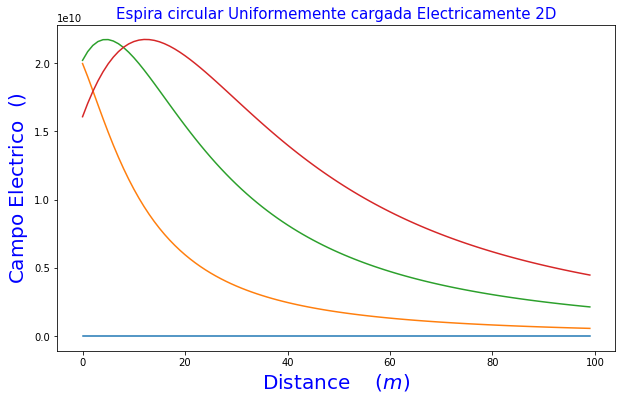

In [ ]:
Z=np.linspace(1,10,100)
λ=1
plt.figure(figsize=(10,6))
for a in range (4):
  E= (λ*(a**2)*Z)/(2*Eo*(((a**2)+(Z**2))**(3/2)))
  plt.plot(E)
  plt.title("Espira circular Uniformemente cargada Electricamente 2D",fontsize=15, color="blue")
  plt.xlabel("Distance    $(m)$", fontsize=20, color="blue")
  plt.ylabel("Campo Electrico  $()$", fontsize=20, color="blue")
  plt.grid()


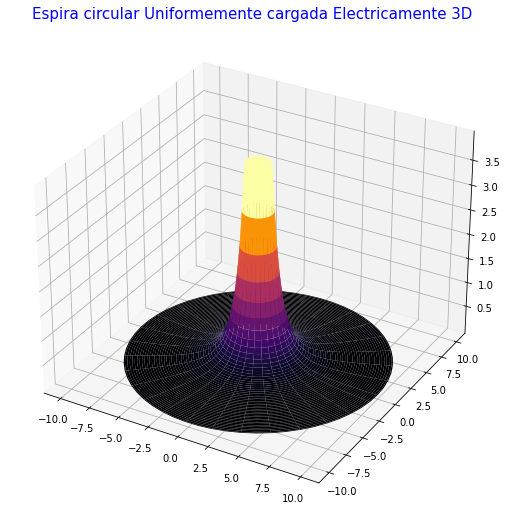

In [ ]:
z2=np.linspace(1,10,100)
E=lambda z2,λ,a:(λ*a**2)/(cte.epsilon_0*(a**2+z2**2)**(3/2))
plt.rcParams["figure.figsize"] = (9, 9)

λ=1
for a in range(1,2):
  Y=lambda R: E(R,λ,a)
  Rotar(z2,Y)
  plt.title("Espira circular Uniformemente cargada Electricamente 3D",fontsize=15, color="blue")
  plt.show()


##10. Disco Uniformemente cargado eléctricamente 2D y 3D

Para un disco de radio r tenemos que existe un campo electrico perpenticular al centro de este y se encentra auna distancia x por lo cual definimos la ecuacion de campo electrico de la siguiente manera:
$$E=\frac{int_0^R k(xσ 2πa da)}{(a^2+x^2)^{1.5}}$$


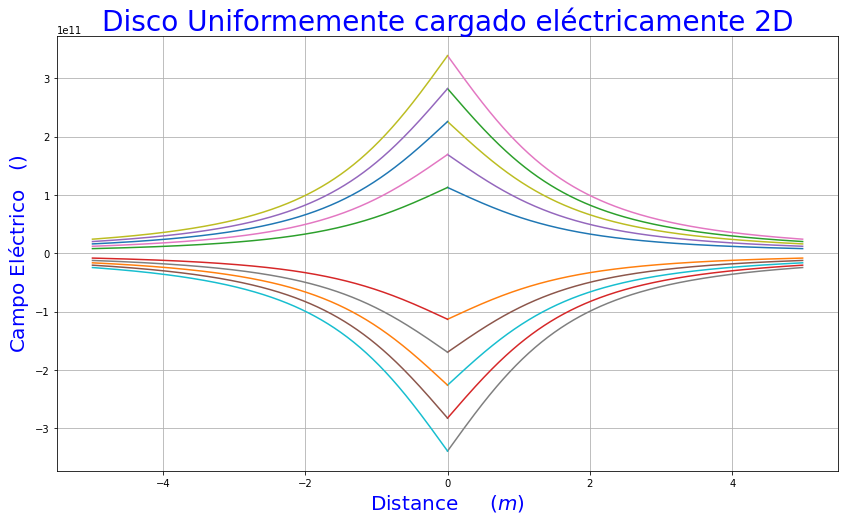

In [ ]:
plt.figure(figsize=(14,8))
a=2
z=np.arange(0, 5, 0.01)
for S in range(2, 7, 1):
  E=abs((S/(2*Eo))*(1-(z/((a**2)+(z**2))**(1/2))))
  plt.plot(z,E)
  plt.plot(z,-E)
  plt.plot(-z,E)
  plt.plot(-z,-E)
  plt.title("Disco Uniformemente cargado eléctricamente 2D", fontsize=28, color="blue")
  plt.xlabel("Distance     $(m)$", fontsize=20, color="blue")
  plt.ylabel("Campo Eléctrico   $()$", fontsize=20, color="blue")
  plt.grid()



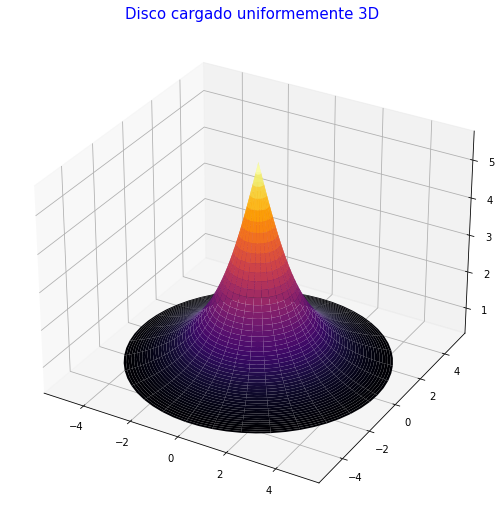

In [ ]:
z=np.arange(0, 5, 0.01)
E=lambda z,S,a:abs((S/(2*Eo))*(1-(z/((a**2)+(z**2))**(1/2))))
plt.rcParams["figure.figsize"] = (9, 9)
σ=1
for S in range(1,2):
  Y=lambda R: E(R,S,a)
  Rotar(z,Y)
  plt.title("Disco cargado uniformemente 3D",fontsize=15, color="blue")
  plt.show()

##11. Dipolo Eléctrico, Geometría del Campo Eléctrico y Potencial Eléctrico 2D y 3D

En su versión más sencilla, un dipolo es un sistema formado por dos cargas de la misma magnitud y signo opuesto, separadas una cierta distancia.
$${E_{r}}=\frac{1}{4\Pi\varepsilon_{0}}\frac{4{Q}{d}}{r^{3}}{cos 0}$$
$${E_{o}}=\frac{1}{4\Pi\varepsilon_{0}}\frac{2{Q}{d}}{r^{3}}{Cos 0}$$
El trabajo potencial o eléctrico en un punto es el trabajo que debe realizarse por unidad de tiempo para mover una carga en un campo electrostático de un punto a otro, independientemente de la parte no giratoria de la electricidad. En otras palabras, este trabajo requiere que una fuerza externa mueva una unidad de carga positiva q se mueva de un punto a otro en cuestión a una velocidad constante en contra de la fuerza eléctrica. Esta fracción se expresa numéricamente de la siguiente manera:
$${V}=\frac{{W}}{{q}}$$


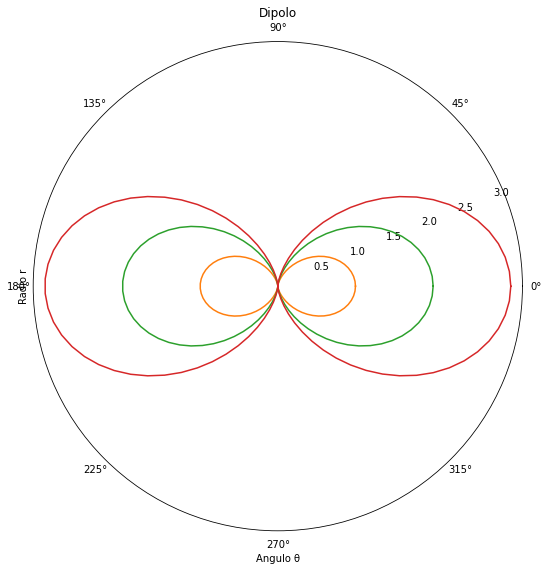

In [ ]:
θ=np.linspace(0,2*np.pi,100)
r=lambda θ,a:a*np.sin(θ+np.pi/2)**2


for a in range(4):
  plt.polar(θ,r(θ,a))
plt.grid()
plt.title("Dipolo")
plt.xlabel("Angulo θ")
plt.ylabel("Radio r")
plt.show()

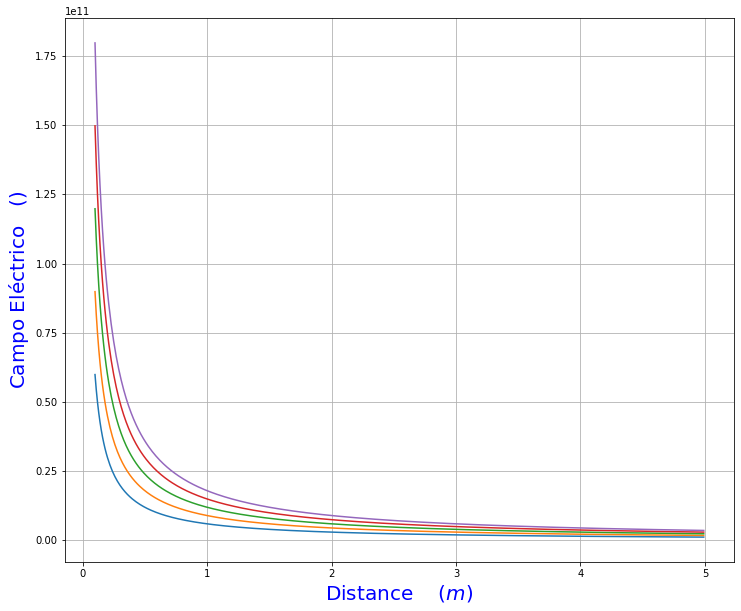

In [ ]:
plt.figure(figsize=(12,10))
p=np.arange(0.1,5,0.01)
for L in range (2,7,1):
  E=(L/(12*np.pi*Eo*p))
  plt.plot(p,E)
  plt.title("",fontsize=28, color="blue")
  plt.xlabel("Distance    $(m)$", fontsize=20, color="blue")
  plt.ylabel("Campo Eléctrico   $()$", fontsize=20, color="blue")
  plt.grid()

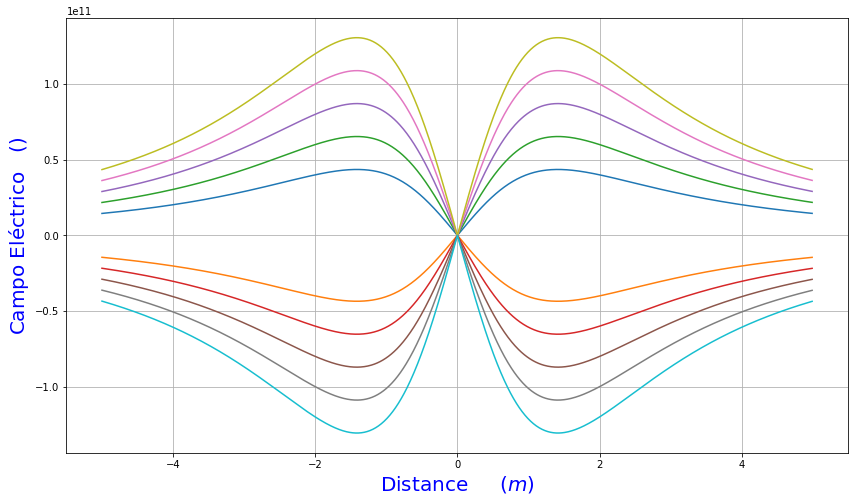

In [ ]:
plt.figure(figsize=(14,8))
a=2
z=np.arange(-5, 5, 0.01)
for L in range(2, 7, 1):
  E=abs((L*(a**2)*z/(2*Eo*(a**2 + z**2)**(3/2))))
  plt.plot(z,E)
  plt.plot(z,-E)
  plt.title("", fontsize=28, color="blue")
  plt.xlabel("Distance     $(m)$", fontsize=20, color="blue")
  plt.ylabel("Campo Eléctrico   $()$", fontsize=20, color="blue")
  plt.grid()

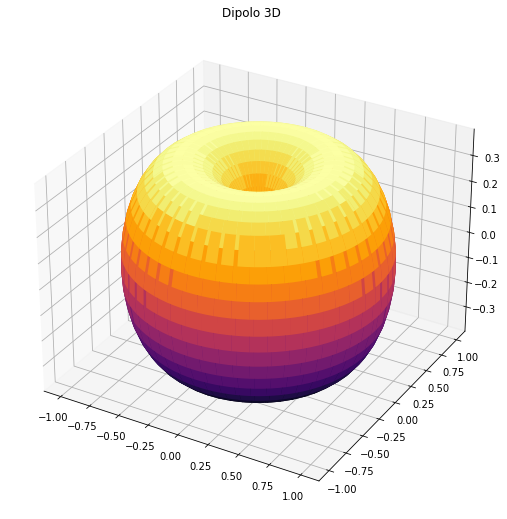

In [ ]:
θ=np.linspace(0,2*np.pi,100)
r=lambda θ,a:a*np.sin(θ)**2


for a in range(1,2):
  R =lambda θ:r(θ,a)
  Polares(θ,R)
  plt.grid()
  plt.title("Dipolo 3D")
  plt.show()

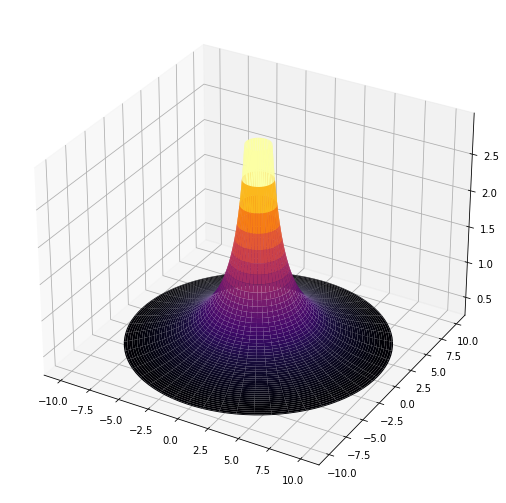

In [ ]:
p=np.arange(0.1,5,0.01)
E=lambda p,L,a:(L/(12*np.pi*Eo*p))
plt.rcParams["figure.figsize"] = (9, 9)
σ=1
for L in range(1,2):
  Y=lambda R: E(R,L,a)
  Rotar(z2,Y)
  plt.title("",fontsize=15, color="blue")
  plt.show()

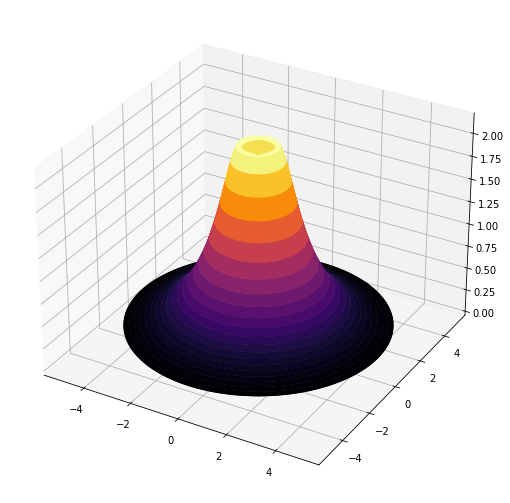

In [ ]:
z=np.arange(-5, 5, 0.01)
E=lambda z,L,a:abs((L*(a**2)*z/(2*Eo*(a**2 + z**2)**(3/2))))
plt.rcParams["figure.figsize"] = (9, 9)
σ=1
for L in range(1,2):
  Y=lambda R: E(R,L,a)
  Rotar(z,Y)
  plt.title("",fontsize=15, color="blue")
  plt.show()

##12.Cuadrupolo Eléctrico, Geometría del Campo Eléctrico y Potencial Eléctrico 2D y 3D

Es un sistema formado por tres cargas +2Q en el punto de origen y -Q, este puede ser caracterizado por su carga neta, un adrupolo puede representarse como dos dipolos orientados de forma antiparalela.
<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSCvCBCB7jUb0kYXEa_nQI9GLVGF5Y1RZwPeDn5NG4M4MmsSEXKqVWktTLELPDpxjRw5ik&usqp=CAU" width="300"
     height="341">
El potencial en el caso de un cuadripolo disminuye con la inversa del cubo de la distanciar, mientras que en el dipolo disminuye como la inversa del cuadrado.
El potencial se expresa con funcion de r y θ:
$${V}=\frac{Q}{4\Pi\varepsilon_{0}}\frac{{d^{2}}}{r^{3}}{ (3 cos^{3}θ-1)}$$
Y los componentes de campo eléctrico son:
$${E_{r}}=\frac{1}{4\Pi\varepsilon_{0}}\frac{{3Q}{d^{2}}}{r^{4}}{ (3 cos^{3}θ-1)}$$
$${E_{θ}}=\frac{1}{4\Pi\varepsilon_{0}}\frac{{3Q}{d^{2}}}{r^{4}}{Sin(2θ)}$$

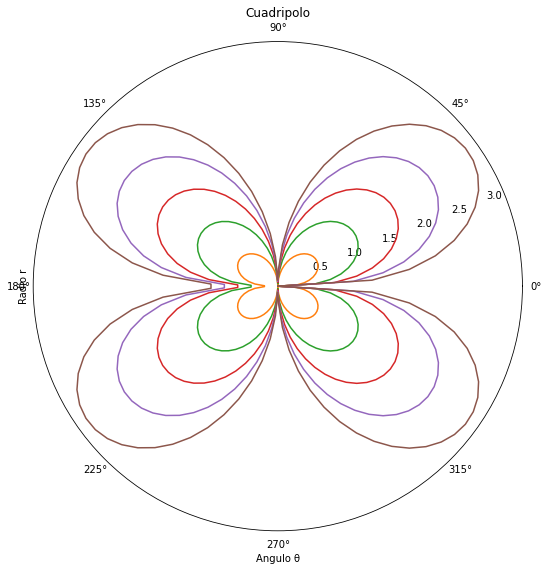

In [ ]:
θ=np.linspace(0,2*np.pi,100)
r=lambda θ,a:a*np.abs(np.sin(θ+np.pi/2))*np.abs(np.cos(θ+np.pi/2))**(1/2)


for a in range(6):

  plt.polar(θ,r(θ,a))
plt.grid()
plt.title("Cuadripolo")
plt.xlabel("Angulo θ")
plt.ylabel("Radio r")
plt.show()

<ipython-input-25-d64f713e2321>:13: RuntimeWarning: invalid value encountered in true_divide
  Ex = k * ((X - x1) / ((X - x1)**2 + (Y - y1)**2)**(3/2) - (X - x2) / ((X - x2)**2 + (Y - y2)**2)**(3/2)
<ipython-input-25-d64f713e2321>:14: RuntimeWarning: invalid value encountered in true_divide
  + (X - x3) / ((X - x3)**2 + (Y - y3)**2)**(3/2) - (X - x4) / ((X - x4)**2 + (Y - y4)**2)**(3/2))
<ipython-input-25-d64f713e2321>:15: RuntimeWarning: invalid value encountered in true_divide
  Ey = k * ((Y - y1) / ((X - x1)**2 + (Y - y1)**2)**(3/2) - (Y - y2) / ((X - x2)**2 + (Y - y2)**2)**(3/2)
<ipython-input-25-d64f713e2321>:16: RuntimeWarning: invalid value encountered in true_divide
  + (Y - y3) / ((X - x3)**2 + (Y - y3)**2)**(3/2) - (Y - y4) / ((X - x4)**2 + (Y - y4)**2)**(3/2))


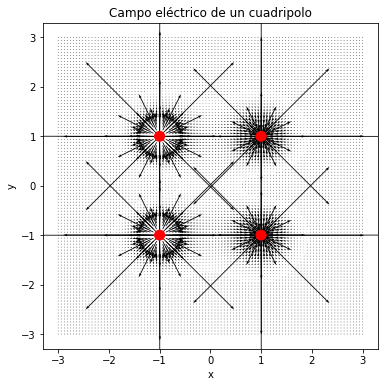

In [ ]:
#Geometria del campo electrico
# Definir coordenadas cartesianas de los cargos
x1, y1 = -1, 1
x2, y2 = 1, 1
x3, y3 = -1, -1
x4, y4 = 1, -1

# Calcular las componentes del campo eléctrico en un rango de puntos (x, y)
x = np.linspace(-3, 3, 100)
y = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x, y)
k = 9e9 # Constante de Coulomb
Ex = k * ((X - x1) / ((X - x1)**2 + (Y - y1)**2)**(3/2) - (X - x2) / ((X - x2)**2 + (Y - y2)**2)**(3/2)
        + (X - x3) / ((X - x3)**2 + (Y - y3)**2)**(3/2) - (X - x4) / ((X - x4)**2 + (Y - y4)**2)**(3/2))
Ey = k * ((Y - y1) / ((X - x1)**2 + (Y - y1)**2)**(3/2) - (Y - y2) / ((X - x2)**2 + (Y - y2)**2)**(3/2)
        + (Y - y3) / ((X - x3)**2 + (Y - y3)**2)**(3/2) - (Y - y4) / ((X - x4)**2 + (Y - y4)**2)**(3/2))

# Crear figura y gráfica del campo eléctrico
fig, ax = plt.subplots(figsize=(6, 6))
ax.quiver(X, Y, Ex, Ey)

# Agregar círculos para representar las cargas
circ1 = plt.Circle((x1, y1), 0.1, color='red')
circ2 = plt.Circle((x2, y2), 0.1, color='red')
circ3 = plt.Circle((x3, y3), 0.1, color='red')
circ4 = plt.Circle((x4, y4), 0.1, color='red')
ax.add_artist(circ1)
ax.add_artist(circ2)
ax.add_artist(circ3)
ax.add_artist(circ4)

# Agregar título y etiquetas de los ejes
ax.set_title('Campo eléctrico de un cuadripolo')
ax.set_xlabel('x')
ax.set_ylabel('y')

plt.show()

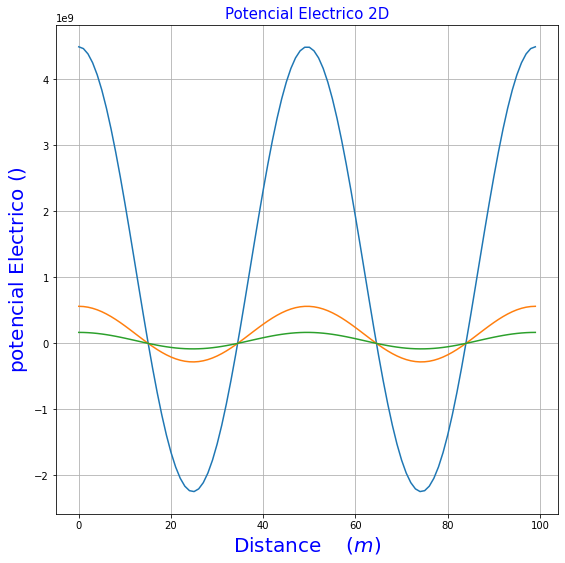

In [ ]:
θ=np.linspace(0,2*np.pi,100)
q=1
s=1
for r in range (1,4,1):
  V=((q*(s**2))/(8*np.pi*Eo*(r**3)))*(((3*abs(np.cos(θ))**2)/2)-(1/2))
  plt.plot(V)
  plt.title("Potencial Electrico 2D",fontsize=15, color="blue")
  plt.xlabel("Distance    $(m)$", fontsize=20, color="blue")
  plt.ylabel("potencial Electrico $()$", fontsize=20, color="blue")
  plt.grid()

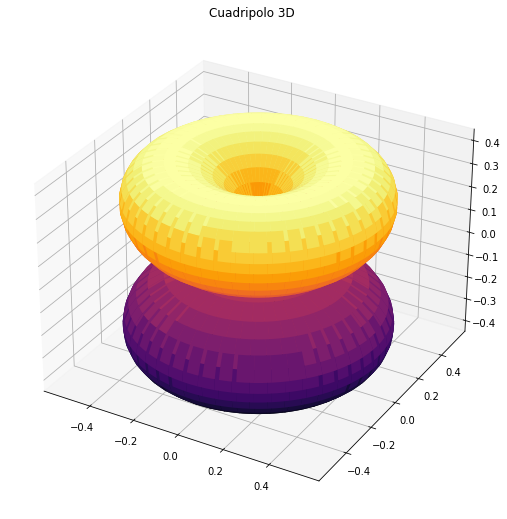

In [ ]:
θ=np.linspace(0,2*np.pi,100)
r=lambda θ,a:a*np.abs(np.sin(θ))*np.abs(np.cos(θ))**(1/2)


for a in range(1,2):
  R =lambda θ:r(θ,a)
  Polares(θ,R)
  plt.grid()
  plt.title("Cuadripolo 3D")
  plt.show()

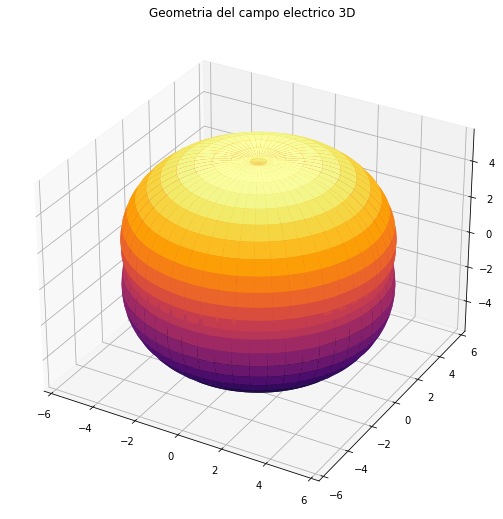

In [ ]:
θ=np.linspace(0,2*np.pi,100)
q=1
s=1
for r in range (1,2):
  E=lambda θ,r: ((3*q*s**2)/(2*np.pi*Eo*r**4))+((3*(np.cos(θ))**2/2)-(1/2))+((3*q*s**2*np.sin(θ)*np.cos(θ))/(8*np.pi*Eo*r**4))
  R =lambda θ:E(θ,r)
  Polares(θ,R)
  plt.grid()
  plt.title("Geometria del campo electrico 3D")
  plt.show()


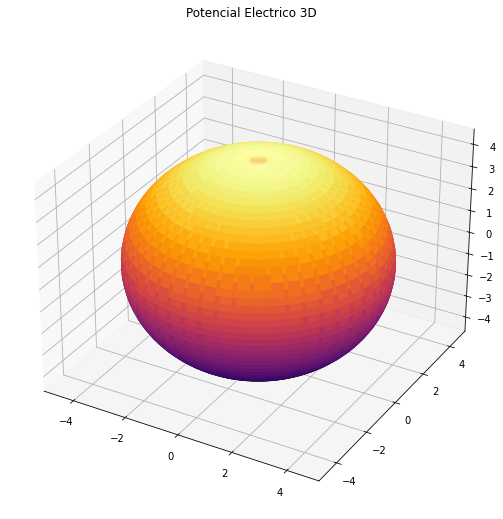

In [ ]:
θ=np.linspace(0,2*np.pi,100)
q=1
s=1
for r in range (1,2):
  V=lambda θ,r: ((q*(s**2))/(8*np.pi*Eo*(r**3)))+(((3*(np.cos(θ))**2)/2)-(1/2))
  R =lambda θ:V(θ,r)
  Polares(θ,R)
  plt.grid()
  plt.title("Potencial Electrico 3D")
  plt.show()

##13. Esfera uniformemente cargada eléctricamente. Qt, Ei, Vi, Eex, Vex. 2D y 3D

Si disponemos de una esfera cargada uniformemente y por lo tanto en equilibrio eñectrostático, esta creara en su entorno un campo eléctrico.
El campo eléctrico total, es la suma del campo electrico inoforme mas el campo producido por un dipolo de momento dipolar situado en el centro de la esfera.

Los componentes del campo electrico en coordenadas polares son:
$${E_{r}}={E_{0}}{(1}{+}\frac{{2}{R^{3}}}{r^{3}}){cos(θ)}$$
$${E_{r}}={-E_{0}}{(1}{+}\frac{{R^{3}}}{r^{3}}){sen(θ)}$$
Y el potencial esta en funcion del punto P de coordenadas (r,θ):
$${E_{r}}={-E_{0}}{(1}{+}\frac{{}{R^{3}}}{r^{3}}){r cos(θ)}$$


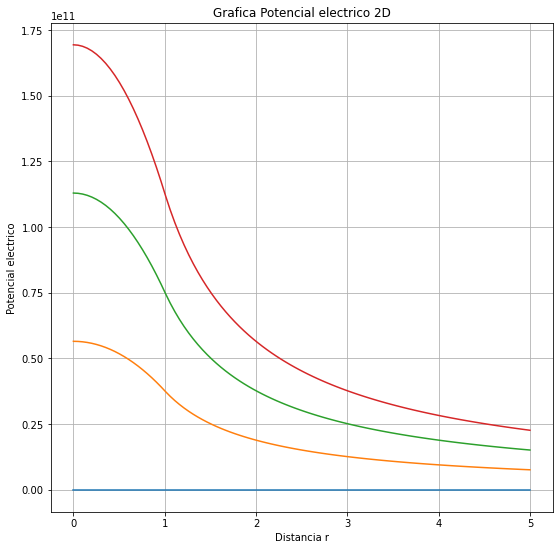

In [ ]:
r=np.linspace(0,5,100)
Vext=lambda r,a,p: (a**3*p)/(3*Eo*r)
Vint=lambda r,a,p: ((a**2*p)/(2*Eo))-((p*r**2)/(6*Eo))
V=lambda r,a,p: np.piecewise(r,[r>a,r<=a], [lambda r:Vext(r,a,p),lambda r:Vint(r,a,p)])
a=1
for p in range(4):
  plt.plot(r,V(r,a,p))
plt.grid()
plt.title("Grafica Potencial electrico 2D")
plt.xlabel("Distancia r")
plt.ylabel("Potencial electrico")
plt.show()

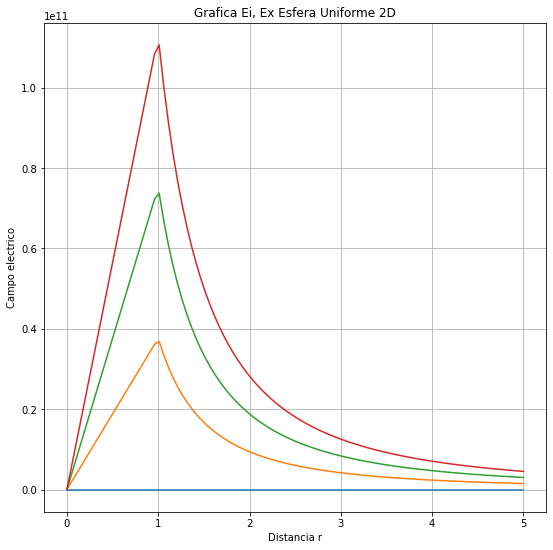

In [ ]:
r=np.linspace(0,5,100)
a=1
for p in range(4):
  Eext=lambda r,a,p: (a**3*p)/(3*Eo*r**2)
  Eint=lambda r,a,p: (p*r)/(3*Eo)
  E=lambda r,a,p: np.piecewise(r,[r>a,r<=a], [lambda r:Eext(r,a,p),lambda r:Eint(r,a,p)])

  plt.plot(r,E(r,a,p))
plt.grid()
plt.title("Grafica Ei, Ex Esfera Uniforme 2D")
plt.xlabel("Distancia r")
plt.ylabel("Campo electrico")
plt.show()


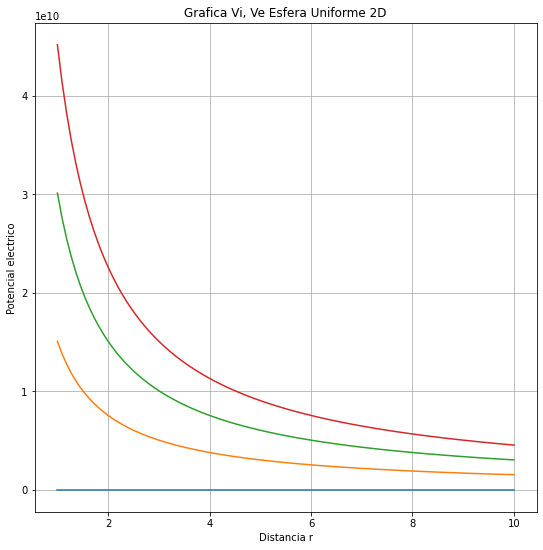

In [ ]:
r=np.linspace(1,10,100)
Vext=lambda r,a,p0: (2*a**3*p0)/(15*Eo*r)
Vint=lambda r,a,p0: (p0/Eo)*(((r**4)/(20*a**2))-((r**2)/6)+((a**2)/4))
V=lambda r,a,p0: np.piecewise(r,[r>a,r<=a], [lambda r:Vext(r,a,p0),lambda r:Vint(r,a,p0)])
a=1
for p0 in range(4):
  plt.plot(r,V(r,a,p0))
plt.grid()
plt.title("Grafica Vi, Ve Esfera Uniforme 2D")
plt.xlabel("Distancia r")
plt.ylabel("Potencial electrico")
plt.show()

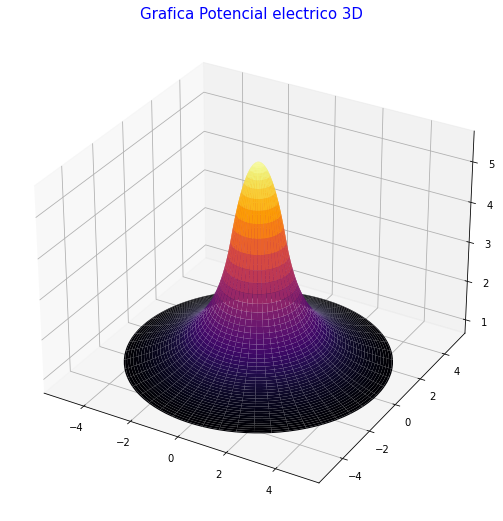

In [ ]:
r=np.linspace(0,5,100)
Vext=lambda r,a,p: (a**3*p)/(3*Eo*r)
Vint=lambda r,a,p: ((a**2*p)/(2*Eo))-((p*r**2)/(6*Eo))
V=lambda r,a,p: np.piecewise(r,[r>a,r<=a], [lambda r:Vext(r,a,p),lambda r:Vint(r,a,p)])
a=1
for p in range(1,2):
  Y=lambda r: V(r,a,p)
  Rotar(r,Y)
  plt.title("Grafica Potencial electrico 3D",fontsize=15, color="blue")
  plt.show()

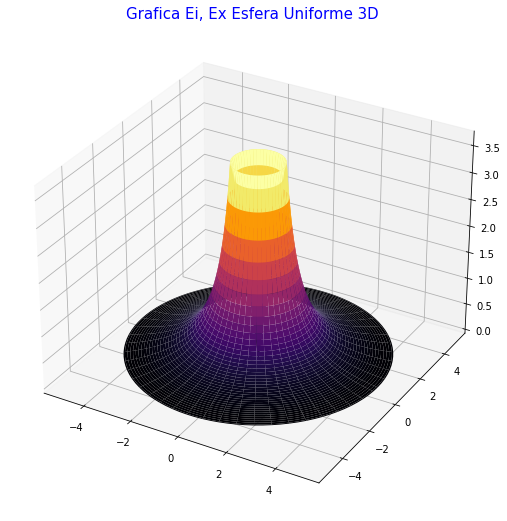

In [ ]:
r=np.linspace(0,5,100)
Eext=lambda r,a,p: (a**3*p)/(3*Eo*r**2)
Eint=lambda r,a,p: (p*r)/(3*Eo)
E=lambda r,a,p: np.piecewise(r,[r>a,r<=a], [lambda r:Eext(r,a,p),lambda r:Eint(r,a,p)])
a=1
for p in range(1,2):
  Y=lambda r: E(r,a,p)
  Rotar(r,Y)
  plt.title("Grafica Ei, Ex Esfera Uniforme 3D",fontsize=15, color="blue")
  plt.show()

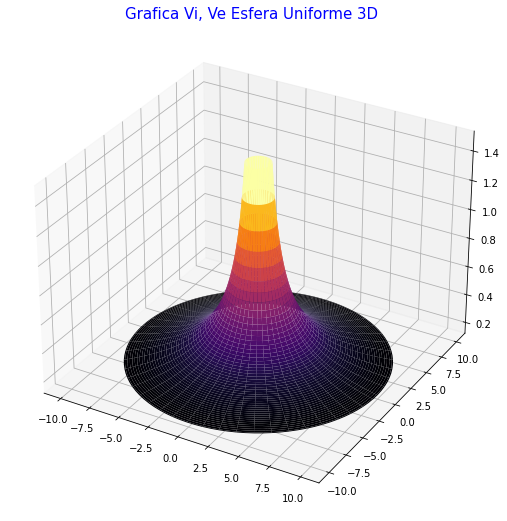

In [ ]:
r=np.linspace(1,10,100)
Vext=lambda r,a,p0: (2*a**3*p0)/(15*Eo*r)
Vint=lambda r,a,p0: (p0/Eo)*(((r**4)/(20*a**2))-((r**2)/6)+((a**2)/4))
V=lambda r,a,p0: np.piecewise(r,[r>a,r<=a], [lambda r:Vext(r,a,p0),lambda r:Vint(r,a,p0)])
a=1
for p0 in range(1,2):
  Y=lambda r: V(r,a,p0)
  Rotar(r,Y)
  plt.title("Grafica Vi, Ve Esfera Uniforme 3D",fontsize=15, color="blue")
  plt.show()

##14. Esfera cargada eléctricamente. Qt, Ei, Vi, Eex, Vex. 2D y 3D, r=? para Emax.

para garantizar el Emax la r debe ser minima


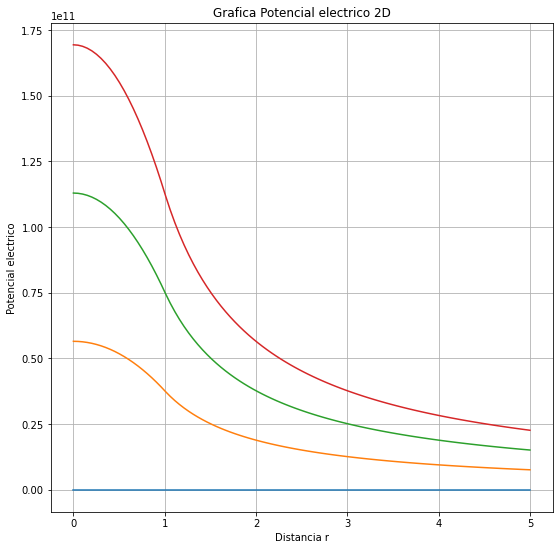

In [ ]:
r=np.linspace(0,5,100)

Vext=lambda r,a,p: (a**3*p)/(3*Eo*r)
Vint=lambda r,a,p: ((a**2*p)/(2*Eo))-((p*r**2)/(6*Eo))
V=lambda r,a,p: np.piecewise(r,[r>a,r<=a], [lambda r:Vext(r,a,p),lambda r:Vint(r,a,p)])
a=1
for p in range(4):
  plt.plot(r,V(r,a,p))
plt.grid()
plt.title("Grafica Potencial electrico 2D")
plt.xlabel("Distancia r")
plt.ylabel("Potencial electrico")
plt.show()

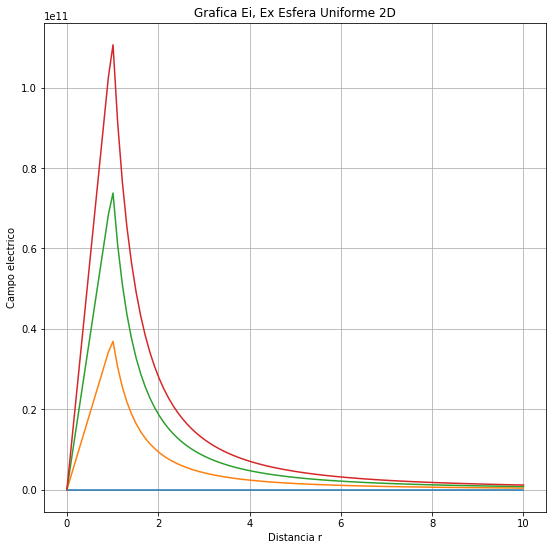

In [ ]:
r=np.linspace(0,10,100)
a=1
for p in range(4):
  Eext=lambda r,a,p: (a**3*p)/(3*Eo*r**2)
  Eint=lambda r,a,p: (p*r)/(3*Eo)
  E=lambda r,a,p: np.piecewise(r,[r>a,r<=a], [lambda r:Eext(r,a,p),lambda r:Eint(r,a,p)])

  plt.plot(r,E(r,a,p))
plt.grid()
plt.title("Grafica Ei, Ex Esfera Uniforme 2D")
plt.xlabel("Distancia r")
plt.ylabel("Campo electrico")
plt.show()

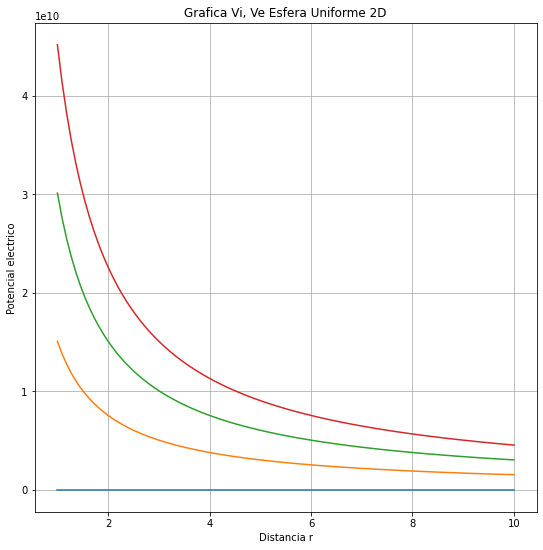

In [ ]:
r=np.linspace(1,10,100)
Vext=lambda r,a,p0: (2*a**3*p0)/(15*Eo*r)
Vint=lambda r,a,p0: (p0/Eo)*(((r**4)/(20*a**2))-((r**2)/6)+((a**2)/4))
V=lambda r,a,p0: np.piecewise(r,[r>a,r<=a], [lambda r:Vext(r,a,p0),lambda r:Vint(r,a,p0)])
a=1
for p0 in range(4):
  plt.plot(r,V(r,a,p0))
plt.grid()
plt.title("Grafica Vi, Ve Esfera Uniforme 2D")
plt.xlabel("Distancia r")
plt.ylabel("Potencial electrico")
plt.show()

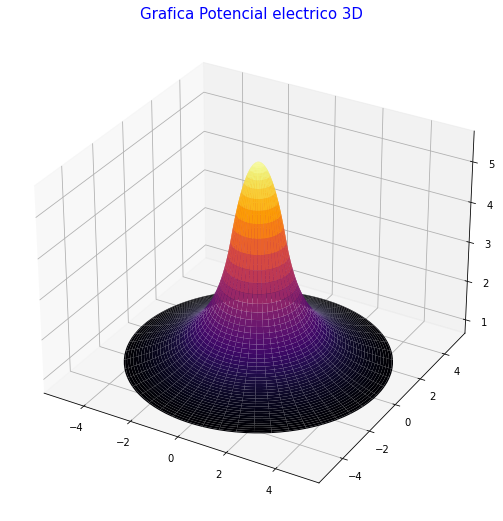

In [ ]:
r=np.linspace(0,5,100)
Vext=lambda r,a,p: (a**3*p)/(3*Eo*r)
Vint=lambda r,a,p: ((a**2*p)/(2*Eo))-((p*r**2)/(6*Eo))
V=lambda r,a,p: np.piecewise(r,[r>a,r<=a], [lambda r:Vext(r,a,p),lambda r:Vint(r,a,p)])
a=1
for p in range(1,2):
  Y=lambda r: V(r,a,p)
  Rotar(r,Y)
  plt.title("Grafica Potencial electrico 3D",fontsize=15, color="blue")
  plt.show()

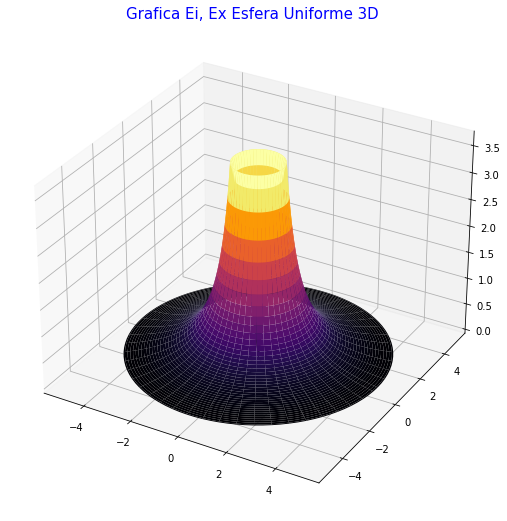

In [ ]:
r=np.linspace(0,5,100)
Eext=lambda r,a,p: (a**3*p)/(3*Eo*r**2)
Eint=lambda r,a,p: (p*r)/(3*Eo)
E=lambda r,a,p: np.piecewise(r,[r>a,r<=a], [lambda r:Eext(r,a,p),lambda r:Eint(r,a,p)])
a=1
for p in range(1,2):
  Y=lambda r: E(r,a,p)
  Rotar(r,Y)
  plt.title("Grafica Ei, Ex Esfera Uniforme 3D",fontsize=15, color="blue")
  plt.show()

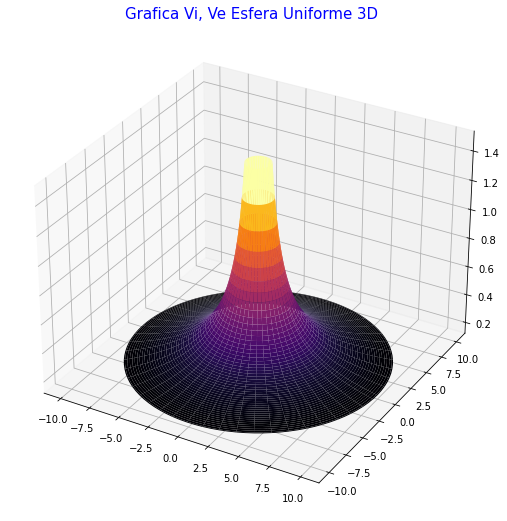

In [ ]:
r=np.linspace(1,10,100)
Vext=lambda r,a,p0: (2*a**3*p0)/(15*Eo*r)
Vint=lambda r,a,p0: (p0/Eo)*(((r**4)/(20*a**2))-((r**2)/6)+((a**2)/4))
V=lambda r,a,p0: np.piecewise(r,[r>a,r<=a], [lambda r:Vext(r,a,p0),lambda r:Vint(r,a,p0)])
a=1
for p0 in range(1,2):
  Y=lambda r: V(r,a,p0)
  Rotar(r,Y)
  plt.title("Grafica Vi, Ve Esfera Uniforme 3D",fontsize=15, color="blue")
  plt.show()

##15. Seccion 2.14 – 2.15, ejemplo pag 83. Grafica ecuacion 2.143.

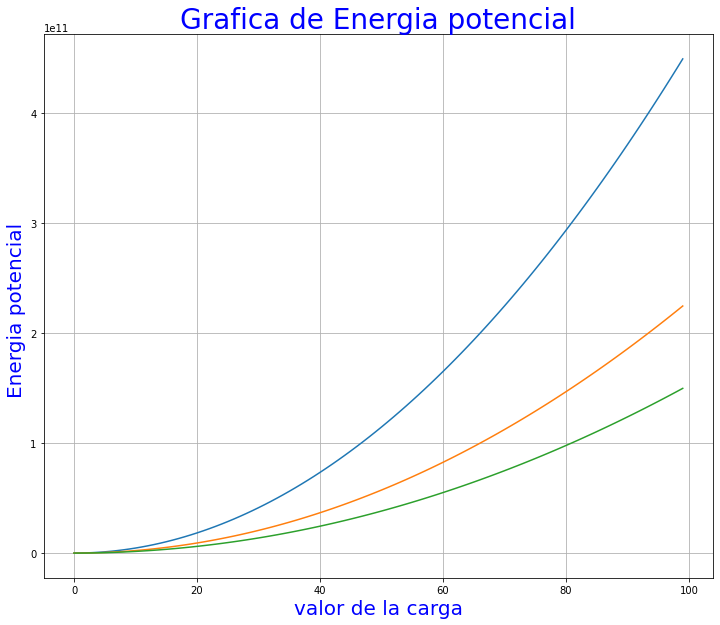

In [ ]:
Q=np.linspace(0,10,100)
plt.figure(figsize=(12,10))
for R in range(1,4,1):
  W= (Q**2)/(8*np.pi*Eo*R)
  plt.plot(W)
  plt.title("Grafica de Energia potencial",fontsize=28, color="blue")
  plt.xlabel("valor de la carga", fontsize=20, color="blue")
  plt.ylabel("Energia potencial ", fontsize=20, color="blue")
  plt.grid()


##16.Gráfica Polinomios de Legendre desde Po hasta P5.

Son una familia de polinomios ortogonales, los cuales suguen al examinar las soluciones de la ecuación diferencial:
$$xy''+(1-x)y'+ny=0$$
Desarrollando y en serie de potencias se obtiene una relación de recurrencia entre coeficientes consecutivos como la que sigue:

$$a_(k+1)=\frac{k-n}{(k+1)^{2}}a_k, k=0,1,2,...; y(x)=sumatoria..$$

Edmond Nicolás Laguerre (1834 – 1886) fue un matemático francés conocido principalmente por la introducción de los polinomios que llevan su nombre.
La solución de la ecuación de Laguerre es:
$$y_{2}(x) = y_{1}(x) \ln(x) + \sum_{n = 0}^{\infty}\hat{c}_{n}x^{n}$$

$$\begin{align*}
L_{0}(x) &= 1 \\
L_{1}(x) &= 1 -x \\
L_{2}(x) &= 1 -2x + \dfrac{1}{2}x^{2} \\
L_{3}(x) &= 1 -3x + \dfrac{3}{2}x^{2} -\dfrac{1}{6}x^{3} \\
\vdots
\end{align*}$$
Puede verse que siempre que n sea natural se anula el coeficiente de toda potencia mayor (y distinta) que n. Esto es, una de las soluciones linealmente independientes es un polinomio de grado n. Para encontrar la otra solución linealmente independiente han de estudiarse las soluciones de la ecuación más general
$$y''(x)+p(x)y'(x)+q(x)y(x)=0$$

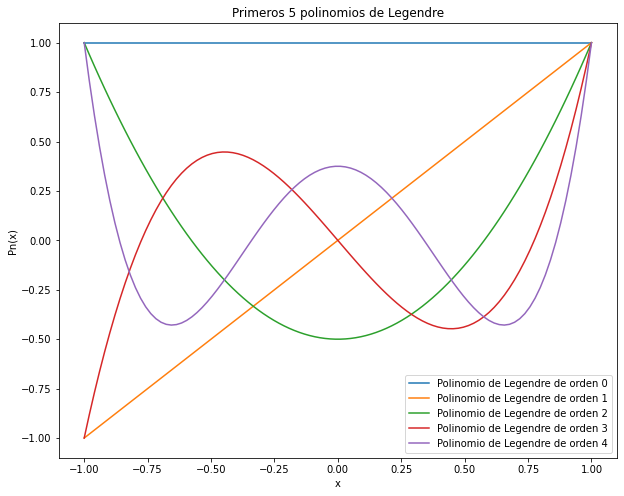

In [ ]:

x = np.linspace(-1, 1, 100) # Rango de valores para x
n_pol = 5 # Número de polinomios a graficar

fig, ax = plt.subplots(figsize=(10, 8)) # Crear figura y subplot

# Graficar cada polinomio de Legendre en la misma gráfica
for i in range(n_pol):
    Pn = legendre(i) # Obtener el polinomio de Legendre de orden i
    y = Pn(x) # Evaluar el polinomio en los valores de x
    ax.plot(x, y, label=f'Polinomio de Legendre de orden {i}') # Graficar el polinomio y agregar una etiqueta

ax.set_title('Primeros 5 polinomios de Legendre') # Agregar título a la gráfica
ax.set_xlabel('x') # Agregar etiqueta al eje x
ax.set_ylabel('Pn(x)') # Agregar etiqueta al eje y
ax.legend() # Agregar leyenda

plt.show()

#<center> Agenda 2 Método de imágenes  - Ecuación de laplace

##1. Carga Eléctrica Puntual Próxima a un Plano Conductor Infinito a Potencial Eléctrico Cero

El campo eléctrico en las proximidades de un conductor, tiene por módulo Ex=σ/ε0. Donde σ es la densidad de de carga. Como el sentido del campo eléctrico es hacia el conductor, la densidad de carga σ es negativa σ=-Ex·ε0.
En los puntos del plano conductor, x=0.
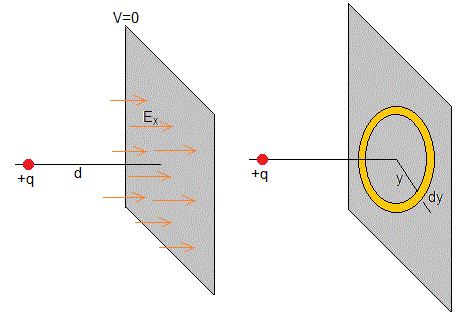

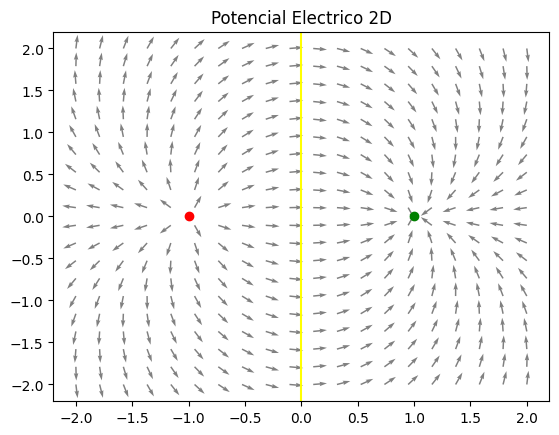

In [ ]:
#Potencial Carga puntual vs plano conductor infinito con potencial 0
#q=(x,y,carga)
q1=(-1,0,3)
q2=(1,0,-3)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v = mean_vectors_arrays([calc_potencial(x,y,q1),calc_potencial(x,y,q2)])
u,v=normalice(u,v)

plt.title("Potencial Electrico 2D")
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"go")
plt.axvline(0,color='yellow')
plt.quiver(x,y,u,v,color="grey")
plt.show()

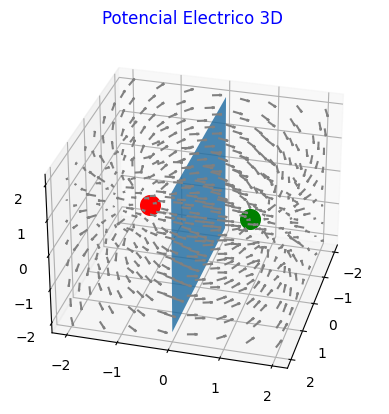

In [ ]:
q1=(0,-1,0,1)
q2=(0,1,0,-1)

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_potencial_3D(x,y,z,q1),calc_potencial_3D(x,y,z,q2)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'grey')
ax.view_init(30, 15)
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='green',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0,z_plane, alpha=0.8)
plt.title("Potencial Electrico 3D ",fontsize=12, color="blue")
plt.show()


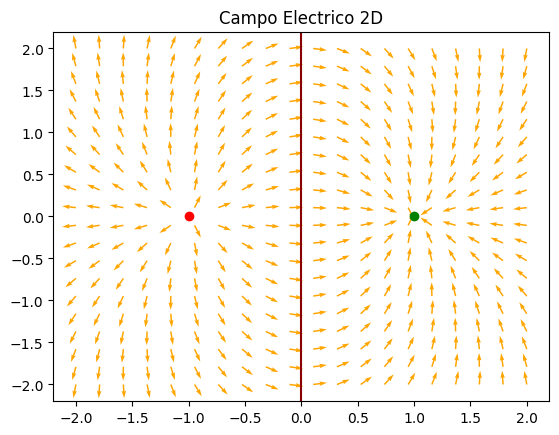

In [ ]:
q1=(-1,0,3)
q2=(1,0,-3)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_field(x,y,q1),calc_field(x,y,q2)])

u,v=normalice(u,v)

plt.title("Campo Electrico 2D")
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"go")
plt.axvline(0,color='darkred')
plt.quiver(x,y,u,v,color="orange")
plt.show()

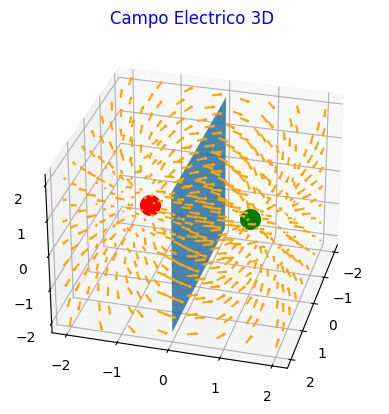

In [ ]:
q1=(0,-1,0,1)
q2=(0,1,0,-1)

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_field_3D(x,y,z,q1),calc_field_3D(x,y,z,q2)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'orange')
ax.view_init(30, 15)
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='green',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0,z_plane, alpha=0.8)
plt.title("Campo Electrico 3D ",fontsize=12, color="blue")
plt.show()

##2. Carga Puntual Próxima a una Esfera Conductora a Potencial Electrico Cero


  Lo que tenemos que hacer para calcular el vector E primero tenemos que hallar el gradiente del potencial cambiado de sigo. que podemos conocerla a traves de su componente radial.
$${E}=\frac{-dV}{dr}=\frac{1}{4πɛ_o}(\frac{r+dcosθ}{r^{3}_{1}}Q+\frac{r+dcosθ}{r^{3}_{2}}q)$$
El campo en las proximidades de una superficie conductora es perpendicular a dicha superficie luego, el campo en la superficie esférica conductora es radial.

Potencial:
$${V}=\frac{1}{4πɛ_o}(\frac{Q}{r_{1}}+\frac{q}{r_{2}})$$
Evidentemente, si integramos esta densidad de carga sobre la superficie de la esfera, obtenemos la carga total inducida q. La integral es inmediata:
$${q}=\int^{π}_{0}{σ2πR^{2}sinθdθ}=\frac{-R}{d}Q$$
La carga total inducida sobre la esfera conductora es igual a la carga imagen que sustituye a la esfera.


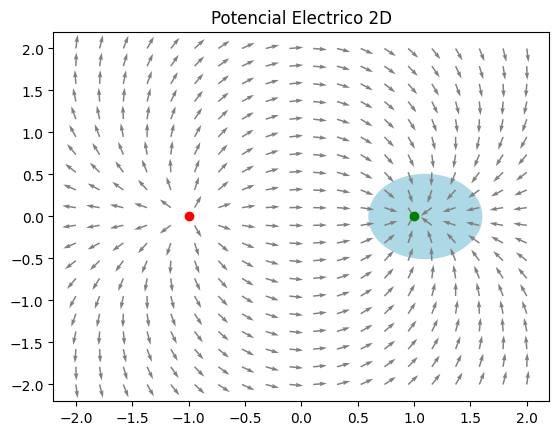

In [ ]:
#Potencial carga puntual vs esfera con potencial 0
#q=(x,y,carga)
q1=(-1,0,3)
q2=(1,0,-3)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_potencial(x,y,q1),calc_potencial(x,y,q2)])


u,v=normalice(u,v)


esfera = plt.Circle((1.1, 0),0.5, color='lightblue')
fig, ax = plt.subplots()

plt.title("Potencial Electrico 2D")
ax.add_artist(esfera)
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"go")

plt.quiver(x,y,u,v,color="grey")
plt.show()

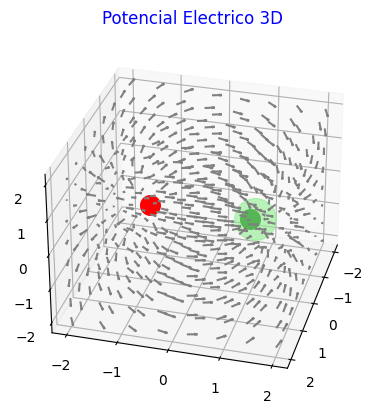

In [ ]:
q1=(0,-1,0,1)
q2=(0,1,0,-1)
esfera=(0,1.1,0)


x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_potencial_3D(x,y,z,q1),calc_potencial_3D(x,y,z,q2)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'grey')
ax.view_init(30, 15)
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='darkgreen',s=200)
ax.scatter(esfera[0],esfera[1],esfera[2],color='lightgreen',s=900,alpha=0.6)
plt.title("Potencial Electrico 3D ",fontsize=12, color="blue")
plt.show()

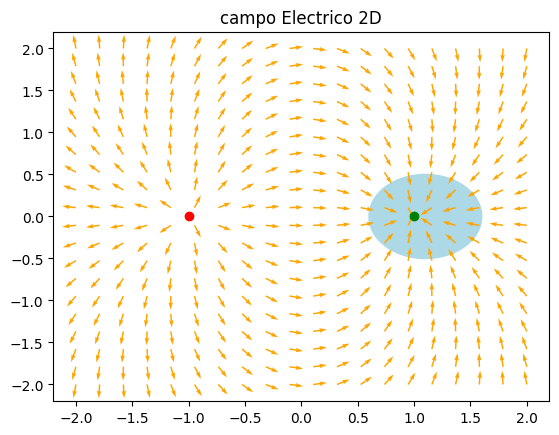

In [ ]:
#Campo carga puntual vs esfera con potencial 0
#q=(x,y,carga)
q1=(-1,0,3)
q2=(1,0,-3)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_field(x,y,q1),calc_field(x,y,q2)])

u,v=normalice(u,v)

esfera = plt.Circle((1.1, 0),0.5, color='lightblue')
fig, ax = plt.subplots()

plt.title("campo Electrico 2D")
ax.add_artist(esfera)
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"go")
plt.quiver(x,y,u,v,color="orange")
plt.show()


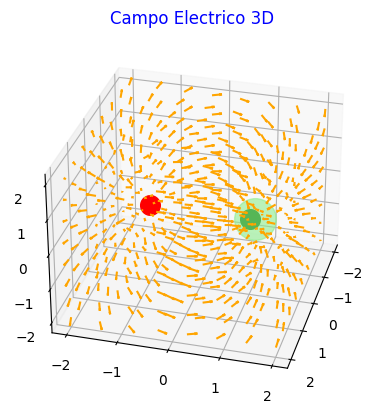

In [ ]:
q1=(0,-1,0,1)
q2=(0,1,0,-1)
esfera=(0,1.1,0)

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_field_3D(x,y,z,q1),calc_field_3D(x,y,z,q2)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'orange')
ax.view_init(30, 15)
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='darkgreen',s=200)
ax.scatter(esfera[0],esfera[1],esfera[2],color='lightgreen',s=900,alpha=0.6)
plt.title("Campo Electrico 3D ",fontsize=12, color="blue")
plt.show()

##3. Esfera Cargada Eléctricamente Próxima a un Plano Conductor Eléctrico a Potencial Eléctrico Cero

Para resolver este problema debemos centrarnos en el metodo de las imágenes mediante aproximaciones sucesivas. Supongamos que la esfera de radio r, está a un potencial V y su centro dista d>r del plano a potencial cero.
Si colocamos una carga de prueba q0 en el centro de la esfera lo que va a generar que la superficie de radio r se encuentre en un potencial v:
$${V}=\frac{1}{4\Pi\varepsilon_{0}}\frac{q_{0}}{r}$$
Si planteamos una carga negativa -q0 a cierta distancia va a generar que el plano sea una superficie equipotencial. Al implementar otra carga puntual (q1) dentro de la esfera podremos calculaela de acuerdo a su posición en x1.
1)Debemos dejar que el potencial en A (-r, 0) debido a las cargas –q0 y q1 lo hacemos cero:
$$\frac{-q0}{2d+r}+\frac{q_{1}}{r+x1}={0}$$
2)Debemos dejar el potencial en B (r, 0) debido a las cargas –q0 y q1 lo hacemos cero:
$$\frac{-q0}{2d+r}+\frac{q_{1}}{r-x1}={0}$$
En este caso deséjamos q1 y x1 en un sistema de dos ecuaciones con dos incognitas:
$${x_{1}}=\frac{r^{2}}{2d}$$
$${q_{1}}=\frac{q_{0}{r}}{2d}$$
Solo queda implementar otra carga .
Así la carga qi está en la posición xi y su simétrica –qi está en la posición 2d-x.

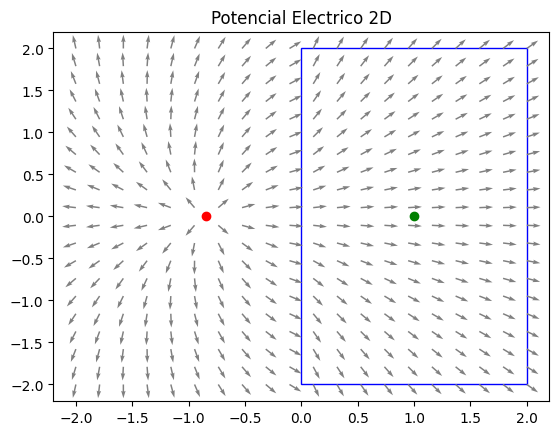

In [ ]:
Er=5
q1=(-0.85,0,3)
q2=(1,0,(-np.abs(Er-1)/np.abs(Er+1))*q1[2])

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_potencial(x,y,q1),calc_dielectric_potencial(x,y,q2,0)])


u,v=normalice(u,v)

dielectrico = patches.Rectangle((0,-2),2,4,fill=False,color="blue")
fig, ax = plt.subplots()

plt.title("Potencial Electrico 2D")
ax.add_patch(dielectrico)
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"go")
plt.quiver(x,y,u,v,color="grey")
plt.show()

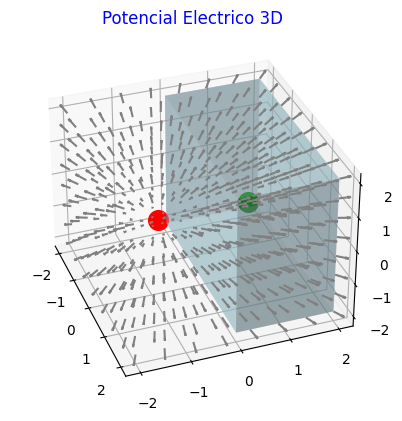

In [ ]:
Er=100
q1=(0,-0.85,0,3)
q2=(0,1,0,(-np.abs(Er-1)/np.abs(Er+1))*q1[3])

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
calc_dielectric_potencial_3D(x,y,z,q2,0)
u,v,w = mean_vectors_arrays([calc_potencial_3D(x,y,z,q1),])
u,v,w= normalice_3D(u,v,w,0.25)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'grey')
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='green',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0,z_plane, alpha=0.4,color="lightblue")
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0+2,z_plane, alpha=0.4,color="lightblue")
y_plane,z_plane=np.meshgrid(np.linspace(0, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(y_plane*0+2,y_plane,z_plane, alpha=0.4,color="lightblue")
y_plane,z_plane=np.meshgrid(np.linspace(0, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(y_plane*0-2,y_plane,z_plane, alpha=0.4,color="lightblue")
x_plane,y_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(0, 2, 2))
ax.plot_surface(x_plane,y_plane,x_plane*0-2, alpha=0.4,color="lightblue")
x_plane,y_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(0, 2, 2))
ax.plot_surface(x_plane,y_plane,x_plane*0+2, alpha=0.4,color="lightblue")

ax.view_init(33, -20)
plt.title("Potencial Electrico 3D ",fontsize=12, color="blue")
plt.show()

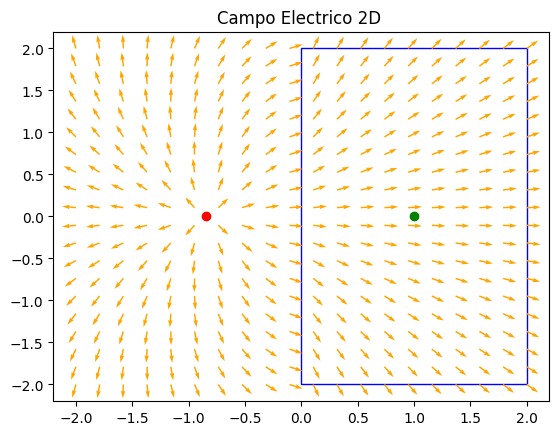

In [ ]:
Er=25
q1=(-0.85,0,3)
q2=(1,0,(-np.abs(Er-1)/np.abs(Er+1))*q1[2])

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))

u,v=mean_vectors_arrays([calc_field(x,y,q1),calc_dielectric_field(x,y,q2,0)])



u,v=normalice(u,v)

dielectrico = patches.Rectangle((0,-2),2,4,fill=False,color="blue")
fig, ax = plt.subplots()

plt.title("Campo Electrico 2D ")
ax.add_patch(dielectrico)
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"go")
plt.quiver(x,y,u,v,color="orange")
plt.show()

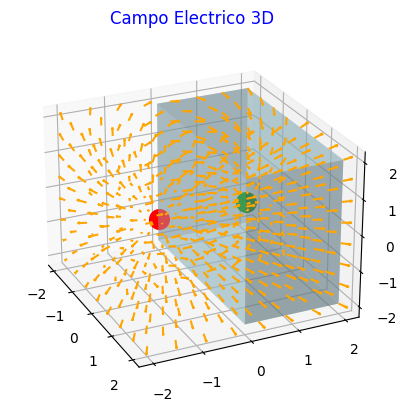

In [ ]:
Er=100
q1=(0,-0.85,0,3)
q2=(0,1,0,(-np.abs(Er-1)/np.abs(Er+1))*q1[3])


x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_field_3D(x,y,z,q1),calc_dielectric_field_3D(x,y,z,q2,0)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'orange')
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='green',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0,z_plane, alpha=0.4,color="lightblue")
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0+2,z_plane, alpha=0.4,color="lightblue")
y_plane,z_plane=np.meshgrid(np.linspace(0, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(y_plane*0+2,y_plane,z_plane, alpha=0.4,color="lightblue")
y_plane,z_plane=np.meshgrid(np.linspace(0, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(y_plane*0-2,y_plane,z_plane, alpha=0.4,color="lightblue")
x_plane,y_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(0, 2, 2))
ax.plot_surface(x_plane,y_plane,x_plane*0-2, alpha=0.4,color="lightblue")
x_plane,y_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(0, 2, 2))
ax.plot_surface(x_plane,y_plane,x_plane*0+2, alpha=0.4,color="lightblue")

ax.view_init(25, -25)
plt.title("Campo Electrico 3D ",fontsize=12, color="blue")
plt.show()

##4. Carga Eléctrica Próxima a un Dieléctrico Semi-Infinito

Potencial y campo eléctrico en un punto x<a:
El potencial en el punto P(x,0) debido a la distribución de carga en el plano x=a vale
$${V}=\frac{-1}{4πɛ_o}(\frac{ɛ_{r}-1}{ɛ_{r}+1})\frac{q}{(2a-x)}$$
Campo electrico:
$${E_{1}}=-\frac{dV}{dX}=\frac{-1}{4πɛ_o}(\frac{ɛ_{r}-1}{ɛ_{r}+1})\frac{q}{(2a-x)^{2}}$$
Potencial y campo eléctrico en un punto x>a:
El potencial debido a la carga puntual q y al plano cargado en los puntos P tales que en x>a es:
$${V}=\frac{1}{4πɛ}\frac{2_{ɛr}}{ɛ_{r}+1}\frac{q}{x}$$
El campo electrico se calcula de la siguiente manera:
$${E_{2}}=-\frac{dV}{dX}=\frac{1}{4πɛ}(\frac{ɛ_{r}-1}{ɛ_{r}+1})\frac{q}{x^{2}}$$

El campo electrico resultante en cada uno de los puntos formados por las cargas puntuales y dicho dielectrico es equivalente o proporcional al producido por dicha carga y un plano indefinido con una densidad de carga σb

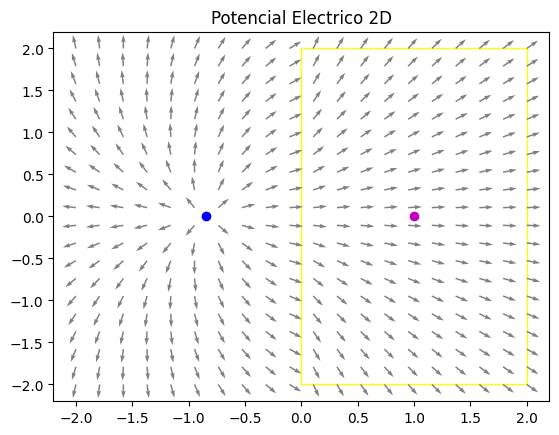

In [ ]:
Er=5
q1=(-0.85,0,3)
q2=(1,0,(-np.abs(Er-1)/np.abs(Er+1))*q1[2])

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_potencial(x,y,q1),calc_dielectric_potencial(x,y,q2,0)])


u,v=normalice(u,v)

dielectrico = patches.Rectangle((0,-2),2,4,fill=False,color="yellow")
fig, ax = plt.subplots()

plt.title("Potencial Electrico 2D")
ax.add_patch(dielectrico)
plt.plot(q1[0],q1[1],"bo")
plt.plot(q2[0],q2[1],"mo")
plt.quiver(x,y,u,v,color="grey")
plt.show()

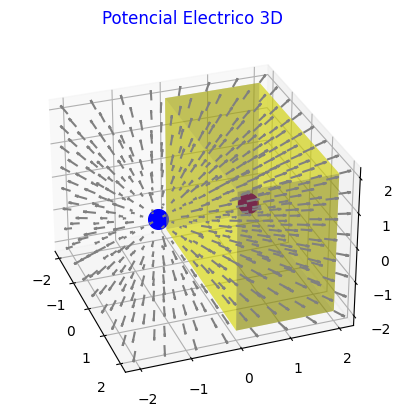

In [ ]:
Er=100
q1=(0,-0.85,0,3)
q2=(0,1,0,(-np.abs(Er-1)/np.abs(Er+1))*q1[3])

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
calc_dielectric_potencial_3D(x,y,z,q2,0)
u,v,w = mean_vectors_arrays([calc_potencial_3D(x,y,z,q1),])
u,v,w= normalice_3D(u,v,w,0.25)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'grey')
ax.scatter(q1[0],q1[1],q1[2],color='blue',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='purple',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0,z_plane, alpha=0.4,color="yellow")
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0+2,z_plane, alpha=0.4,color="yellow")
y_plane,z_plane=np.meshgrid(np.linspace(0, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(y_plane*0+2,y_plane,z_plane, alpha=0.4,color="yellow")
y_plane,z_plane=np.meshgrid(np.linspace(0, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(y_plane*0-2,y_plane,z_plane, alpha=0.4,color="yellow")
x_plane,y_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(0, 2, 2))
ax.plot_surface(x_plane,y_plane,x_plane*0-2, alpha=0.4,color="yellow")
x_plane,y_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(0, 2, 2))
ax.plot_surface(x_plane,y_plane,x_plane*0+2, alpha=0.4,color="yellow")

ax.view_init(30, -20)
plt.title("Potencial Electrico 3D ",fontsize=12, color="blue")
plt.show()

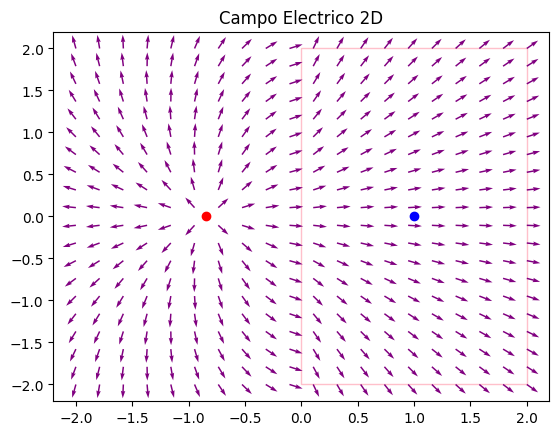

In [ ]:
Er=25
q1=(-0.85,0,3)
q2=(1,0,(-np.abs(Er-1)/np.abs(Er+1))*q1[2])

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))

u,v=mean_vectors_arrays([calc_field(x,y,q1),calc_dielectric_field(x,y,q2,0)])
u,v=normalice(u,v)

dielectrico = patches.Rectangle((0,-2),2,4,fill=False,color="pink")
fig, ax = plt.subplots()

plt.title("Campo Electrico 2D")
ax.add_patch(dielectrico)
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"bo")
plt.quiver(x,y,u,v,color="purple")
plt.show()

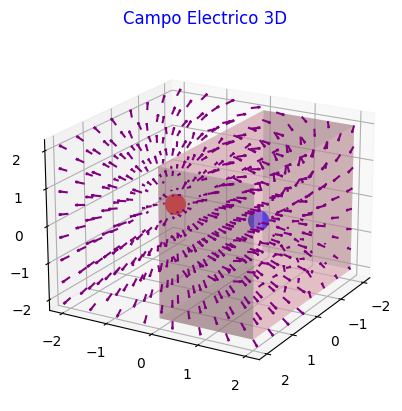

In [ ]:
Er=100
q1=(0,-0.85,0,3)
q2=(0,1,0,(-np.abs(Er-1)/np.abs(Er+1))*q1[3])


x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_field_3D(x,y,z,q1),calc_dielectric_field_3D(x,y,z,q2,0)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'purple')
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='blue',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0,z_plane, alpha=0.4,color="pink")
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0+2,z_plane, alpha=0.4,color="pink")
y_plane,z_plane=np.meshgrid(np.linspace(0, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(y_plane*0+2,y_plane,z_plane, alpha=0.4,color="pink")
y_plane,z_plane=np.meshgrid(np.linspace(0, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(y_plane*0-2,y_plane,z_plane, alpha=0.4,color="pink")
x_plane,y_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(0, 2, 2))
ax.plot_surface(x_plane,y_plane,x_plane*0-2, alpha=0.4,color="pink")
x_plane,y_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(0, 2, 2))
ax.plot_surface(x_plane,y_plane,x_plane*0+2, alpha=0.4,color="pink")

ax.view_init(20, 30)
plt.title("Campo Electrico 3D ",fontsize=12, color="blue")
plt.show()

##5. Potencial Eléctrico entre Placas Paralelas Conectadas con una Placa Vertical.

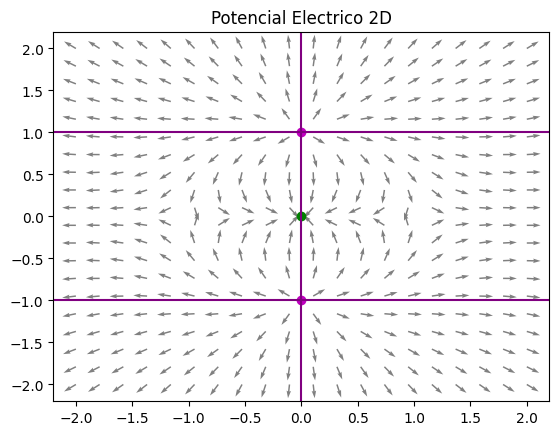

In [ ]:
q1=(0,1,1)
q2=(0,0,-1)
q3=(0,-1,1)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_potencial(x,y,q1),
                         calc_potencial(x,y,q2),
                         calc_potencial(x,y,q3)])
u,v=normalice(u,v)

plt.title("Potencial Electrico 2D")
plt.plot(q1[0],q1[1],"mo")
plt.plot(q2[0],q2[1],"go")
plt.plot(q3[0],q3[1],"mo")
plt.axvline(0,color='purple')
plt.axhline(1,color='purple')
plt.axhline(-1,color='purple')
plt.quiver(x,y,u,v,color="grey")
plt.show()

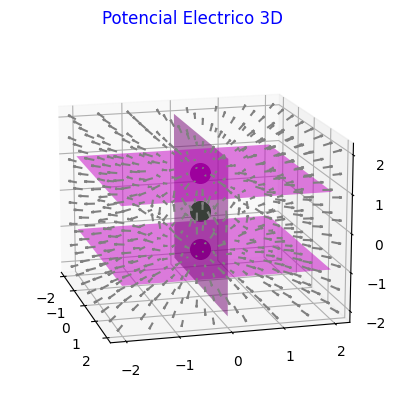

In [ ]:
q1=(0,0,1,1)
q2=(0,0,0,-1)
q3=(0,0,-1,1)

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_potencial_3D(x,y,z,q1),
                             calc_potencial_3D(x,y,z,q2),
                             calc_potencial_3D(x,y,z,q3)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'grey')
ax.view_init(15, -15)
ax.scatter(q1[0],q1[1],q1[2],color='purple',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='green',s=200)
ax.scatter(q3[0],q3[1],q3[2],color='purple',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0,z_plane,color="purple", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,z_plane,z_plane*0+1,color="magenta", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,z_plane,z_plane*0-1,color="magenta", alpha=0.5)
plt.title("Potencial Electrico 3D ",fontsize=12, color="blue")
plt.show()

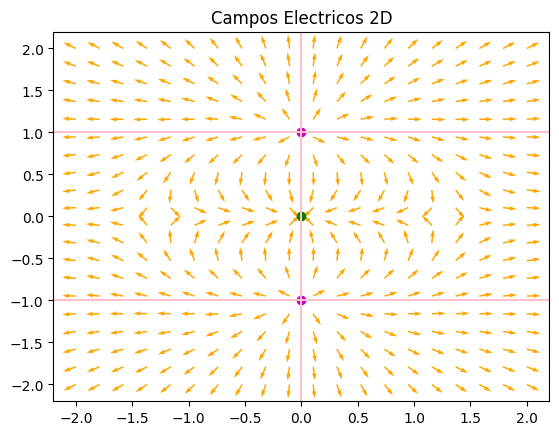

In [ ]:
q1=(0,1,1)
q2=(0,0,-1)
q3=(0,-1,1)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_field(x,y,q1),
                         calc_field(x,y,q2),
                         calc_field(x,y,q3)])

u,v=normalice(u,v)

plt.title("Campos Electricos 2D")
plt.plot(q1[0],q1[1],"mo")
plt.plot(q2[0],q2[1],"go")
plt.plot(q3[0],q3[1],"mo")
plt.axvline(0,color='pink')
plt.axhline(1,color='pink')
plt.axhline(-1,color='pink')
plt.quiver(x,y,u,v,color="orange")
plt.show()

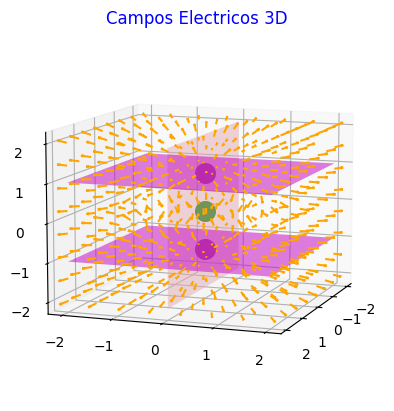

In [ ]:
q1=(0,0,1,1)
q2=(0,0,0,-1)
q3=(0,0,-1,1)

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_field_3D(x,y,z,q1),
                             calc_field_3D(x,y,z,q2),
                             calc_field_3D(x,y,z,q3)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'orange')
ax.view_init(10, 20)
ax.scatter(q1[0],q1[1],q1[2],color='purple',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='green',s=200)
ax.scatter(q3[0],q3[1],q3[2],color='purple',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0,z_plane,color="pink", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,z_plane,z_plane*0+1,color="magenta", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,z_plane,z_plane*0-1,color="magenta", alpha=0.5)
plt.title("Campos Electricos 3D ",fontsize=12, color="blue")
plt.show()

##6. Potencial Eléctrico entre Placas Paralelas Conectadas con Dos Placas Verticales.

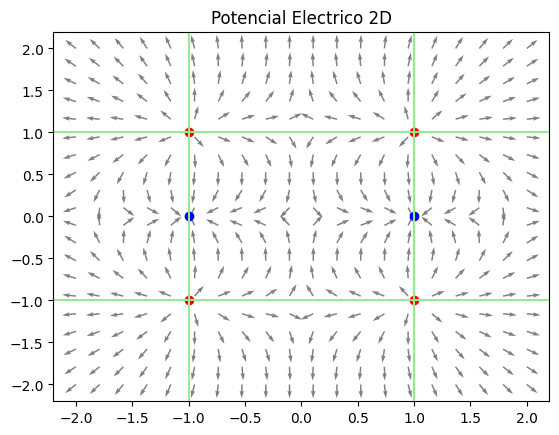

In [ ]:
q1=(-1,1,1)
q2=(-1,0,-1)
q3=(-1,-1,1)

q4=(1,1,1)
q5=(1,0,-1)
q6=(1,-1,1)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_potencial(x,y,q1),
                         calc_potencial(x,y,q2),
                         calc_potencial(x,y,q3),
                         calc_potencial(x,y,q4),
                         calc_potencial(x,y,q5),
                         calc_potencial(x,y,q6)])
u,v=normalice(u,v)

plt.title("Potencial Electrico 2D")
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"bo")
plt.plot(q3[0],q3[1],"ro")
plt.plot(q4[0],q4[1],"ro")
plt.plot(q5[0],q5[1],"bo")
plt.plot(q6[0],q6[1],"ro")
plt.axvline(1,color='lightgreen')
plt.axvline(-1,color='lightgreen')
plt.axhline(1,color='lightgreen')
plt.axhline(-1,color='lightgreen')
plt.quiver(x,y,u,v,color="grey")
plt.show()


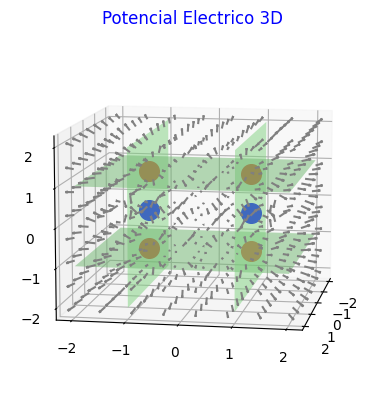

In [ ]:
q1=(0,-1,1,1)
q2=(0,-1,0,-1)
q3=(0,-1,-1,1)
q4=(0,1,1,1)
q5=(0,1,0,-1)
q6=(0,1,-1,1)

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_potencial_3D(x,y,z,q1),
                             calc_potencial_3D(x,y,z,q2),
                             calc_potencial_3D(x,y,z,q3),
                             calc_potencial_3D(x,y,z,q4),
                             calc_potencial_3D(x,y,z,q5),
                             calc_potencial_3D(x,y,z,q6)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'grey')
ax.view_init(10, 10)
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='blue',s=200)
ax.scatter(q3[0],q3[1],q3[2],color='red',s=200)

ax.scatter(q4[0],q4[1],q4[2],color='red',s=200)
ax.scatter(q5[0],q5[1],q5[2],color='blue',s=200)
ax.scatter(q6[0],q6[1],q6[2],color='red',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0-1,z_plane,color="lightgreen", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0+1,z_plane,color="lightgreen", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,z_plane,z_plane*0+1,color="lightgreen", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,z_plane,z_plane*0-1,color="lightgreen", alpha=0.5)
plt.title("Potencial Electrico 3D ",fontsize=12, color="blue")
plt.show()

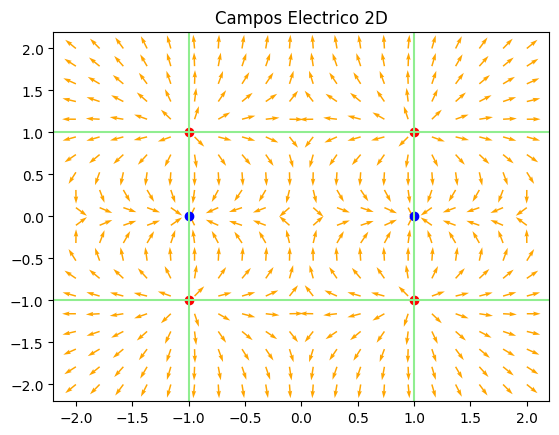

In [ ]:
q1=(-1,1,1)
q2=(-1,0,-1)
q3=(-1,-1,1)

q4=(1,1,1)
q5=(1,0,-1)
q6=(1,-1,1)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([calc_field(x,y,q1),
                         calc_field(x,y,q2),
                         calc_field(x,y,q3),
                         calc_field(x,y,q4),
                         calc_field(x,y,q5),
                         calc_field(x,y,q6)])
u,v=normalice(u,v)

plt.title("Campos Electrico 2D")
plt.plot(q1[0],q1[1],"ro")
plt.plot(q2[0],q2[1],"bo")
plt.plot(q3[0],q3[1],"ro")
plt.plot(q4[0],q4[1],"ro")
plt.plot(q5[0],q5[1],"bo")
plt.plot(q6[0],q6[1],"ro")
plt.axvline(-1,color='lightgreen')
plt.axvline(1,color='lightgreen')
plt.axhline(1,color='lightgreen')
plt.axhline(-1,color='lightgreen')
plt.quiver(x,y,u,v,color="orange")
plt.show()

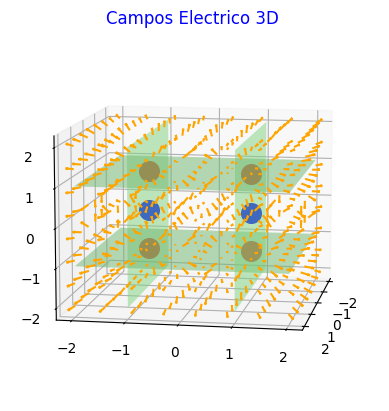

In [ ]:
q1=(0,-1,1,1)
q2=(0,-1,0,-1)
q3=(0,-1,-1,1)
q4=(0,1,1,1)
q5=(0,1,0,-1)
q6=(0,1,-1,1)

x, y, z = np.meshgrid(np.linspace(-2,2,8),np.linspace(-2,2,8),np.linspace(-2,2,8))
u,v,w = mean_vectors_arrays([calc_field_3D(x,y,z,q1),
                             calc_field_3D(x,y,z,q2),
                             calc_field_3D(x,y,z,q3),
                             calc_field_3D(x,y,z,q4),
                             calc_field_3D(x,y,z,q5),
                             calc_field_3D(x,y,z,q6)])
u,v,w= normalice_3D(u,v,w,0.2)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'orange')
ax.view_init(10, 10)
ax.scatter(q1[0],q1[1],q1[2],color='red',s=200)
ax.scatter(q2[0],q2[1],q2[2],color='blue',s=200)
ax.scatter(q3[0],q3[1],q3[2],color='red',s=200)

ax.scatter(q4[0],q4[1],q4[2],color='red',s=200)
ax.scatter(q5[0],q5[1],q5[2],color='blue',s=200)
ax.scatter(q6[0],q6[1],q6[2],color='red',s=200)

x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0-1,z_plane,color="lightgreen", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,x_plane*0+1,z_plane,color="lightgreen", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,z_plane,z_plane*0+1,color="lightgreen", alpha=0.5)
x_plane,z_plane=np.meshgrid(np.linspace(-2, 2, 2),np.linspace(-2, 2, 2))
ax.plot_surface(x_plane,z_plane,z_plane*0-1,color="lightgreen", alpha=0.5)
plt.title("Campos Electrico 3D ",fontsize=12, color="blue")
plt.show()

##7. Esfera Conductora en un Campo Eléctrico Uniforme

Potencial eléctrico para r>a; Cuando r es grande los términos Bn/rn+1 tiende a cero, la expresión del potencial será:
$$-{E_{0}rcosθ}=∑^{∞}_{n=0}{A_{n}{r}^{2}{P_{n}}cosθ}$$
Pero cuando la esfera conductora tiende a r=a, tendriamos que el campo y el potencial electrico varian de acuerdo a V(r,θ).
Potencial:
$${V(r,θ) }=\frac{B_{1}}{r^{2}}P_{1}{cosθ}-{E_{0}}rcosθ={E_{0}}(1-\frac{a^{3}}{r^{3}})rcosθ$$
Las componentes del campo eléctrico:
$${E_{r}}=-\frac{dV}{dr}={E_{0}}(1+2\frac{a^{2}}{r^{3}})cosθ$$
$${E_{θ}}=-\frac{1}{r}\frac{dV}{dr}={E_{0}}(1-\frac{a^{2}}{r^{3}})sinθ$$
La carga inducida neta q en la esfera conductora se obtiene multiplicando la densidad de carga por el elemento de superficie esférica comprendido entre θ y θ +dθ, sumando para todos los ángulos comprendidos entre 0 y π.
$${q}=\int^{π}_{0}{σ2πa^{2}sinθdθ}=\frac{-R}{d}Q$$

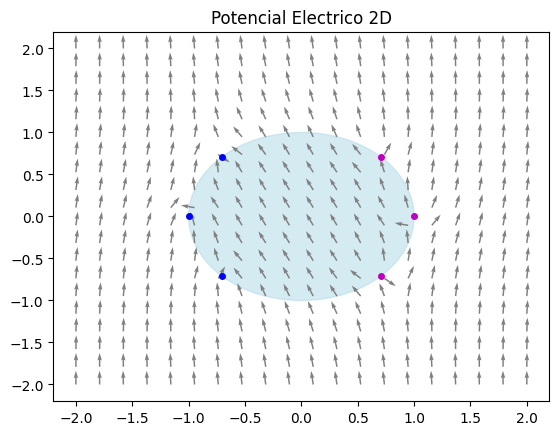

In [ ]:
campo_uniforme=(0,0,8)
esfera=(0,0)

q1=(1,0,1)
q2=(np.sin(np.pi/4),np.cos(np.pi/4),1)
q3=(np.sin(np.pi/4),-np.cos(np.pi/4),1)

q4=(-1,0,-1)
q5=(-np.sin(np.pi/4),np.cos(np.pi/4),-1)
q6=(-np.sin(np.pi/4),-np.cos(np.pi/4),-1)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([
    calc_potencial(np.zeros(x.shape)+0.001,np.ones(y.shape),campo_uniforme),
    calc_potencial(x,y,q1),
    calc_potencial(x,y,q2),
    calc_potencial(x,y,q3),
    calc_potencial(x,y,q4),
    calc_potencial(x,y,q5),
    calc_potencial(x,y,q6)
    ])

u,v=normalice(u,v)

esfera = plt.Circle((0, 0),1, color='lightblue',alpha=0.5)
fig, ax = plt.subplots()

plt.title("Potencial Electrico 2D")
ax.add_artist(esfera)
plt.plot(q1[0],q1[1],"mo",markersize=4)
plt.plot(q2[0],q2[1],"mo",markersize=4)
plt.plot(q3[0],q3[1],"mo",markersize=4)
plt.plot(q4[0],q4[1],"bo",markersize=4)
plt.plot(q5[0],q5[1],"bo",markersize=4)
plt.plot(q6[0],q6[1],"bo",markersize=4)


plt.quiver(x,y,u,v,color="grey")
plt.show()

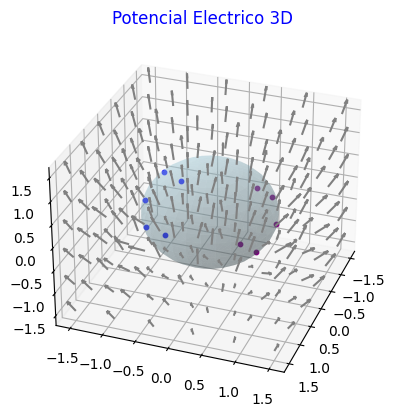

In [ ]:
campo_uniforme=(0,0,0,8)
esfera=(0,0,0)

q1=(0,1,0,1)
q2=(0,np.sin(np.pi/4),np.cos(np.pi/4),1)
q3=(0,np.sin(np.pi/4),-np.cos(np.pi/4),1)
q4=(np.sin(np.pi/4),np.sin(np.pi/4),0,1)
q5=(-np.sin(np.pi/4),np.sin(np.pi/4),0,1)

q6=(0,-1,0,1)
q7=(0,-np.sin(np.pi/4),-np.cos(np.pi/4),1)
q8=(0,-np.sin(np.pi/4),np.cos(np.pi/4),1)
q9=(-np.sin(np.pi/4),-np.sin(np.pi/4),0,1)
q10=(np.sin(np.pi/4),-np.sin(np.pi/4),0,1)


x, y, z = np.meshgrid(np.linspace(-1.5,1.5,6),np.linspace(-1.5,1.5,6),np.linspace(-1.5,1.5,6))
u,v,w = mean_vectors_arrays([
    calc_potencial_3D(np.zeros(y.shape)+0.01,np.zeros(z.shape)+0.01,np.ones(x.shape)-0.01,campo_uniforme),
    calc_potencial_3D(x,y,z,q1),
    calc_potencial_3D(x,y,z,q2),
    calc_potencial_3D(x,y,z,q3),
    calc_potencial_3D(x,y,z,q4),
    calc_potencial_3D(x,y,z,q5),
    calc_potencial_3D(x,y,z,q6),
    calc_potencial_3D(x,y,z,q7),
    calc_potencial_3D(x,y,z,q8),
    calc_potencial_3D(x,y,z,q9),
    calc_potencial_3D(x,y,z,q10)
    ])
u,v,w= normalice_3D(u,v,w,0.3)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'grey')


ax.scatter(q1[0],q1[1],q1[2],color='purple',s=10)
ax.scatter(q2[0],q2[1],q2[2],color='purple',s=10)
ax.scatter(q3[0],q3[1],q3[2],color='purple',s=10)
ax.scatter(q4[0],q4[1],q4[2],color='purple',s=10)
ax.scatter(q5[0],q5[1],q5[2],color='purple',s=10)

ax.scatter(q6[0],q6[1],q6[2],color='blue',s=10)
ax.scatter(q7[0],q7[1],q7[2],color='blue',s=10)
ax.scatter(q8[0],q8[1],q8[2],color='blue',s=10)
ax.scatter(q9[0],q9[1],q9[2],color='blue',s=10)
ax.scatter(q10[0],q10[1],q10[2],color='blue',s=10)

r_cir = 1
u_cir, v_cir = np.mgrid[0:2 * np.pi:30j, 0:np.pi:20j]
x_cir = np.cos(u_cir) * np.sin(v_cir)
y_cir = np.sin(u_cir) * np.sin(v_cir)
z_cir = np.cos(v_cir)
ax.plot_surface(x_cir, y_cir, z_cir, color="lightblue",alpha=0.3)

ax.view_init(30, 20)
plt.title("Potencial Electrico 3D ",fontsize=12, color="blue")
plt.show()

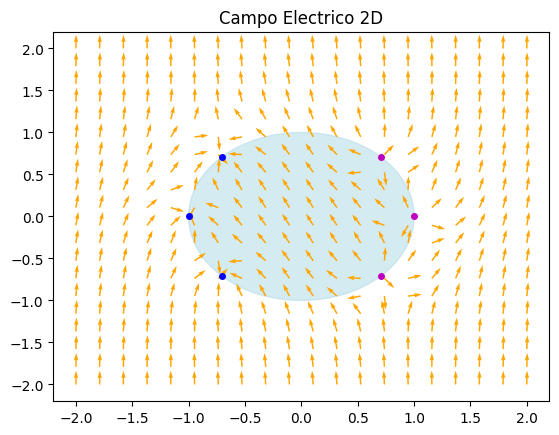

In [ ]:
campo_uniforme=(0,0,8)
esfera=(0,0)

q1=(1,0,1)
q2=(np.sin(np.pi/4),np.cos(np.pi/4),1)
q3=(np.sin(np.pi/4),-np.cos(np.pi/4),1)

q4=(-1,0,-1)
q5=(-np.sin(np.pi/4),np.cos(np.pi/4),-1)
q6=(-np.sin(np.pi/4),-np.cos(np.pi/4),-1)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([
    calc_field(np.zeros(x.shape)+0.001,np.ones(y.shape),campo_uniforme),
    calc_field(x,y,q1),
    calc_field(x,y,q2),
    calc_field(x,y,q3),
    calc_field(x,y,q4),
    calc_field(x,y,q5),
    calc_field(x,y,q6)
    ])

u,v=normalice(u,v)

esfera = plt.Circle((0, 0),1, color='lightblue',alpha=0.5)
fig, ax = plt.subplots()

plt.title("Campo Electrico 2D")
ax.add_artist(esfera)
plt.plot(q1[0],q1[1],"mo",markersize=4)
plt.plot(q2[0],q2[1],"mo",markersize=4)
plt.plot(q3[0],q3[1],"mo",markersize=4)
plt.plot(q4[0],q4[1],"bo",markersize=4)
plt.plot(q5[0],q5[1],"bo",markersize=4)
plt.plot(q6[0],q6[1],"bo",markersize=4)


plt.quiver(x,y,u,v,color="orange")
plt.show()

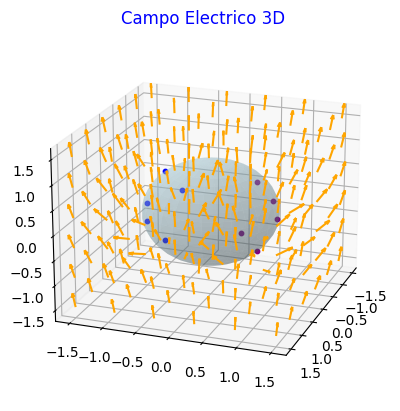

In [ ]:
campo_uniforme=(0,0,0,8)
esfera=(0,0,0)

q1=(0,1,0,1)
q2=(0,np.sin(np.pi/4),np.cos(np.pi/4),1)
q3=(0,np.sin(np.pi/4),-np.cos(np.pi/4),1)
q4=(np.sin(np.pi/4),np.sin(np.pi/4),0,1)
q5=(-np.sin(np.pi/4),np.sin(np.pi/4),0,1)

q6=(0,-1,0,1)
q7=(0,-np.sin(np.pi/4),-np.cos(np.pi/4),1)
q8=(0,-np.sin(np.pi/4),np.cos(np.pi/4),1)
q9=(-np.sin(np.pi/4),-np.sin(np.pi/4),0,1)
q10=(np.sin(np.pi/4),-np.sin(np.pi/4),0,1)


x, y, z = np.meshgrid(np.linspace(-1.5,1.5,6),np.linspace(-1.5,1.5,6),np.linspace(-1.5,1.5,6))
u,v,w = mean_vectors_arrays([
    calc_field_3D(np.zeros(y.shape)+0.01,np.zeros(z.shape)+0.01,np.ones(x.shape)-0.01,campo_uniforme),
    calc_field_3D(x,y,z,q1),
    calc_field_3D(x,y,z,q2),
    calc_field_3D(x,y,z,q3),
    calc_field_3D(x,y,z,q4),
    calc_field_3D(x,y,z,q5),
    calc_field_3D(x,y,z,q6),
    calc_field_3D(x,y,z,q7),
    calc_field_3D(x,y,z,q8),
    calc_field_3D(x,y,z,q9),
    calc_field_3D(x,y,z,q10)
    ])
u,v,w= normalice_3D(u,v,w,0.3)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'orange')


ax.scatter(q1[0],q1[1],q1[2],color='purple',s=10)
ax.scatter(q2[0],q2[1],q2[2],color='purple',s=10)
ax.scatter(q3[0],q3[1],q3[2],color='purple',s=10)
ax.scatter(q4[0],q4[1],q4[2],color='purple',s=10)
ax.scatter(q5[0],q5[1],q5[2],color='purple',s=10)

ax.scatter(q6[0],q6[1],q6[2],color='blue',s=10)
ax.scatter(q7[0],q7[1],q7[2],color='blue',s=10)
ax.scatter(q8[0],q8[1],q8[2],color='blue',s=10)
ax.scatter(q9[0],q9[1],q9[2],color='blue',s=10)
ax.scatter(q10[0],q10[1],q10[2],color='blue',s=10)

r_cir = 1
u_cir, v_cir = np.mgrid[0:2 * np.pi:30j, 0:np.pi:20j]
x_cir = np.cos(u_cir) * np.sin(v_cir)
y_cir = np.sin(u_cir) * np.sin(v_cir)
z_cir = np.cos(v_cir)
ax.plot_surface(x_cir, y_cir, z_cir, color="lightblue",alpha=0.3)

ax.view_init(20, 20)
plt.title("Campo Electrico 3D ",fontsize=12, color="blue")
plt.show()

##8. Esfera Dielectrica en un Campo Eléctrico Uniforme

El potencial en un punto z=rcosθ muy alejado de la esfera de radio a se debe solamente al campo eléctrico uniforme, es V=-E0rcosθ. Las condiciones de contorno son:
$${V(∞,θ) }=-{E_{0}}rcosθ$$
Cuando r tiende a cero:
$${V_{i}(r,θ)}=∑^{∞}_{n=0}{A_{n}{r}^{2}{P_{n}}cosθ}$$
Campo eléctrico y potencial
Las expresiones del potencial en el interior y en el exterior del dieléctrico son:

$${V_{i}(r,θ)}=\frac{-3}{ɛ_r{+2}}E_{0}rcosθ$$
$${V_{e}(r,θ)}=\frac{ɛ_r{-1}}{ɛ_r{+2}}E_{0}{a}^{3}\frac{cosθ}{r^{2}}-E_{0}{r}{cosθ}=(\frac{ɛ_r{-1}}{ɛ_r{+2}}\frac{a^{3}}{r^{3}}-1)E_{0}{r}{cosθ}$$

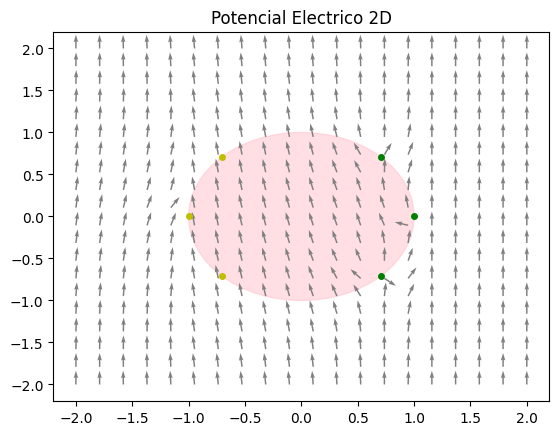

In [ ]:
campo_uniforme=(0,0,8)
esfera=(0,0)

q1=(1,0,1)
q2=(np.sin(np.pi/4),np.cos(np.pi/4),1)
q3=(np.sin(np.pi/4),-np.cos(np.pi/4),1)

q4=(-1,0,-1)
q5=(-np.sin(np.pi/4),np.cos(np.pi/4),-1)
q6=(-np.sin(np.pi/4),-np.cos(np.pi/4),-1)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([
    calc_potencial(np.zeros(x.shape)+0.001,np.ones(y.shape),campo_uniforme),
    calc_dielectric_potencial(x,y,q1,1),
    calc_dielectric_potencial(x,y,q2,1),
    calc_dielectric_potencial(x,y,q3,1),
    calc_dielectric_potencial(x,y,q4,-1),
    calc_dielectric_potencial(x,y,q5,-1),
    calc_dielectric_potencial(x,y,q6,-1)
    ])

u,v=normalice(u,v)

esfera = plt.Circle((0, 0),1, color='pink',alpha=0.5)
fig, ax = plt.subplots()

plt.title("Potencial Electrico 2D")
ax.add_artist(esfera)
plt.plot(q1[0],q1[1],"go",markersize=4)
plt.plot(q2[0],q2[1],"go",markersize=4)
plt.plot(q3[0],q3[1],"go",markersize=4)
plt.plot(q4[0],q4[1],"yo",markersize=4)
plt.plot(q5[0],q5[1],"yo",markersize=4)
plt.plot(q6[0],q6[1],"yo",markersize=4)


plt.quiver(x,y,u,v,color="grey")
plt.show()

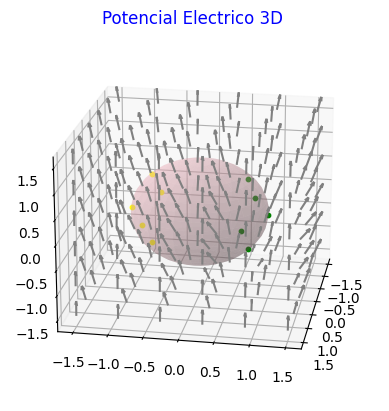

In [ ]:
campo_uniforme=(0,0,0,8)
esfera=(0,0,0)

q1=(0,1,0,1)
q2=(0,np.sin(np.pi/4),np.cos(np.pi/4),1)
q3=(0,np.sin(np.pi/4),-np.cos(np.pi/4),1)
q4=(np.sin(np.pi/4),np.sin(np.pi/4),0,1)
q5=(-np.sin(np.pi/4),np.sin(np.pi/4),0,1)

q6=(0,-1,0,1)
q7=(0,-np.sin(np.pi/4),-np.cos(np.pi/4),1)
q8=(0,-np.sin(np.pi/4),np.cos(np.pi/4),1)
q9=(-np.sin(np.pi/4),-np.sin(np.pi/4),0,1)
q10=(np.sin(np.pi/4),-np.sin(np.pi/4),0,1)


x, y, z = np.meshgrid(np.linspace(-1.5,1.5,6),np.linspace(-1.5,1.5,6),np.linspace(-1.5,1.5,6))
u,v,w = mean_vectors_arrays([
    calc_potencial_3D(np.zeros(y.shape)+0.01,np.zeros(z.shape)+0.01,np.ones(x.shape)-0.01,campo_uniforme),
    calc_dielectric_potencial_3D(x,y,z,q1,1),
    calc_dielectric_potencial_3D(x,y,z,q2,1),
    calc_dielectric_potencial_3D(x,y,z,q3,1),
    calc_dielectric_potencial_3D(x,y,z,q4,1),
    calc_dielectric_potencial_3D(x,y,z,q5,1),
    calc_dielectric_potencial_3D(x,y,z,q6,-1),
    calc_dielectric_potencial_3D(x,y,z,q7,-1),
    calc_dielectric_potencial_3D(x,y,z,q8,-1),
    calc_dielectric_potencial_3D(x,y,z,q9,-1),
    calc_dielectric_potencial_3D(x,y,z,q10,-1)
    ])
u,v,w= normalice_3D(u,v,w,0.3)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'grey')


ax.scatter(q1[0],q1[1],q1[2],color='green',s=10)
ax.scatter(q2[0],q2[1],q2[2],color='green',s=10)
ax.scatter(q3[0],q3[1],q3[2],color='green',s=10)
ax.scatter(q4[0],q4[1],q4[2],color='green',s=10)
ax.scatter(q5[0],q5[1],q5[2],color='green',s=10)

ax.scatter(q6[0],q6[1],q6[2],color='yellow',s=10)
ax.scatter(q7[0],q7[1],q7[2],color='yellow',s=10)
ax.scatter(q8[0],q8[1],q8[2],color='yellow',s=10)
ax.scatter(q9[0],q9[1],q9[2],color='yellow',s=10)
ax.scatter(q10[0],q10[1],q10[2],color='yellow',s=10)

r_cir = 1
u_cir, v_cir = np.mgrid[0:2 * np.pi:30j, 0:np.pi:20j]
x_cir = np.cos(u_cir) * np.sin(v_cir)
y_cir = np.sin(u_cir) * np.sin(v_cir)
z_cir = np.cos(v_cir)
ax.plot_surface(x_cir, y_cir, z_cir, color="pink",alpha=0.3)

ax.view_init(20, 10)
plt.title("Potencial Electrico 3D ",fontsize=12, color="blue")
plt.show()

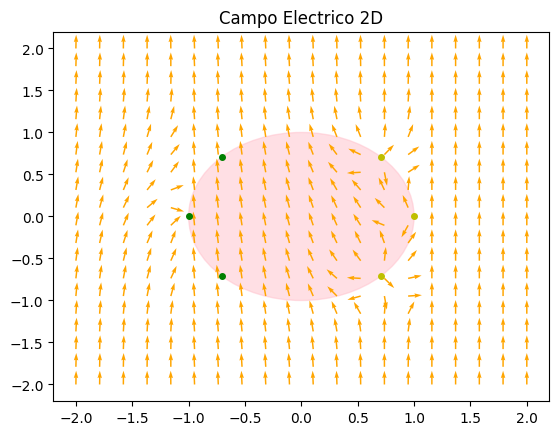

In [ ]:
campo_uniforme=(0,0,8)
esfera=(0,0)

q1=(1,0,1)
q2=(np.sin(np.pi/4),np.cos(np.pi/4),1)
q3=(np.sin(np.pi/4),-np.cos(np.pi/4),1)

q4=(-1,0,-1)
q5=(-np.sin(np.pi/4),np.cos(np.pi/4),-1)
q6=(-np.sin(np.pi/4),-np.cos(np.pi/4),-1)

x,y = np.meshgrid(np.linspace(-2,2,20),np.linspace(-2,2,20))
u,v=mean_vectors_arrays([
    calc_field(np.zeros(x.shape)+0.001,np.ones(y.shape),campo_uniforme),
    calc_dielectric_field(x,y,q1,1),
    calc_dielectric_field(x,y,q2,1),
    calc_dielectric_field(x,y,q3,1),
    calc_dielectric_field(x,y,q4,-1),
    calc_dielectric_field(x,y,q5,-1),
    calc_dielectric_field(x,y,q6,-1)
    ])

u,v=normalice(u,v)

esfera = plt.Circle((0, 0),1, color='pink',alpha=0.5)
fig, ax = plt.subplots()

plt.title("Campo Electrico 2D")
ax.add_artist(esfera)
plt.plot(q1[0],q1[1],"yo",markersize=4)
plt.plot(q2[0],q2[1],"yo",markersize=4)
plt.plot(q3[0],q3[1],"yo",markersize=4)
plt.plot(q4[0],q4[1],"go",markersize=4)
plt.plot(q5[0],q5[1],"go",markersize=4)
plt.plot(q6[0],q6[1],"go",markersize=4)


plt.quiver(x,y,u,v,color="orange")
plt.show()

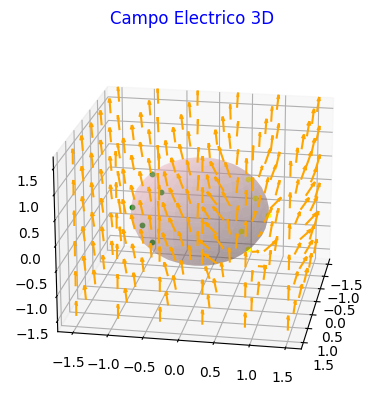

In [ ]:
campo_uniforme=(0,0,0,8)
esfera=(0,0,0)

q1=(0,1,0,1)
q2=(0,np.sin(np.pi/4),np.cos(np.pi/4),1)
q3=(0,np.sin(np.pi/4),-np.cos(np.pi/4),1)
q4=(np.sin(np.pi/4),np.sin(np.pi/4),0,1)
q5=(-np.sin(np.pi/4),np.sin(np.pi/4),0,1)

q6=(0,-1,0,1)
q7=(0,-np.sin(np.pi/4),-np.cos(np.pi/4),1)
q8=(0,-np.sin(np.pi/4),np.cos(np.pi/4),1)
q9=(-np.sin(np.pi/4),-np.sin(np.pi/4),0,1)
q10=(np.sin(np.pi/4),-np.sin(np.pi/4),0,1)


x, y, z = np.meshgrid(np.linspace(-1.5,1.5,6),np.linspace(-1.5,1.5,6),np.linspace(-1.5,1.5,6))
u,v,w = mean_vectors_arrays([
    calc_field_3D(np.zeros(y.shape)+0.01,np.zeros(z.shape)+0.01,np.ones(x.shape)-0.01,campo_uniforme),
    calc_dielectric_field_3D(x,y,z,q1,1),
    calc_dielectric_field_3D(x,y,z,q2,1),
    calc_dielectric_field_3D(x,y,z,q3,1),
    calc_dielectric_field_3D(x,y,z,q4,1),
    calc_dielectric_field_3D(x,y,z,q5,1),
    calc_dielectric_field_3D(x,y,z,q6,-1),
    calc_dielectric_field_3D(x,y,z,q7,-1),
    calc_dielectric_field_3D(x,y,z,q8,-1),
    calc_dielectric_field_3D(x,y,z,q9,-1),
    calc_dielectric_field_3D(x,y,z,q10,-1)
    ])
u,v,w= normalice_3D(u,v,w,0.3)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.quiver(x, y, z, u, v, w,  color = 'orange')


ax.scatter(q1[0],q1[1],q1[2],color='yellow',s=10)
ax.scatter(q2[0],q2[1],q2[2],color='yellow',s=10)
ax.scatter(q3[0],q3[1],q3[2],color='yellow',s=10)
ax.scatter(q4[0],q4[1],q4[2],color='yellow',s=10)
ax.scatter(q5[0],q5[1],q5[2],color='yellow',s=10)

ax.scatter(q6[0],q6[1],q6[2],color='green',s=10)
ax.scatter(q7[0],q7[1],q7[2],color='green',s=10)
ax.scatter(q8[0],q8[1],q8[2],color='green',s=10)
ax.scatter(q9[0],q9[1],q9[2],color='green',s=10)
ax.scatter(q10[0],q10[1],q10[2],color='green',s=10)

r_cir = 1
u_cir, v_cir = np.mgrid[0:2 * np.pi:30j, 0:np.pi:20j]
x_cir = np.cos(u_cir) * np.sin(v_cir)
y_cir = np.sin(u_cir) * np.sin(v_cir)
z_cir = np.cos(v_cir)
ax.plot_surface(x_cir, y_cir, z_cir, color="pink",alpha=0.3)

ax.view_init(20, 10)
plt.title("Campo Electrico 3D ",fontsize=12, color="blue")
plt.show()

#<center> Agenda 3 Entregables Campos Magnéticos Estacionarios

1. ⃗B de un hilo infinito de corriente electrica, graficas 2D y 3D
$$Φm=\int_{s}\overrightarrow{B}\overrightarrow {{d}s}$$
$$Φm=\oint_{s}\overrightarrow{B}\overrightarrow {{d}s}=0$$
$$\oint_{s}\overrightarrow{B}\overrightarrow {{d}l}=μ_{0}I_{T}$$
*μ0 es la permeabilidad del vacío
*dl es un vector tangente a la trayectoria elegida en cada punto
*IT es la corriente neta que atraviesa la superficie delimitada por la trayectoria, y será positiva o negativa según el sentido con el que atraviese a la superficie.
$$\oint\overrightarrow{B}\overrightarrow {{d}l}=μ_{0}I_{T}=\oint{Bdl}={B}\oint{dl}=B2πr=μ_{0}I$$
$${B}=\frac{μ_{0}I}{2πr}$$

2)
$${B}=\frac{μ_{0}I}{4πp}\int^{π/2}_{-π/2}cosα dα φ_{1}=\frac{μ_{0}I}{2πp}φ_{1}$$



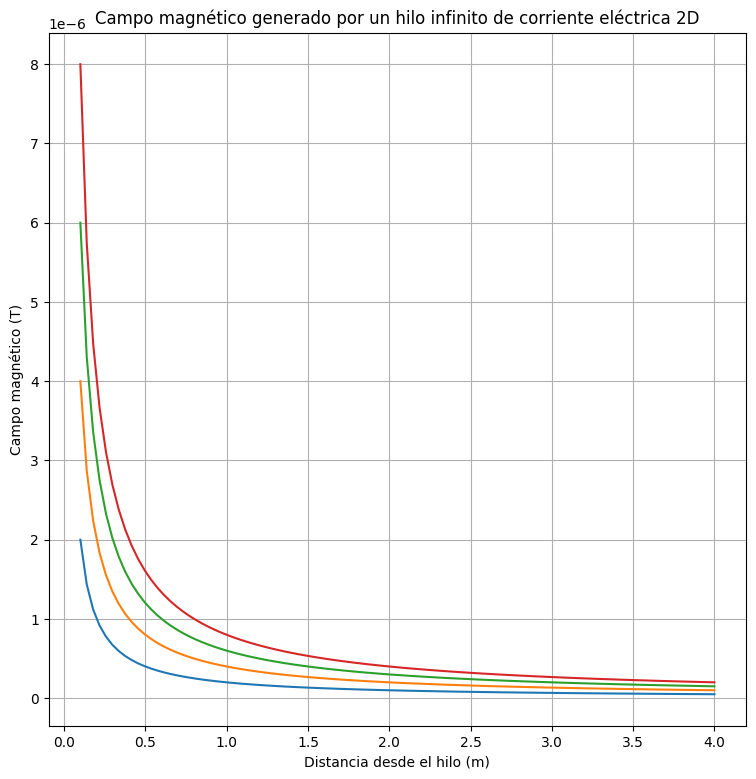

In [ ]:
mu_0 = 4 * np.pi * 10**-7

r = np.linspace(0.1,4, 100)
for I in range(1,5,1):
  B = (mu_0 * I) / (2 * np.pi * r)

  plt.plot(r, B)
plt.xlabel('Distancia desde el hilo (m)')
plt.ylabel('Campo magnético (T)')
plt.title('Campo magnético generado por un hilo infinito de corriente eléctrica 2D')
plt.grid(True)
plt.show()

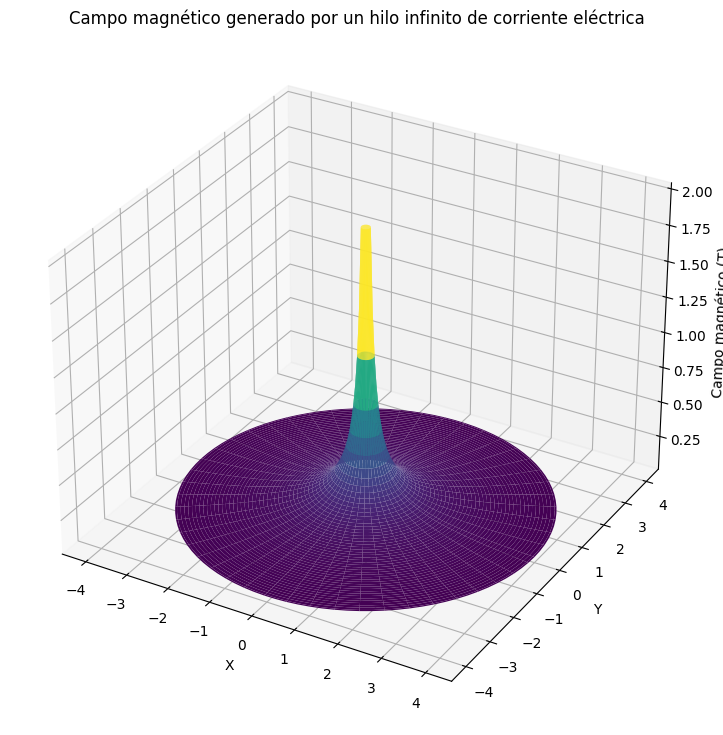

In [ ]:
mu_0 = 4 * np.pi * 10**-7
I = 1.0
r = np.linspace(0.1, 4, 100)


theta = np.linspace(0, 2 * np.pi, 100)
R, Theta = np.meshgrid(r, theta)


X = R * np.cos(Theta)
Y = R * np.sin(Theta)
Z = (mu_0 * I) / (2 * np.pi * R)


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Campo magnético (T)')
ax.set_title('Campo magnético generado por un hilo infinito de corriente eléctrica')
plt.show()

1. ⃗B sobre el eje de una espira circular de corriente electrica de radio a

$${dB_{z}}=\frac{μ_{0}I}{4πp}\frac{dl}{r^{2}}cosθ$$
$${B_{z}}=\frac{μ_{0}I}{4πp}\frac{2πa}{r^{2}}cosθ=\frac{μ_{0}I}{2(a^{2}+b^{2})^{3/2}}$$
La inductancia magnetica es la máxima en el plano del anillo y disminuye como $$z^{2}$$ para $$z^{2}>>a^{2}$$

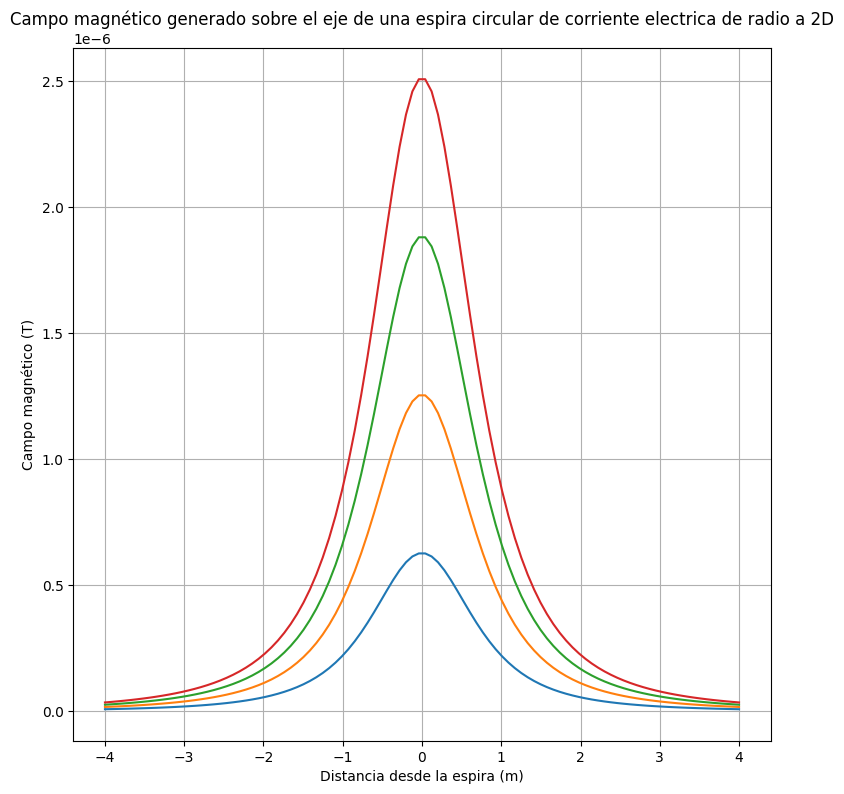

In [ ]:
mu_0 = 4 * np.pi * 10**-7
a=1
z = np.linspace(-4,4, 100)
for I in range(1,5,1):
  B = (mu_0 * I * a**2) / (2 * (a**2 + z**2)**(3/2))

  plt.plot(z, B)
plt.xlabel('Distancia desde la espira (m)')
plt.ylabel('Campo magnético (T)')
plt.title('Campo magnético generado sobre el eje de una espira circular de corriente electrica de radio a 2D')
plt.grid(True)
plt.show()

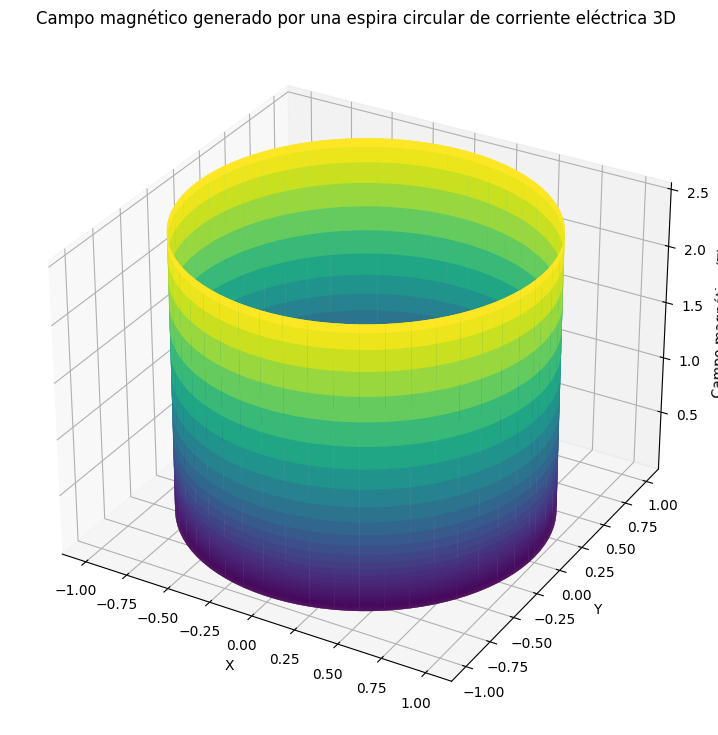

In [ ]:
mu_0 = 4 * np.pi * 10**-7
a = 1.0

z = np.linspace(-5, 5, 100)
phi = np.linspace(0, 2 * np.pi, 100)
Z, Phi = np.meshgrid(z, phi)


X = a * np.cos(Phi)
Y = a * np.sin(Phi)
B = (mu_0 * I * a**2) / (2 * (a**2 + Z**2)**(3/2))


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, B, cmap='viridis')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Campo magnético (T)')
ax.set_title('Campo magnético generado por una espira circular de corriente eléctrica 3D')
plt.show()

##3. Movimiento de una partícula cargada eléctricamente en un campo magnético uniforme.
La ecuación de movimiento de una partícula cargada en un campo magnético es la siguiente:
$$\frac{d\overrightarrow{v}}{dt}=\frac{q}{m}(\overrightarrow{v}x\overrightarrow{B})$$
Elegimos poner la partícula en un campo que está escrito:
$$\overrightarrow{B}=B\overrightarrow{m}i_{x}$$
Por lo tanto, esperamos que la partícula gire en el(y,z).

Text(60, 0, 'B field')

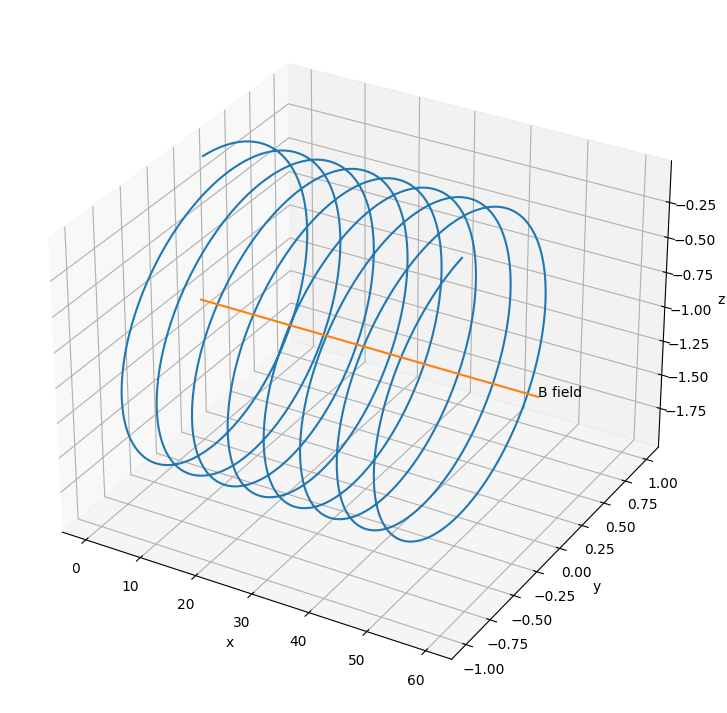

In [ ]:
from scipy.integrate import ode
def newton(t, Y, q, m, B):
    x, y, z = Y[0], Y[1], Y[2]
    u, v, w = Y[3], Y[4], Y[5]

    alpha = q / m * B
    return np.array([u, v, w, 0, alpha * w, -alpha * v])

r = ode(newton).set_integrator('dopri5')
t0 = 0
x0 = np.array([0, 0, 0])
v0 = np.array([1, 1, 0])
initial_conditions = np.concatenate((x0, v0))
r.set_initial_value(initial_conditions, t0).set_f_params(1.0, 1.0, 1.0)
positions = []
t1 = 50
dt = 0.05

while r.successful() and r.t < t1:
    r.integrate(r.t+dt)
    positions.append(r.y[:3])
positions = np.array(positions)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot3D(positions[:, 0], positions[:, 1], positions[:, 2])

B1 = np.array([x0[0], x0[1], -1])
B2 = np.array([60, 0, 0])
B_axis = np.vstack((B1, B1 + B2))
ax.plot3D(B_axis[:, 0],
         B_axis[:, 1],
         B_axis[:, 2])
plt.xlabel('x')
plt.ylabel('y')
ax.set_zlabel('z')
ax.text3D((B1 + B2)[0], (B1 + B2)[1], (B1 + B2)[2], "B field")


4.A de un hilo recto infinito de corriente eléctrica, pagina 324, gráficas 2D y 3D del Potencial Magnético. A⃗ en función de ρ . Ecuación 7.47.

$$A_{z}=2\frac{μ_{0}I}{4π}\int^{L}_{0}\frac{{d}l}{(p^{2}+l^{2})^{1/2}}=\frac{μ_{0}I}{2π}ln[l{(p^{2}+l^{2})^{1/2}}]^{L}_{0}=\frac{μ_{0}I}{2π}ln[l[1+(1+\frac{p^{2}}{L^{2}})^{1/2}]- ln p]≈\frac{μ_{0}I}{2π}ln\frac{2L}{p}$$
Para $${p^{2}}<<{L^{2}}$$


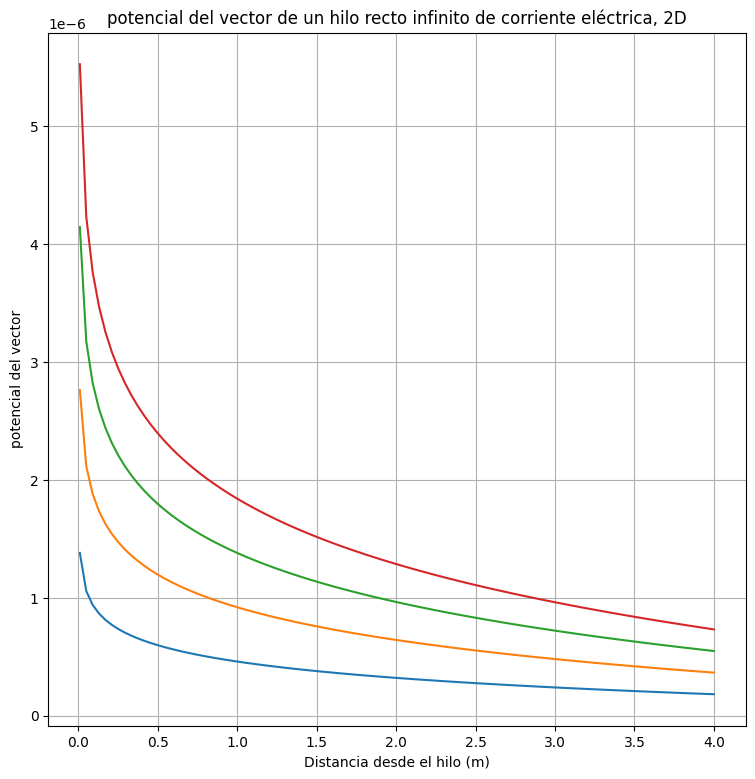

In [ ]:
mu_0 = 4 * np.pi * 10**-7
L=5
p = np.linspace(0.01,4, 100)
for I in range(1,5,1):
  A = ((mu_0 * I) / (2 * np.pi))*(np.log((2*L)/p))

  plt.plot(p, A)
plt.xlabel('Distancia desde el hilo (m)')
plt.ylabel('potencial del vector (T*m/A)')
plt.title('potencial del vector de un hilo recto infinito de corriente eléctrica, 2D')
plt.grid(True)
plt.show()

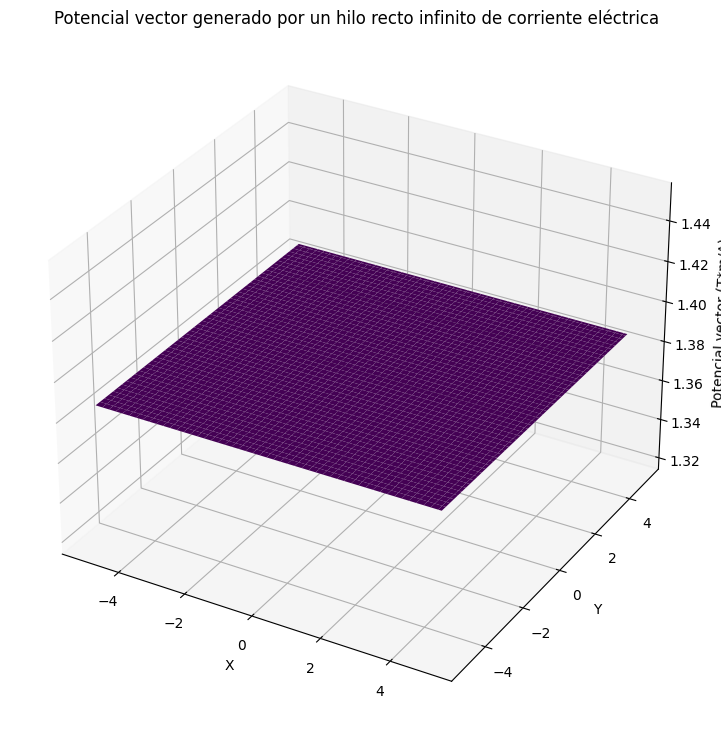

In [ ]:
mu_0 = 4 * np.pi * 10**-7
I = 1.0
L = 1.0
p = 1.0


x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)
A = (mu_0 * I / (2 * np.pi)) * np.log((2 * L) / p) * np.ones_like(X)


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, A, cmap='viridis')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Potencial vector (T*m/A)')
ax.set_title('Potencial vector generado por un hilo recto infinito de corriente eléctrica')
plt.show()

5) A y B de dos hilos de corriente electrica paralelos e infinitos, pagina 326, gráficas 2D y 3D.

$${A_{z}}=\frac{μ_{0}I}{4π} ln(\frac{p_{a}^{2}+4L^{2}}{p_{a}^{2}},\frac{p_{b}^{2}}{p_{b}^{2}+4L^{2}})$$
Cuando hacemos que L tienda a infinito
$${A_{z}}=\frac{μ_{0}I}{4π} ln\frac{p_{b}^{2}}{p_{a}^{2}}=\frac{μ_{0}I}{2π}ln\frac{p_{b}}{p_{a}}.$$
Empleando coordenadas cartesianas:
$$A_{x}=0 , A_{y}=0$$
$${A_{z}}=\frac{μ_{0}I}{4π} ln[\frac{x^{2}+(R - y)^{2}}{x^{2}+y^{2}}]$$
$${B_{x}}=\frac{dA_{z}}{dx}=-\frac{μ_{0}I}{2π}(\frac{(R - y)}{p_{b}^{2}}+\frac {y}{p_{a}^{2}})$$
$${B_{y}}=-\frac{dA_{z}}{dx}=-\frac{μ_{0}I}{2π}(\frac{x}{p_{b}^{2}}+\frac {x}{p_{a}^{2}})$$
$$B_{z}=0$$
$${B_{x}}=-2\frac{μ_{0}I}{2π}(\frac {R}{2})=-\frac{2μ_{0}I}{πR} $$
$$B_{y}=0 , B_{z}=0$$


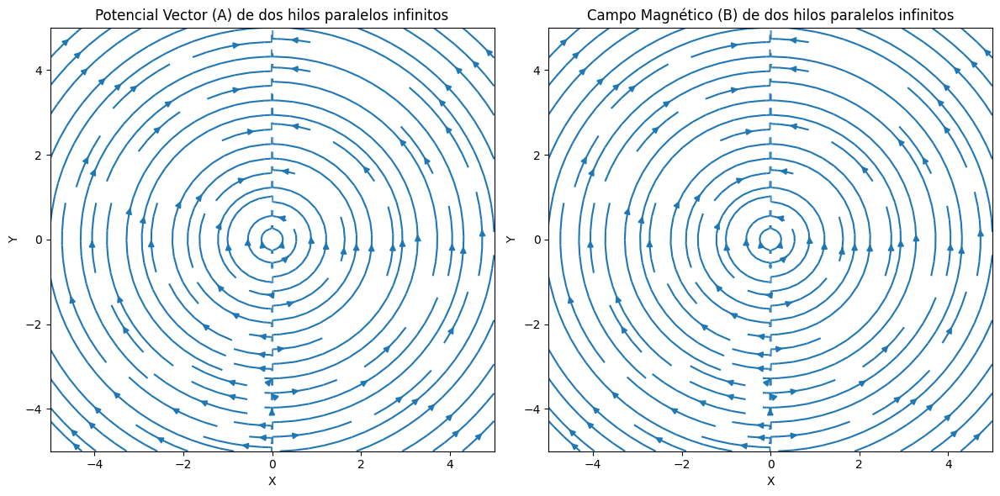

In [ ]:
mu_0 = 4 * np.pi * 10**-7
I = 1.0

x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)


A = (mu_0 * I) / (4 * np.pi) * np.sign(X) / np.sqrt(X**2 + Y**2)
B = (mu_0 * I) / (2 * np.pi) * np.sign(X) / np.sqrt(X**2 + Y**2)

fig = plt.figure(figsize=(12, 6))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

ax1.streamplot(X, Y, -A * Y / np.sqrt(X**2 + Y**2), A * X / np.sqrt(X**2 + Y**2))
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_title('Potencial Vector (A) de dos hilos paralelos infinitos')

ax2.streamplot(X, Y, -B * Y / np.sqrt(X**2 + Y**2), B * X / np.sqrt(X**2 + Y**2))
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Campo Magnético (B) de dos hilos paralelos infinitos')

plt.tight_layout()
plt.show()

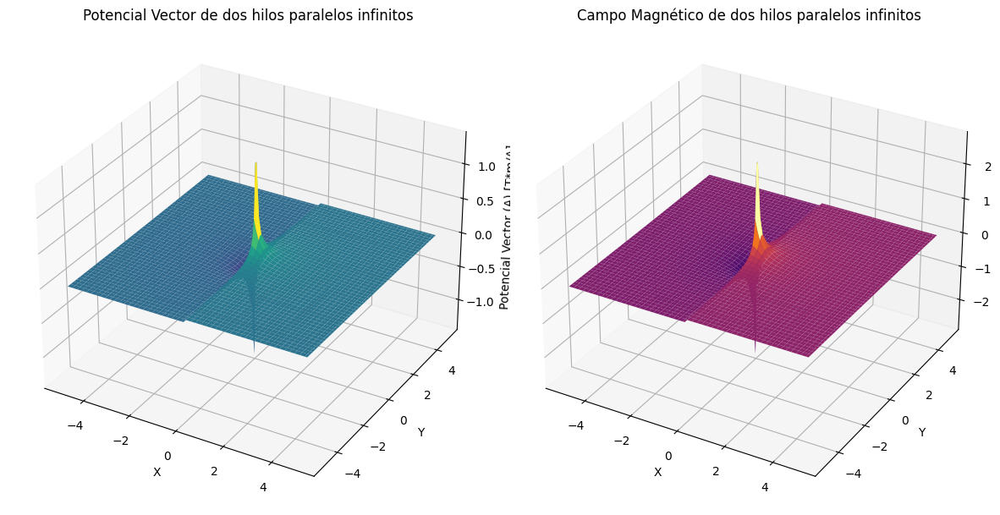

In [ ]:
mu_0 = 4 * np.pi * 10**-7
I = 1.0
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)


A = (mu_0 * I) / (4 * np.pi) * np.sign(X) / np.sqrt(X**2 + Y**2 + Z**2)
B = (mu_0 * I) / (2 * np.pi) * np.sign(X) / np.sqrt(X**2 + Y**2 + Z**2)

# Gráficas
fig = plt.figure(figsize=(12, 6))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')

ax1.plot_surface(X, Y, A, cmap='viridis')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Potencial Vector (A) [T*m/A]')
ax1.set_title('Potencial Vector de dos hilos paralelos infinitos')

ax2.plot_surface(X, Y, B, cmap='inferno')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Campo Magnético (B) [T]')
ax2.set_title('Campo Magnético de dos hilos paralelos infinitos')

plt.tight_layout()
plt.show()

6)B y A conductor cilindrico alargado, pagina 330, gráficas 2D y 3D.
Transporta corriente uniformemente distribuida.
$${I_{f}}=\frac{I}{πR^{2}}.$$
Fuera del conductor, B es acimutal e independiente
$${B}=\frac{μ_{0}I}{2πp}.$$
En el interior del conductor:
$${B}=\frac{μ_{0}Iπp^{2}}{2πp}=\frac{μ_{0}Ip}{2πR^{2}}.$$
Al eje y, en un conductor muy largo, es independiente de la coordenada axial z.
$$-{A(R)l+A(p)l}=Φ,$$
Donde A(R) es el valor de A a la distancia R, A(p) su valor en p y Φ el flujo a traves de la superficie del plano radial encerrada por el recorrido.
$${Φ}=\int^{R}_{p}\frac{μ_{0}Ip}{2πR^{2}}l dp=\frac{μ_{0}I}{2πpR^{2}}(R^{2}-p^{2}).$$
En la region exterior al conductor:
$${A(R)}=\frac{μ_{0}I}{2π}ln\frac{2L}{R},$$
Donde L es la mitad de la longitud del conductor:
$${A(p)}=\frac{μ_{0}I}{4π}[ ln \frac{4L^{2}}{R^{2}}+1-\frac{p^{2}}{R^{2}}] ;(p≤R).$$



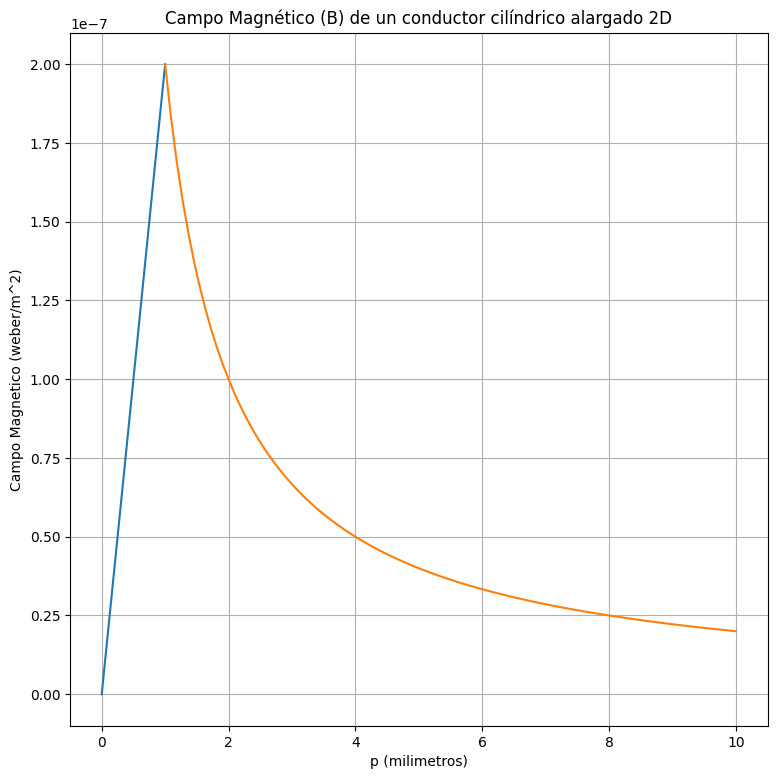

In [ ]:
mu_0 = 4 * np.pi * 10**-7
I = 1.0
R = 1.0
rho1 = np.linspace(0,1,10)
rho2 = np.linspace(1,10,100)

# Campo magnético
B1 = (mu_0*I*rho1)/(2*np.pi*R)
B2 = (mu_0*I)/(2*np.pi*rho2)

ax2.set_title('Campo Magnético (B) de un conductor cilíndrico alargado')
plt.plot(rho1, B1)
plt.plot(rho2, B2)
plt.xlabel('p (milimetros)')
plt.ylabel('Campo Magnetico (weber/m^2)')
plt.title('Campo Magnético (B) de un conductor cilíndrico alargado 2D')
plt.grid(True)
plt.show()

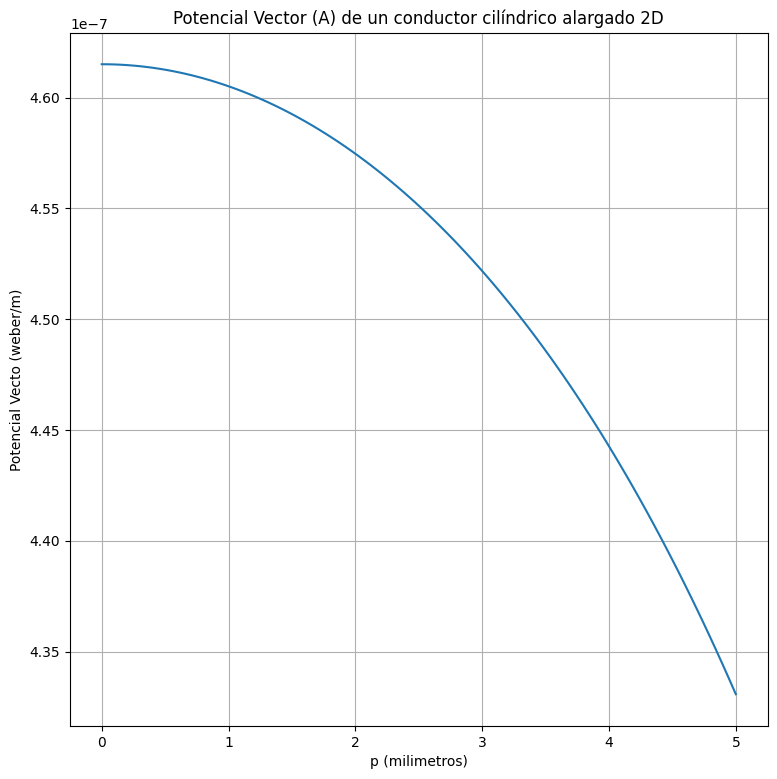

In [ ]:
mu_0 = 4 * np.pi * 10**-7
I = 1.0
R =1
rho = np.linspace(0,5,100)
L=5
A = (mu_0 * I) / (4 * np.pi) * np.log(((4 * (L**2)) / (R**2)) + 1 - ((rho**2) / (R**2)))
plt.plot(rho, A)
plt.xlabel('p (milimetros)')
plt.ylabel('Potencial Vecto (weber/m)')
plt.title('Potencial Vector (A) de un conductor cilíndrico alargado 2D')
plt.grid(True)
plt.show()

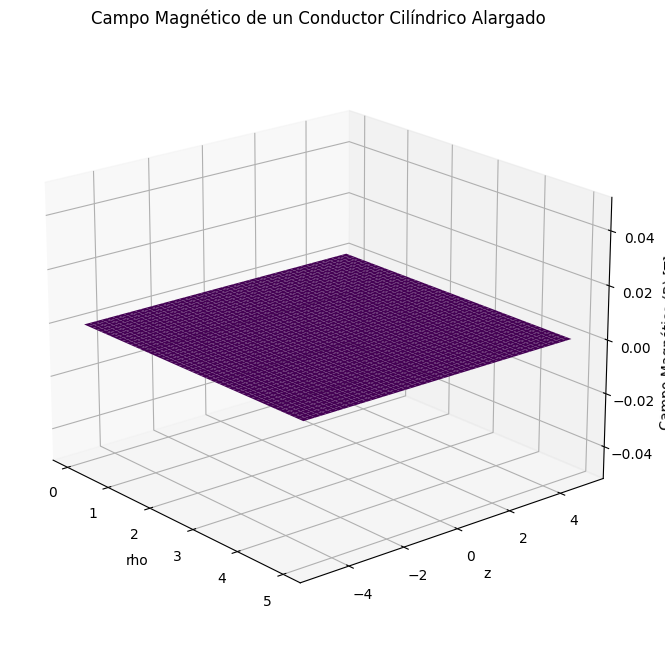

In [ ]:
mu_0 = 4 * np.pi * 10**-7  # Permeabilidad magnética del vacío [T*m/A]
I = 1.0  # Corriente eléctrica en el conductor [A]
R = 1.0  # Radio del conductor [m]
L = 5.0  # Longitud del conductor [m]

# Definición de la función del campo magnético
def magnetic_field(rho, z):
    B_rho = (mu_0 * I * rho) / (2 * np.pi * (rho**2 + z**2))
    B_z = (mu_0 * I * z) / (2 * np.pi * (rho**2 + z**2))
    return B_rho, B_z

# Creación de la malla de puntos
rho = np.linspace(0, 5, 50)
z = np.linspace(-5, 5, 50)
rho, z = np.meshgrid(rho, z)

# Cálculo del campo magnético en cada punto de la malla
B_rho, B_z = magnetic_field(rho, z)

# Creación de la figura
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Graficar el campo magnético con textura
surf = ax.plot_surface(rho, z, np.zeros_like(rho), cmap='viridis', edgecolor='none', shade=False)
surf.set_array(B_rho.flatten())

# Configuraciones adicionales de la gráfica
ax.set_xlabel('rho')
ax.set_ylabel('z')
ax.set_zlabel('Campo Magnético (B) [T]')
ax.set_title('Campo Magnético de un Conductor Cilíndrico Alargado')
ax.view_init(elev=20, azim=-40)

plt.show()

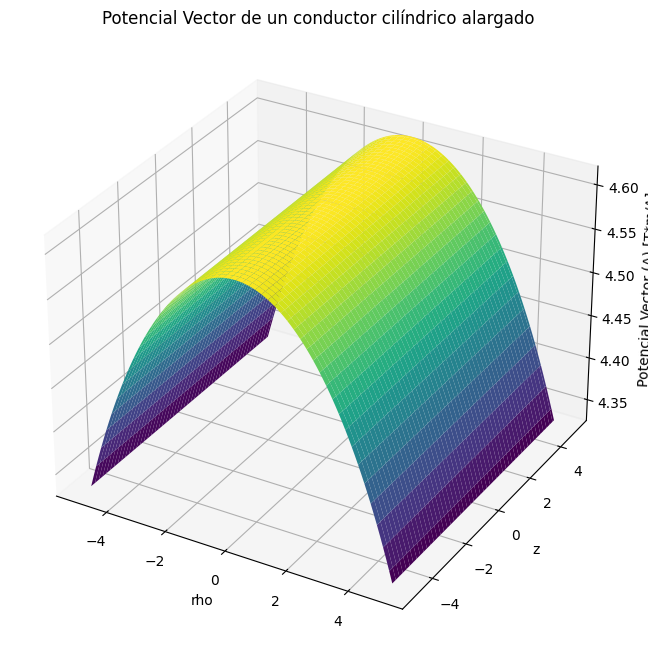

In [ ]:
mu_0 = 4 * np.pi * 10**-7  # Permeabilidad magnética del vacío [T*m/A]
I = 1.0  # Corriente eléctrica en el conductor [A]
R = 1.0  # Radio del conductor [m]
L = 5.0  # Longitud del conductor [m]

# Coordenadas en el espacio tridimensional
rho = np.linspace(-5, 5, 100)
z = np.linspace(-5, 5, 100)
Rho, Z = np.meshgrid(rho, z)

# Potencial vector
A = (mu_0 * I) / (4 * np.pi) * np.log(((4 * (L**2)) / (R**2)) + 1 - ((Rho**2) / (R**2)))

# Gráfica
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.plot_surface(Rho, Z, A, cmap='viridis')
ax.set_xlabel('rho')
ax.set_ylabel('z')
ax.set_zlabel('Potencial Vector (A) [T*m/A]')
ax.set_title('Potencial Vector de un conductor cilíndrico alargado')

plt.show()

7) A y B Dipolo Magnético, graficas 2D y 3D, solamente con lineas sin niguna textura.
$${B}=\frac{μ_{0}}{4πp}\frac{2m}{r^{3}}cosθ,$$
$${B}=\frac{μ_{0}}{4πp}\frac{m}{r^{3}}senθ,$$
$${B_{φ}}=0$$
Este campo B es analogo al campo E de un dipolo electrico.
$${A}=\frac{μ_{0}}{4πp}∮\frac{dl}{r{´}}$$
En consecuencia solo necesitamos calcular la componente y, o acimutal, de A, si a es el radio de la espira entonces:
$${A}=\frac{μ_{0}}{4πp}∮^{3}_{0}\frac{(adφ)cosφ}{r{´}}φ_{1}$$
Donde $$φ_{1}$$ es el vector unitario en la dirección φ en coordenadas esfericas polares.
$${r^{´2}}={r^{2}}{a^{2}}-2arcosψ,$$
$$\frac{r}{r^{´}}=(1-\frac{a^{2}}{r^{´2}}+\frac{2ar}{r^{´2}}cosψ)^{1/2} ≈1-\frac{a^{2}}{2r^{2}}+\frac{a}{r}cosψ$$
$${A}=\frac{μ_{0}}{4πp}∮^{2π}_{0}acosφ(1-\frac{a^{2}}{2r^{2}}+\frac{ax}{r^{2}}cosφ) dφ φ_{1},=\frac{μ_{0}}{4π}\frac{Iπa^{2}}{r^{3}}xφ_{1}=\frac{μ_{0}}{4π}\frac{Iπa^{2}}{r^{2}}senθφ_{1} = \frac{μ_{0}}{4π}\frac{m}{r^{2}}senθφ_{1} =\frac{μ_{0}}{4π}\frac{m x r_{1}}{r^{2}} $$
si escribimos el momento dipolar en la forma vectorial:
$${m}={IS K}=IS$$
Es posible generalizar el concepto de momento dipolar magnetico de la siguiente manera:
$${m}=\frac{1}{2}∮r x I dl,$$
Y se puede generalizar a una distribucion de corriente Jf es un volumen T:
$${m}=\frac{1}{2}∮r x J_{f} dt.$$

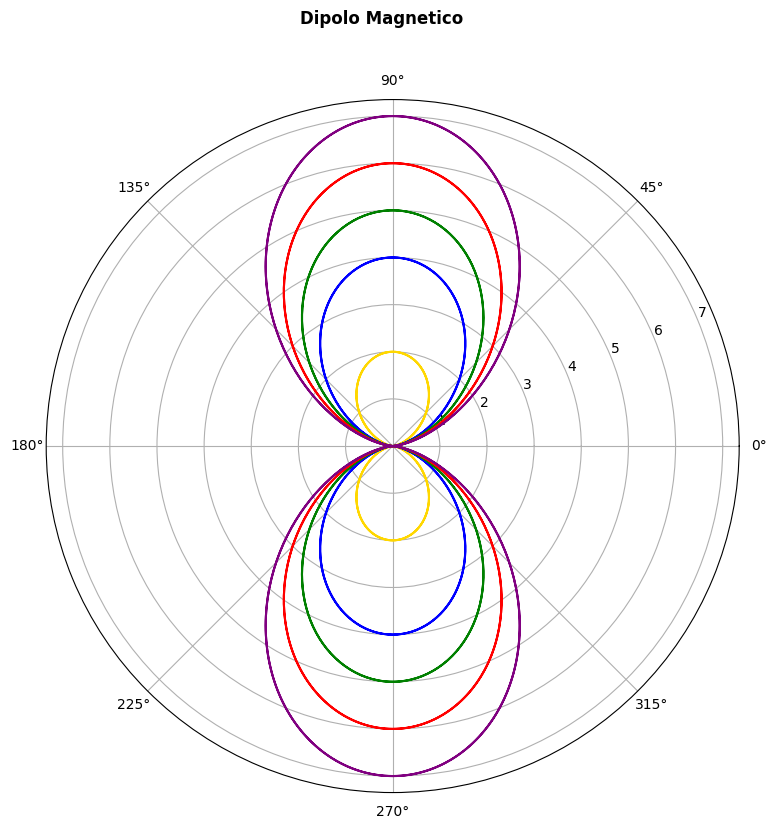

In [ ]:
fig = plt.figure()
fig.suptitle('Dipolo Magnetico',fontweight='bold')


theta = np.arange(0, 4, 0.004)*np.pi

radio1 =1*(np.cos(theta+(np.pi/2)))**2
radio2= 2*(np.cos(theta+(np.pi/2)))**2
radio3= 3*(np.cos(theta+(np.pi/2)))**2
radio4= 4*(np.cos(theta+(np.pi/2)))**2
radio5= 5*(np.cos(theta+(np.pi/2)))**2
radio6= 6*(np.cos(theta+(np.pi/2)))**2
radio7= 7*(np.cos(theta+(np.pi/2)))**2

graf1=plt.polar(theta, radio2, color="gold")
graf1=plt.polar(theta, radio4, color="blue")
graf1=plt.polar(theta, radio5, color="green")
graf1=plt.polar(theta, radio6, color="red")
graf1=plt.polar(theta, radio7, color="purple")

plt.show()



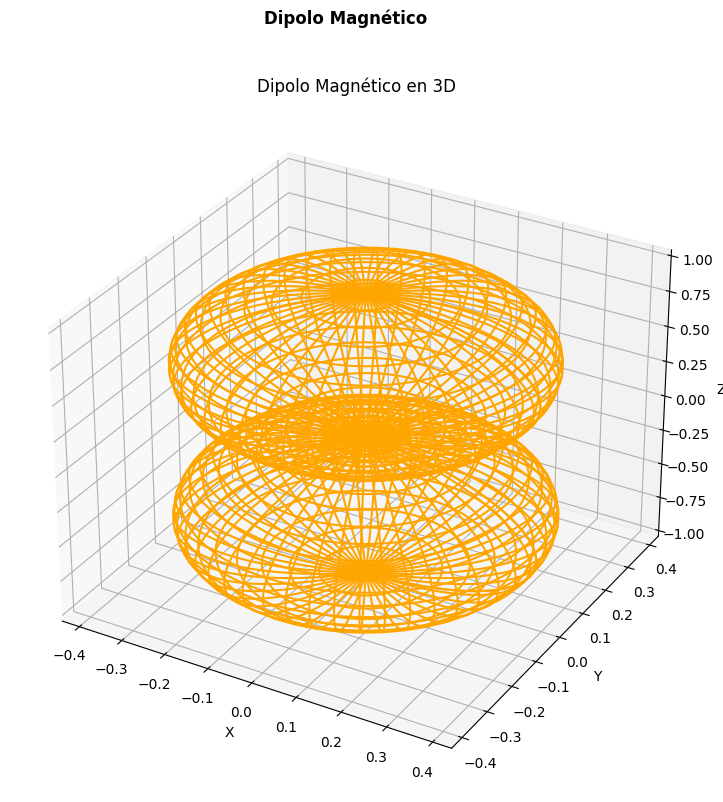

In [ ]:
fig = plt.figure()
fig.suptitle('Dipolo Magnético', fontweight='bold')
ax = fig.add_subplot(111, projection='3d')

theta = np.linspace(0, 2*np.pi, 100)
phi = np.linspace(0, np.pi, 100)
theta, phi = np.meshgrid(theta, phi)

radius = np.cos(phi)**2
x = radius * np.sin(phi) * np.cos(theta)
y = radius * np.sin(phi) * np.sin(theta)
z = radius * np.cos(phi)

ax.plot_wireframe(x, y, z,color='orange')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Dipolo Magnético en 3D')

plt.show()

#<center> Agenda 4 Entregables Campos Magnéticos Variables en el tiempo

1) Fuerza Electromotriz Inducida o Voltaje Inducido en una Espira Fija en un Campo Magnético Dependiente del Tiempo
$$B={B_{0}sen wt}$$
Por estar la espira en reposo, u=0,
$$∇xE=-\frac{dB}{dt}$$
$$∮E*dl=∫_{s}(∇xE)*da=-∫_{s}\frac {dB}{dt}*da$$
$$-{B_{0}wS}cosθ cos wt$$
Donde S= Wh es el area de la espira.

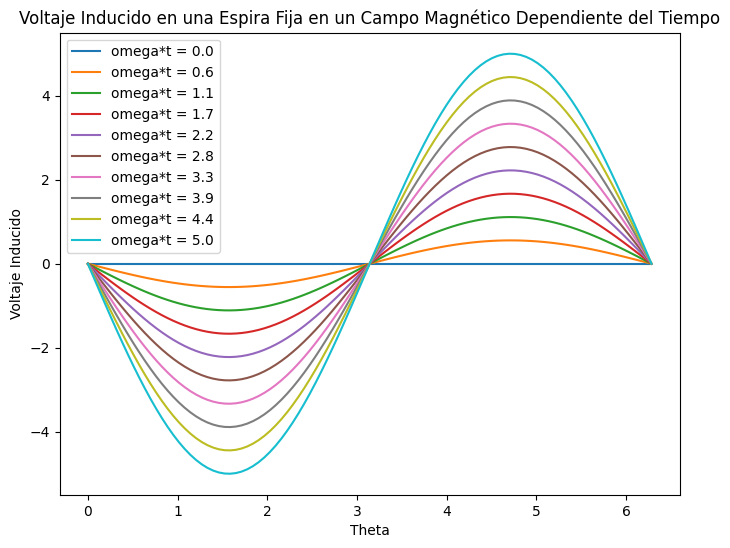

In [ ]:
B0 = 1.0  # Amplitud del campo magnético [T]
omega = np.linspace(0, 5, 10)  # Rango de valores de omega*t
theta = np.linspace(0, 2*np.pi, 100)  # Valores de theta

# Cálculo del voltaje inducido
voltage = -B0 * omega[:, np.newaxis] * np.sin(theta)

# Creación de la figura
fig, ax = plt.subplots(figsize=(8, 6))
ax.set_xlabel('Theta')
ax.set_ylabel('Voltaje Inducido')
ax.set_title('Voltaje Inducido en una Espira Fija en un Campo Magnético Dependiente del Tiempo')

# Graficar el voltaje inducido para cada valor de omega*t
for i in range(len(omega)):
    ax.plot(theta, voltage[i, :], label=f'omega*t = {omega[i]:.1f}')
ax.legend()

plt.show()

2. Fuerza Electromotriz Inducida o Voltaje Inducido en una Espira que gira en un campo magnético, pagina 365, ecuación 845. grafica 2D.

Consideremos la misma espira, que gira con una velocidad angular w sobre el eje x en un campo magnetico B uniforme:
$$∇xE=∇x(uxB)$$
Entonces:
$${E}= u x B$$
y si remplazamos θ=wt:
$$∮E*dl=\oint(uxB)*dl,$$
$${2w}\frac{W}{2}hB senwt$$
(uxB) es normal a dl sobre los trayectos superior e inferior del camino de integración:
$$∮E*dl=BwS senwt$$
Donde S es el area de la espira. La fuerza electromotriz inducida es cero cuando la normal a la espira es paralela a B.

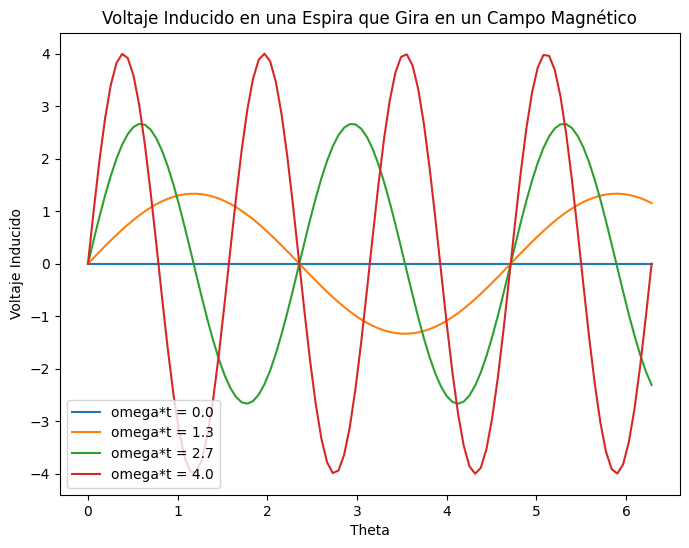

In [ ]:
B0 = 1.0  # Amplitud del campo magnético [T]
omega_range = np.linspace(0, 4, 4)  # Rango de valores para omega*t
theta = np.linspace(0, 2*np.pi, 100)  # Valores de theta

# Creación de la figura
fig, ax = plt.subplots(figsize=(8, 6))

# Bucle para variar omega*t
for omega in omega_range:
    t = omega * theta  # Cálculo del tiempo correspondiente a cada valor de omega*t
    voltage = B0 * omega * np.sin(t)  # Cálculo del voltaje inducido

    # Graficar el voltaje inducido para cada valor de omega*t
    ax.plot(theta, voltage, label=f'omega*t = {omega:.1f}')

ax.set_xlabel('Theta')
ax.set_ylabel('Voltaje Inducido')
ax.set_title('Voltaje Inducido en una Espira que Gira en un Campo Magnético')

plt.legend()
plt.show()

3. Campo Magnético de la Tierra.

$${B(r)}=\frac{μ_{0}}{4πr^{3}}[ {3\hat{r}(\hat{r}{⋅m)-m}}] .$$
donde μ0 es la permeabilidad del vacio.
$${B(r)}=-2B_{0}(\frac{R_{E}}{r})^{3}cosθ$$
$${B(r)}=-B_{0}(\frac{R_{E}}{r})^{3}sen θ$$
$$B_{Φ}=0$$
$${r}=√(x^{2}+y^{2}$$
$${θ}=atan(\frac{y}{x})$$


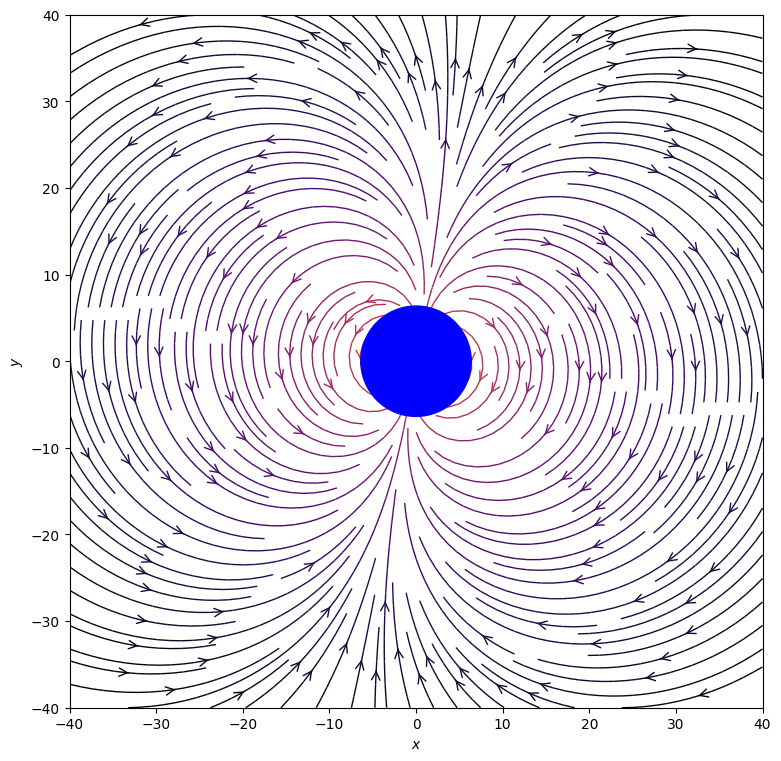

In [ ]:
B0 = 3.12e-5
# Radius of Earth, Mm (10^6 m: mega-metres!)
RE = 6.370
# Deviation of magnetic pole from axis
alpha = np.radians(9.6)

def B(r, theta):
    """Return the magnetic field vector at (r, theta)."""
    fac = B0 * (RE / r)**3
    return -2 * fac * np.cos(theta + alpha), -fac * np.sin(theta + alpha)

# Grid of x, y points on a Cartesian grid
nx, ny = 64, 64
XMAX, YMAX = 40, 40
x = np.linspace(-XMAX, XMAX, nx)
y = np.linspace(-YMAX, YMAX, ny)
X, Y = np.meshgrid(x, y)
r, theta = np.hypot(X, Y), np.arctan2(Y, X)

# Magnetic field vector, B = (Ex, Ey), as separate components
Br, Btheta = B(r, theta)
# Transform to Cartesian coordinates: NB make North point up, not to the right.
c, s = np.cos(np.pi/2 + theta), np.sin(np.pi/2 + theta)
Bx = -Btheta * s + Br * c
By = Btheta * c + Br * s

fig, ax = plt.subplots()

# Plot the streamlines with an appropriate colormap and arrow style
color = 2 * np.log(np.hypot(Bx, By))
ax.streamplot(x, y, Bx, By, color=color, linewidth=1, cmap=plt.cm.inferno,
              density=2, arrowstyle='->', arrowsize=1.5)

# Add a filled circle for the Earth; make sure it's on top of the streamlines.
ax.add_patch(Circle((0,0), RE, color='b', zorder=100))

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_xlim(-XMAX, XMAX)
ax.set_ylim(-YMAX, YMAX)
ax.set_aspect('equal')
plt.show()

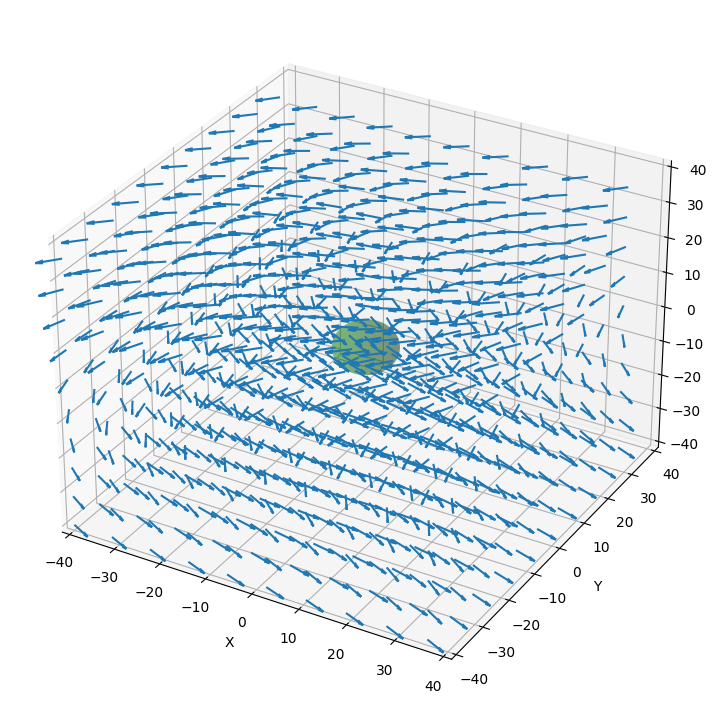

In [ ]:
B0 = 3.12e-5
RE = 6.370
alpha = np.radians(9.6)

def cart2spherical(x, y, z):
    r = np.sqrt(x**2 + y**2 + z**2)
    phi = np.arctan2(y, x)
    theta = np.arccos(z/r)
    return r, theta, phi

def B(r, theta, phi):
    fac = B0 * (RE / r)**3
    B_r = -2 * fac * np.cos(theta + alpha)
    B_theta = -fac * np.sin(theta + alpha)
    B_phi = np.zeros_like(r)  # Assuming no magnetic field in the phi direction
    return B_r, B_theta, B_phi

nx, ny, nz = 20, 20, 20
XMAX, YMAX, ZMAX = 40, 40, 40
x = np.linspace(-XMAX, XMAX, nx)
y = np.linspace(-YMAX, YMAX, ny)
z = np.linspace(-ZMAX, ZMAX, nz)
X, Y, Z = np.meshgrid(x, y, z)

r, theta, phi = cart2spherical(X, Y, Z)
Br, Btheta, Bphi = B(r, theta, phi)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

stride = 2  # Reducing the stride to decrease the number of field lines
ax.quiver(X[::stride, ::stride, ::stride], Y[::stride, ::stride, ::stride], Z[::stride, ::stride, ::stride],
          Br[::stride, ::stride, ::stride], Btheta[::stride, ::stride, ::stride], Bphi[::stride, ::stride, ::stride],
          length=5, normalize=True)

# Plot the sphere
u = np.linspace(0, 2 * np.pi, 100)
v = np.linspace(0, np.pi, 50)
x = RE * np.outer(np.cos(u), np.sin(v))
y = RE * np.outer(np.sin(u), np.sin(v))
z = RE * np.outer(np.ones(np.size(u)), np.cos(v))
ax.plot_surface(x, y, z, color='green', alpha=0.3)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_xlim(-XMAX, XMAX)
ax.set_ylim(-YMAX, YMAX)
ax.set_zlim(-ZMAX, ZMAX)

plt.show()

4. Galmag funcionando, graficas propuestas en el mismo cuaderno


In [ ]:
%pylab inline


import galmag
from galmag.B_field import B_field
from pylab import *

# Maximum and minimum values of the coordinates for each direction
box_limits = [[-15, 15],[-15, 15],[-15, 15]] # kpc
box_resolution = [100,100,100]

B = B_field(box_limits, box_resolution)
reversals_positions = [4.7,12.25] # Requires 2 reversals at 4.1 kpc and 12.25
B_phi_solar_radius = -3 # muG
number_of_modes = 3

B.add_disk_field(reversals=reversals_positions,
                 B_phi_solar_radius=B_phi_solar_radius,
                 number_of_modes=number_of_modes)
Bphi_sun = 0.1 # muG at the Sun's position

B.add_halo_field(halo_ref_Bphi=Bphi_sun)
x = array(B.grid.x[50:,50,50]) # The conversion into a numpy array is sometimes
Bphi = array(B.phi[50:,50,50]) # required to make matplotlib work properly.
y = B.grid.x[50,50,50]
z = B.grid.x[50,50,50]

from galmag.analysis.visualization import plot_x_y_uniform, plot_x_z_uniform, plot_y_z_uniform, std_setup
std_setup() # Sets matplotlib's rc parameters (fonts, colors, sizes, etc)

figure(figsize=(12,3))
title(r'$y={0:.2f}\,\rm kpc$, $z={1:.2f}\,\rm kpc$'.format(y,z))
plot(x, Bphi, )
xlabel(r'$x\,\,[{\rm kpc}]$')
ylabel(r'$B_\phi\,\,[\mu{\rm G}]$')
grid()

figure(figsize=(8,7))
title(r'$z={0:.2f} \,\rm kpc$'.format(z))
plot_x_y_uniform(B.disk, iz=50, field_lines=False)
show()

<image src="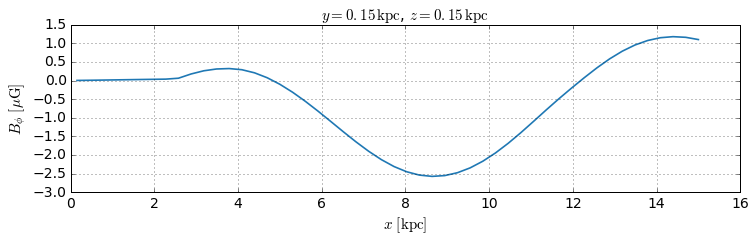">

<image src="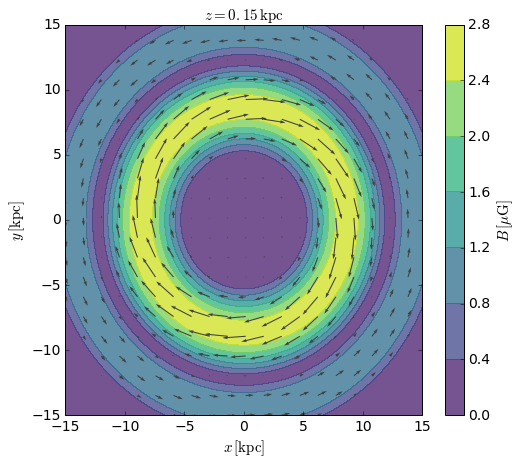">

In [ ]:
x = array(B.grid.x[50:,50,50])
Bphi_halo = array(B.halo.phi[50:,50,50])
Bphi_disk = array(B.disk.phi[50:,50,50])
y = B.grid.x[50,50,50]
z = B.grid.x[50,50,50]

figure(figsize=(12,5))

subplot(2,1,1)
title('$y={0:.2f}$, $z={1:.2f}$'.format(y,z), fontsize=14)
plot(x, Bphi_disk, )
ylabel(r'$B_{\phi,\rm disk}\,\,[\mu{\rm G}]$', fontsize=14)
grid()

subplot(2,1,2)
plot(x, Bphi_halo, )
xlabel(r'$x\,\,[{\rm kpc}]$', fontsize=14)
ylabel(r'$B_{\phi,\rm halo}\,\,[\mu{\rm G}]$', fontsize=14)
grid()
show()

<image src="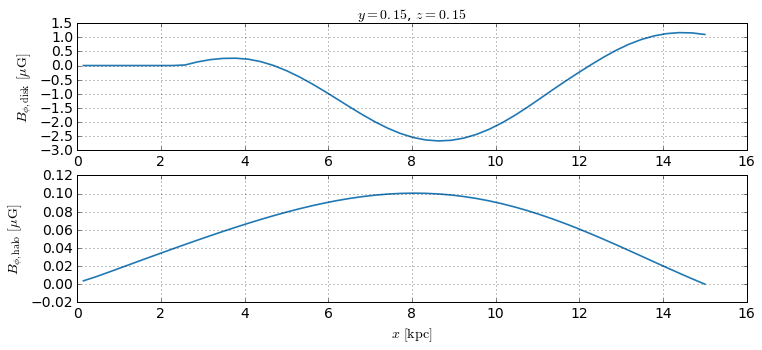">

In [ ]:
B.disk.parameters

{'disk_dynamo_number': -20.4924192,
 'disk_field_decay': True,
 'disk_height': 0.5,
 'disk_height_function': <function galmag.disk_profiles.exponential_scale_height>,
 'disk_modes_normalization': array([ 1.26205786,  0.20083939, -1.54587971]),
 'disk_newman_boundary_condition_envelope': False,
 'disk_radius': 17.0,
 'disk_ref_r_cylindrical': 8.5,
 'disk_regularization_radius': None,
 'disk_rotation_function': <function galmag.disk_profiles.Clemens_Milky_Way_rotation_curve>,
 'disk_shear_function': <function galmag.disk_profiles.Clemens_Milky_Way_shear_rate>,
 'disk_turbulent_induction': 0.386392513}

In [ ]:
from galmag.Grid import Grid

# A cartesian grid can be constructed as follows
cartesian_grid = Grid(box=[[-15, 15],[-15, 15],[-15, 15]],
                      resolution = [12,12,12],
                      grid_type = 'cartesian' # Optional
                      )
# For cylindrical grid, the limits are specified assuming
# the order: r (cylindrical), phi, z
cylindrical_grid = Grid(box=[[0.25, 15],[-pi,pi],[-15,15]],
                      resolution = [9,12,9],
                      grid_type = 'cylindrical')

# For spherical grid, the limits are specified assuming
# the order: r (spherical), theta, phi (azimuth)
spherical_grid = Grid(box=[[0, 15],[0, pi], [-pi,pi],],
                      resolution = [12,10,10],
                      grid_type = 'spherical')
figure(figsize=(12,5))
subplot(1,2,1)
scatter(cartesian_grid.x, cartesian_grid.y, color='y', label='cartesian', alpha=0.5)
scatter(cylindrical_grid.x, cylindrical_grid.y, label='cylindrical', alpha=0.5)
scatter(spherical_grid.x, spherical_grid.y, color='g', label='spherical', alpha=0.5)
xlabel('x'); ylabel('y')
legend()
subplot(1,2,2)
scatter(cartesian_grid.x, cartesian_grid.z, color='y', alpha=0.5)
scatter(cylindrical_grid.x, cylindrical_grid.z, alpha=0.5)
scatter(spherical_grid.x, spherical_grid.z, color='g', alpha=0.5)
xlabel('x'); ylabel('z')
show()

<image src="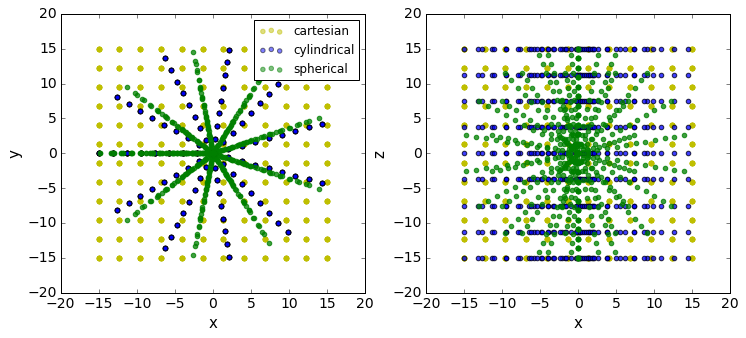">

In [ ]:
figure(figsize=(12,5))
box_limits = [[1e-8, 15],# r [kpc]
              [0,0], # phi
              [0,0]] # z [kpc]
box_resolution = [100,1,1] # No phi or z variation
Bcyl = B_field(box_limits, box_resolution, grid_type='cylindrical')

Bcyl.add_disk_field(disk_modes_normalization=[0,2]) # Skips first mode, normalization 2 for the second mode

y = sqrt(Bcyl.r_cylindrical[:,0,0]**2 + Bcyl.phi[:,0,0]**2 +Bcyl.z[:,0,0]**2)
x = array(Bcyl.grid.r_cylindrical[:,0,0])
plot(x,y)
ylabel(r'$| \mathbf{B}_{\rm mode}|$')
xlabel(r'$R\,[{\rm kpc}]$')
grid()
show()

<image src="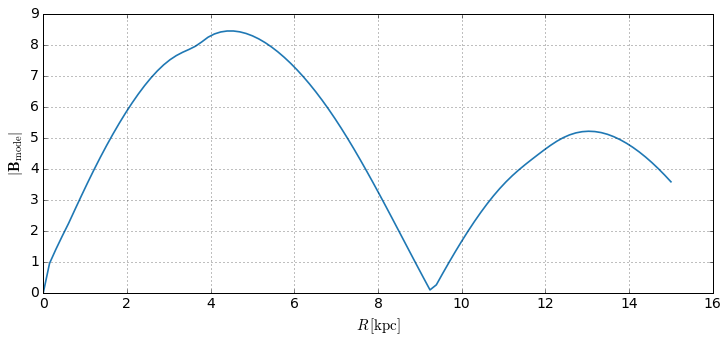">

In [ ]:
figure(figsize=(12,5))
box_limits = [[1e-8, 15],# r [kpc]
              [0,0], # phi
              [0,0]] # z [kpc]
box_resolution = [100,1,1] # No phi or z variation
Bcyl = B_field(box_limits, box_resolution, grid_type='cylindrical')

nmodes = 6

for i in range(nmodes):
    mode_norm = zeros((i+1))
    mode_norm[i]=1

    # Overwrites the disk field with another mode
    Bcyl.add_disk_field(disk_modes_normalization=mode_norm)

    x = array(Bcyl.grid.r_cylindrical[:,0,0])
    y = array(Bcyl.phi[:,0,0])
    plot(x,y/abs(y).max(), label='mode {}'.format(i+1))
    ylabel(r'$B_\phi/\max(B_\phi)$')
    xlabel(r'$R\,[{\rm kpc}]$')
legend(loc='upper left', frameon=False)
grid()
show()

<image src="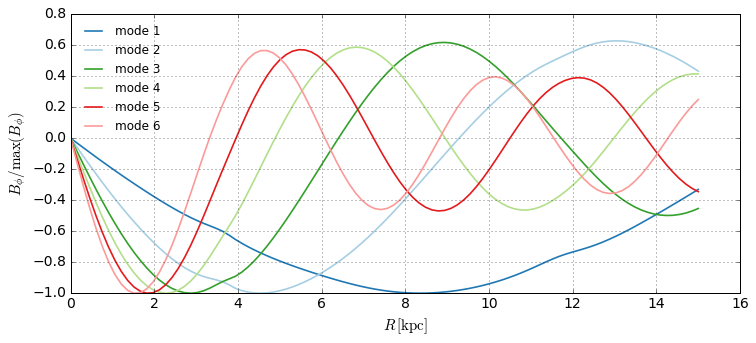">

In [ ]:
figure(figsize=(12,5))
reversals_positions = [3,10]
B_phi_ref = 3 # muG
number_of_modes = 4

Bcyl.add_disk_field(reversals=reversals_positions,
                    B_phi_ref=B_phi_ref,
                    number_of_modes=number_of_modes)

y = array(Bcyl.phi[:,0,0])
x = array(Bcyl.grid.r_cylindrical[:,0,0])
title(r'Reversals at $3$ and $10\,\rm kpc$ using 4 modes.')
plot(x,x*0, 'r:', alpha=0.5)
plot(x,y)
ylabel(r'$B_\phi$')
xlabel(r'$R\,[{\rm kpc}]$')
grid()
show()

<image src="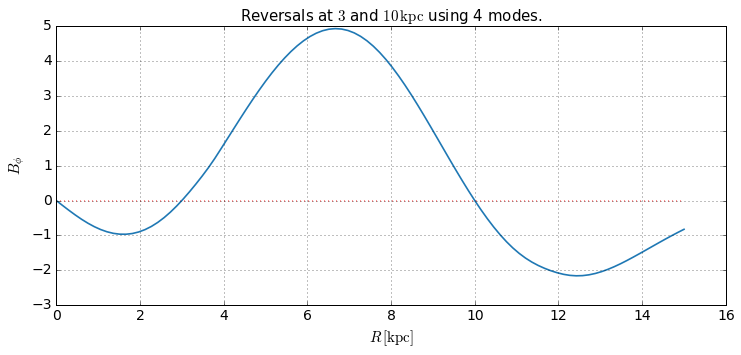">

In [ ]:
Bcyl.parameters

{'disk_dynamo_number': -20.4924192,
 'disk_field_decay': True,
 'disk_height': 0.5,
 'disk_height_function': <function galmag.disk_profiles.exponential_scale_height>,
 'disk_modes_normalization': array([-0.91287645, -0.82464857,  0.83137772,  0.43987423]),
 'disk_newman_boundary_condition_envelope': False,
 'disk_radius': 17.0,
 'disk_ref_r_cylindrical': 8.5,
 'disk_regularization_radius': None,
 'disk_rotation_function': <function galmag.disk_profiles.Clemens_Milky_Way_rotation_curve>,
 'disk_shear_function': <function galmag.disk_profiles.Clemens_Milky_Way_shear_rate>,
 'disk_turbulent_induction': 0.386392513}

In [ ]:
# Using the previously defined B object
B.add_halo_field(
    # Number of free decay modes to be used in the Galerkin expansion
    halo_n_free_decay_modes = 4,
    # cylindrical radius of the reference point
    halo_ref_radius = 9,
    # z coordinate of the reference point
    halo_ref_z = 0.02,
    # B_phi value at the reference point
    halo_ref_Bphi = 4.1, # [muG]
    # Chooses between symmetric and anti-symmetric solution
    halo_symmetric_field = True # Symmetric
    )

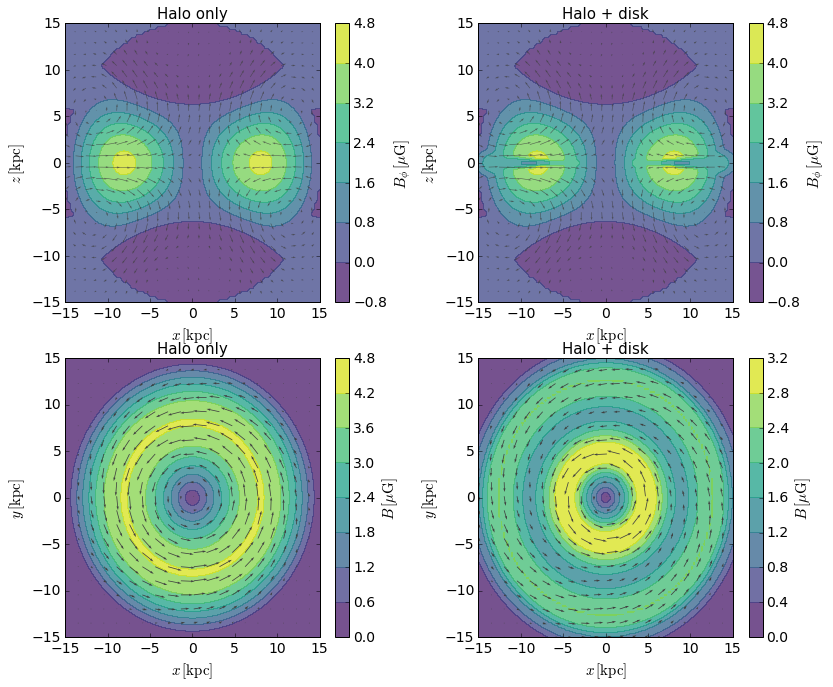

In [ ]:
figure(figsize=(13.1,11))
subplot(2,2,1)
title('Halo only')
plot_x_z_uniform(B.halo, skipx=4,skipz=4, iy=49)
subplot(2,2,2)
title('Halo + disk')
plot_x_z_uniform(B, skipx=4,skipz=4, iy=49)
subplot(2,2,3)
title('Halo only')
plot_x_y_uniform(B.halo, skipy=5,skipx=5, iz=49, field_lines=False)
subplot(2,2,4)
title('Halo + disk')
plot_x_y_uniform(B, skipy=5,skipx=5, iz=49, field_lines=False)
subplots_adjust(wspace=0.3); show()

In [ ]:
from galmag.galerkin import Galerkin_expansion_coefficients
p = { # Square root of the number of grid points used in the calculations
      'halo_Galerkin_ngrid': 500,
      # Function specifying the alpha profile of the halo
      'halo_alpha_function': galmag.halo_profiles.simple_alpha,
      # R_\alpha
      'halo_turbulent_induction': 7.7,
      # R_\omega
     'halo_rotation_induction': 200.0,
      # Number of free decay modes to be used for the expansion
     'halo_n_free_decay_modes': 4,
      # Whether the field is symmetric or antisymmetric
      'halo_symmetric_field': True,
      # Defines the dynamo type
      'halo_dynamo_type': 'alpha-omega',
      # Function specifying the rotation curve of the halo
      'halo_rotation_function': galmag.halo_profiles.simple_V,
      # Parameters used in this function
      'halo_rotation_characteristic_height': 1e3,
      'halo_rotation_characteristic_radius': 3.0,
      # Halo radius
      'halo_radius': 20.,
     }
vals, vecs, Wij = Galerkin_expansion_coefficients(p, return_matrix=True)

In [ ]:
print 'Growth rate: ', B.halo.growth_rate
print 'Coefficients: ', B.halo.coefficients
B.halo.parameters

Growth rate:  (-0.00145691614177+7.12833281594j)
Coefficients:  [ 0.14204046  0.85705205  0.09892466 -0.41854044]


{'halo_Galerkin_ngrid': 501,
 'halo_alpha_function': <function galmag.halo_profiles.simple_alpha>,
 'halo_compute_only_one_quadrant': True,
 'halo_do_not_normalize': False,
 'halo_dynamo_type': 'alpha2-omega',
 'halo_field_coefficients': array([ 0.14204046,  0.85705205,  0.09892466, -0.41854044]),
 'halo_field_growth_rate': (-0.0014569161417716803+7.1283328159406674j),
 'halo_growing_mode_only': False,
 'halo_manually_specified_coefficients': None,
 'halo_n_free_decay_modes': 4,
 'halo_radius': 15.0,
 'halo_ref_Bphi': 4.1,
 'halo_ref_radius': 9,
 'halo_ref_z': 0.02,
 'halo_rotation_characteristic_height': 1000,
 'halo_rotation_characteristic_radius': 3.0,
 'halo_rotation_function': <function galmag.halo_profiles.simple_V>,
 'halo_rotation_induction': 203.65472,
 'halo_symmetric_field': True,
 'halo_turbulent_induction': 4.331}

In [ ]:
print 'The resultant matrix is:\n', Wij

for i, (val, vec) in enumerate(zip(vals, vecs)):
    print '\nSolution ',i
    print ' Growth rate =', val
    for i, c in enumerate(vec):
        print '    a{0} = {1}'.format(i+1, c)

The resultant matrix is:
[[ -2.01907286e+01   1.25796099e+01   1.98749004e+01   1.49625781e+01]
 [  1.38173626e+02  -2.01907286e+01  -1.12128204e+01   0.00000000e+00]
 [ -7.44567493e+00   1.69964882e-03  -4.88311936e+01  -2.27554778e+01]
 [ -7.28474496e+01   0.00000000e+00  -1.54550795e+02  -4.88311936e+01]]

Solution  0
 Growth rate = (-82.5413159253+9.73408942049j)
    a1 = (-0.330455866513+0.0459339957737j)
    a2 = (-0.330455866513-0.0459339957737j)
    a3 = (0.195543470913+0.0392729862923j)
    a4 = (0.195543470913-0.0392729862923j)

Solution  1
 Growth rate = (-82.5413159253-9.73408942049j)
    a1 = (0.772897984614+0j)
    a2 = (0.772897984614-0j)
    a3 = (0.778273486463+0j)
    a4 = (0.778273486463-0j)

Solution  2
 Growth rate = (13.5193937253+9.58533336905j)
    a1 = (0.225666516343-0.104932685324j)
    a2 = (0.225666516343+0.104932685324j)
    a3 = (0.0698536066298-0.181356682277j)
    a4 = (0.0698536066298+0.181356682277j)

Solution  3
 Growth rate = (13.5193937253-9.585333

In [ ]:
from galmag.util import derive

mu = 0
sigma = 0.1 / 6.418 # magic number..

# Defines a random vector potential
Anoise = {} # Dictionary of vector components
for i, c in enumerate(('x','y','z')):
    Anoise[c] = np.random.normal(mu, sigma, B.resolution.prod())
    Anoise[c] = Anoise[c].reshape(B.resolution)

# Prepares the derivatives to compute the curl
dBi_dj ={}
for i, c in enumerate(['x','y','z']):
    for j, d in enumerate(['x','y','z']):
        dj = (B.box[j,-1]-B.box[j,0])/float(B.resolution[j])
        dBi_dj[c,d] = derive(Anoise[c],dj, axis=j)

# Computes the curl of Anoise
tmpBnoise = {}
tmpBnoise['x'] = dBi_dj['z','y'] -  dBi_dj['y','z']
tmpBnoise['y'] = dBi_dj['x','z'] -  dBi_dj['z','x']
tmpBnoise['z'] = dBi_dj['y','x'] -  dBi_dj['x','y']

del dBi_dj; del Anoise

for c in tmpBnoise:
    print 'B{0}: mean = {1}  std = {2}'.format(c,
                                                tmpBnoise[c].mean(),
                                                tmpBnoise[c].std())

By: mean = 5.6358003683e-05  std = 0.0577935431245
Bx: mean = 3.60820220973e-05  std = 0.0578690297384
Bz: mean = 3.4587684843e-05  std = 0.0577817855936


In [ ]:
from galmag.B_field import B_field_component
Bnoise_component = B_field_component(B.grid,
                                     x=tmpBnoise['x'],
                                     y=tmpBnoise['y'],
                                     z=tmpBnoise['z'],
                                     parameters={'mu': mu,
                                                 'sigma':sigma})
del tmpBnoise

In [ ]:
print 'A sample of Bnoise_x'
print Bnoise_component.x[1:3,1:3,1:3]
print '\nA sample of Bnoise_theta'
print Bnoise_component.theta[1:3,1:3,1:3]

A sample of Bnoise_x
[[[ 0.0010388   0.01723265]
  [-0.0641255  -0.03338546]]

 [[ 0.0631408  -0.09107225]
  [ 0.04149053 -0.00163727]]]

A sample of Bnoise_theta
[[[ 0.0037138   0.01227419]
  [-0.04119937 -0.05586022]]

 [[ 0.12316002  0.01498008]
  [ 0.05176351  0.02809413]]]


In [ ]:
B.set_field_component('noise',Bnoise_component)

print 'Brms', (B.noise.x**2+B.noise.y**2+B.noise.z**2).mean()**0.5

Brms 0.10013819776


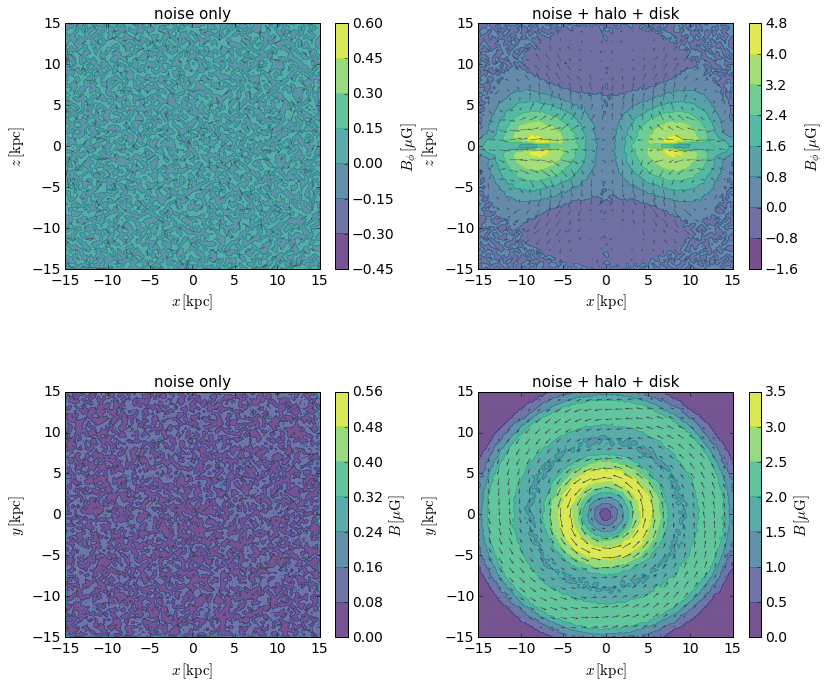

In [ ]:
figure(figsize=(13.1,11))
subplot(2,2,1)
title('noise only')
plot_x_z_uniform(B.noise, skipx=4,skipz=4, iy=49)
subplot(2,2,2)
title('noise + halo + disk')
plot_x_z_uniform(B, skipx=4,skipz=4, iy=49)
subplot(2,2,3)
title('noise only')
plot_x_y_uniform(B.noise, skipy=4,skipx=4, iz=49, field_lines=False)
subplot(2,2,4)
title('noise + halo + disk')
plot_x_y_uniform(B, skipy=4,skipx=4, iz=49, field_lines=False)
subplots_adjust(wspace=0.3, hspace=0.5); show()